# Edge of Antarctica; Looking Into Where Ice and Water Mix.

## U.S. NIC Operational MIZ Product
The U.S. NIC Operation MIZ product classifies sea ice into two categories; between 10% and 80% sea ice concentration greater than 80% sea ice concentration.  This data is initially saved in shapefile format, then converted to ASCII, KMZ and png formats.  The U.S. NIC [daily graphics page](https://www.natice.noaa.gov/daily_graphics.htm) generally describes the process used to generate this product;

> The daily ice edge is analyzed by sea ice experts using multiple sources of near real time satellite data, derived satellite products, buoy data, weather, and analyst interpretation of current sea ice conditions.

Historical png images can be found [here](https://www.natice.noaa.gov/products/miz.html) and all other data types can be found [here](ftp://sidads.colorado.edu/DATASETS/NOAA/G10017/).  Data from this product spans from 2010-current.
[![US NIC MIZ Producct](https://www.natice.noaa.gov/images/polar_miz.png)](https://www.natice.noaa.gov/Main_Products.htm)

## NSIDC Passive-Microwave CDR MIZ Product
The NSIDC offers a climate data record of sea ice concentration derived from passive microwave data.  This dataset is generated from two commonly-used passive microwave algorithms then merged together based on the algorithm with the higher value. This data set spans 1987-current, however only the 2010-current data that overlaps with the NIC product was used in this comparison.  The CDR archive can be found [here](ftp://sidads.colorado.edu/pub/DATASETS/NOAA/G02202_V3) and additional information on this product can be found with the user guide [here](https://nsidc.org/data/g02202).  
[![US NIC MIZ Producct](https://ndownloader.figshare.com/files/23482928/preview/23482928/preview.jpg?private_link=4264c259caccf8e06253)](https://figshare.com/s/4264c259caccf8e06253)


## Important Differences Between Products
The NIC product user guide draft makes an important note that differentiates this product from the NSIDC dataset;

  >Mariners would not expect to encounter sea ice in significant concentrations when sailing outside of the line. Therefore, while it can be thought of as a 10% contour, on a practical level it functions as a contour between open ocean and ice at any concentration.

Therefore, the outer edge of the MIZ as shown by the US NIC product will likely be farther out to sea than the NSIDC product, since the lowest sea ice concentration measured by the latter is 15%.

Per the NSIDC user guide on the CDR product;

>...the concentration value given by the NASA Team algorithm and that given by the Bootstrap algorithm are compared; whichever value is greater is selected as the CDR value. This is done because both algorithms tend to underestimate ice concentration, however the source of this bias differs between algorithms (Meier et al. 2014).

If the passive microwave algorithms do typically underestimate the sea ice concentration values, then the same sea ice concentration thresholds for the inner and outer boundary of the MIZ would result in an MIZ that is further inland when compared to the NIC product.

## Workflow
The following workflow will help compare these two products to get a better sense of which product has a greater extent and, if the extents differ, when do they differ the most?  To start with, the workflow will download all raw data from NSIDC servers between the provided start and end date.  It will then convert this data into comparable numpy arrays and save them to disk so this workflow can be re-run easily with different sea ice concentration thresholds.  For the CDR data, this workflow will simply extract the sea ice concentration variable and write this out to disk.  For the NIC shapefiles, the shapes are rasterized to a grid with the same extent as the CDR data.  The rasterization process marks any pixel whose center falls within the shape the value of the shape.  Using an all-touched method, where any pixels that are touched by a shape are categorized as within the shape, resulted in a significant overestimate of the sea ice extent. 

When running the workflow over a large period of time (in the images populated below, the entire 10-year history was run), it takes a very long to complete the download and conversion process (it typically takes about 6 hours to download and convert all the data).  Once the data is downloaded and optimized, the workflow should run in around 5 minutes.  

This workflow is set up to run the same comparison for both the southern hemisphere and the northern hemisphere.  The northern hemisphere takes roughly twice as long to optimize since there are more shapes to be rasterized in the NIC data.

After downloading and converting the data, this workflow runs through the following analysis steps;

 - Generates overview plots of both products
 - Compares the total area of ice within the following thresholds over the last 3 years as well as the last 10 years;
     - The inner MIZ boundary - 80% sea ice concentration threshold for both datasets
     - The inner MIZ boundary - 10% sea ice concentration for the NIC product and 20% sea ice concentration for the CDR product
 - Calculates the equivalent sea ice concentration in the CDR product to match the NIC product's 80% line
 - Re-generates the above area graphs using the new sea ice concentration thresholds  
 - Generates monthly median ice edge plots for a specified sea ice concentration
 - Animates the median ice edge plots

In [1]:
from collections import OrderedDict
import datetime
import os
import warnings

import matplotlib.pyplot as plt
import matplotlib
import matplotlib.cm as cm
from mpl_toolkits.basemap import Basemap
import numpy as np
import pandas as pd

from modules_new.io import (
    download_cdr_miz_range, 
    download_nic_miz_range, 
    cdr_to_np, nic_to_np,
    get_nic, get_cdr,
    datetime_to_cdr_fname,
    datetime_to_nic_fname,
    get_cdr_metadata
)

from modules_new.compare import (
    calculate_ice_area,
    calculate_ice_footprint_diff,
    median_cdr,
    median_nic
)

from modules_new.display import (
    create_basemap_plot,
    images_to_animation
)

# Filtering the basemap warnings
warnings.filterwarnings(action='ignore')

These start and end times are configurable and referenced throughout this notebook - this is the time range you would like to analyze.  Note that longer time periods take a much longer time to analyze (specifically in the downloading and rasterization steps).  Discussion and interpretation in this notebook is based on the variables as set below.

In [ ]:
### CONFIGURABLE SECTION

# Start and end dates for download and optimization - long-term
start = datetime.datetime(2010, 6, 1)
end = datetime.datetime(2020, 6, 25)

# Start date for download and optimization - short-term
short_term_comparison_start = datetime.datetime(2018, 2, 15)

# Set to False if you don't want a huge amount of output
verbose=False

# Changing this analysis to arctic should be as simple as updating this variable name
folder_name = "antarctic"
#folder_name = "arctic"

In [2]:
long_term_years_analyzed = pd.date_range(start=start, end=end, freq='AS')

if folder_name == 'antarctic':
    hemi = "south"
else:
    hemi = "north"    

# Define the input folders
cdr_input_folder = os.path.join("data", folder_name, "inputs", "cdr")
nic_input_folder = os.path.join("data", folder_name, "inputs", "nic")

The following calls download and convert data.  The execution of this cell will take a long time the first time around and should be faster thereafter.

In [3]:
# Download the data
download_cdr_miz_range(start, end, cdr_input_folder, hemisphere=hemi, verbose=verbose)
download_nic_miz_range(start, end, nic_input_folder, hemisphere=hemi, verbose=verbose)

# Get the metadata and lats/lons from one of the CDR files
# This will be used in the rasterization process
_, fname = datetime_to_cdr_fname(start, hemi)
lats, lons, meta = get_cdr_metadata(os.path.join(cdr_input_folder, fname))

# Optimize the data
cdr_to_np(start, end, cdr_input_folder, hemisphere=hemi, verbose=verbose)
nic_to_np(start, end, nic_input_folder, meta, lats.shape, hemisphere=hemi, verbose=verbose)

Let's take an initial look at the NIC data.  A few things to note about this data;
- While it's originally in vector format, it has been rasterized to compare with the CDR data
- Cell size is 25km by 25km
- It is categorized into two buckets; 10% sea ice concentration and 80% sea ice concentration

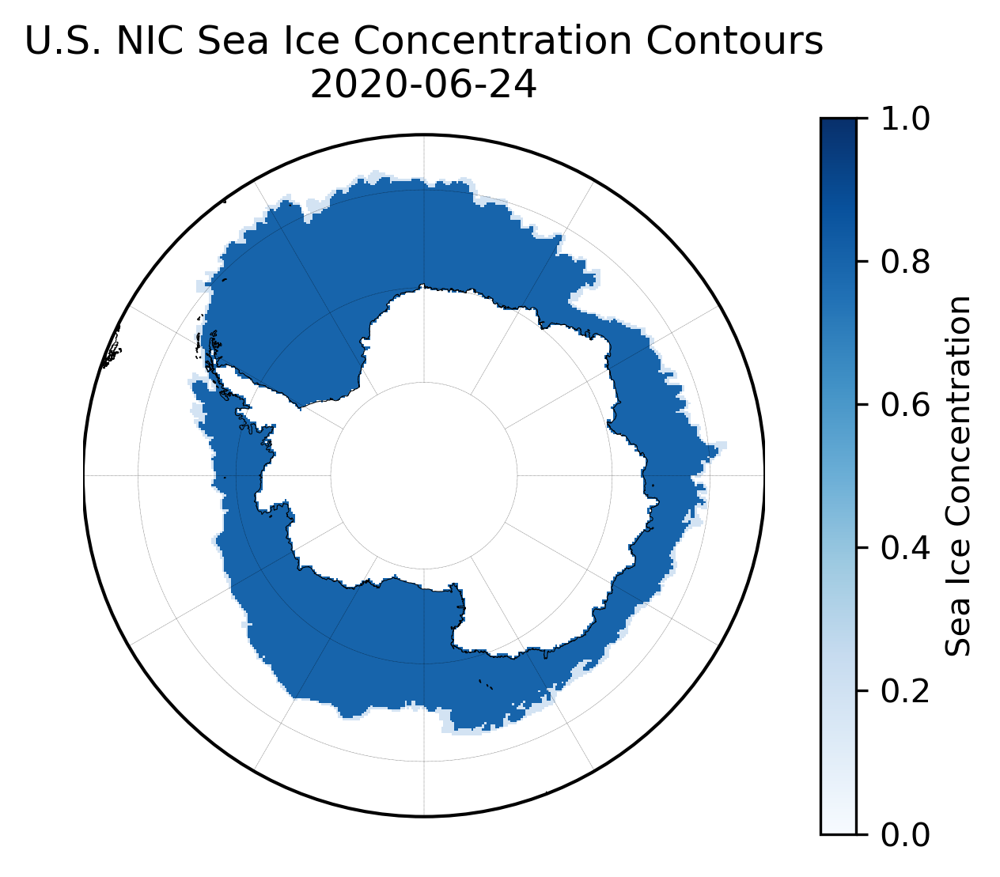

In [4]:
tm = end - datetime.timedelta(days=1)

nic_arr = get_nic(tm, nic_input_folder, hemi)

create_basemap_plot(f"U.S. NIC Sea Ice Concentration Contours\n{tm:%Y-%m-%d}", 
                    lats, 
                    lons, 
                    meta, 
                    [{'grid': nic_arr}], show=True)


Let's take an initial look at the CDR data.  A few things to note about this data;
- Cell size is 25km by 25km
- It is a continuous measure of sea ice concentration instead of bucketed into two categories

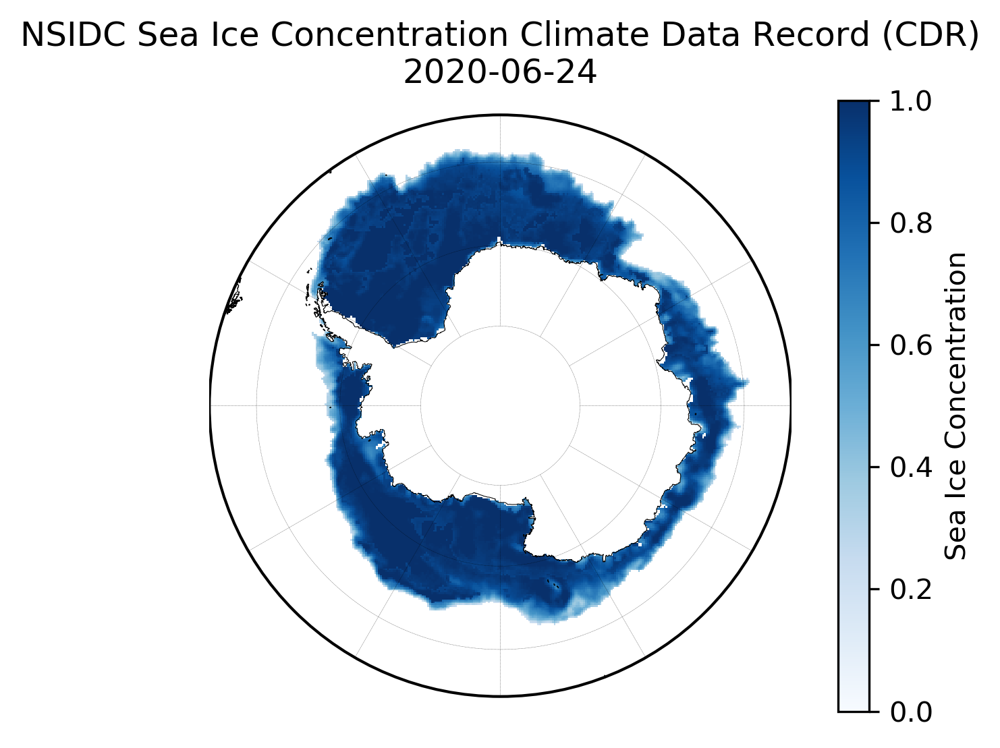

In [5]:
tm = end - datetime.timedelta(days=1)

cdr_arr = get_cdr(tm, cdr_input_folder, hemi)

create_basemap_plot(f"NSIDC Sea Ice Concentration Climate Data Record (CDR)\n{tm:%Y-%m-%d}", 
                    lats, 
                    lons, 
                    meta, 
                    [{'grid': cdr_arr}], show=True)


Calculating a median monthly edge of 80% sea ice concentration for the inside of the marginal ice zone, it is almost immediately evident.  Plotted below are the monthly median sea ice extent for the 80% threshold for each month in the last few years.  Note the sea ice extends significantly farther out to sea in the NIC interpretation.  This is especially evident in the springtime months when melting accelerates and the ice edge recedes.  Passive Microwave models typically underestimate sea ice concentration, so this type of bias is somewhat expected.  

Also - the edge of this extent is significantly smoother than the edge drawn in the NIC dataset.  This may be due to spatial smoothing in the CDR algorithm that is a result of how this data is measured.  Ice measurement values in each pixel in the CDR product can contaminate neighboring pixels, resulting in this type of spatial smoothing.

Working on 2018-03-01 00:00:00 to 2018-03-31 00:00:00


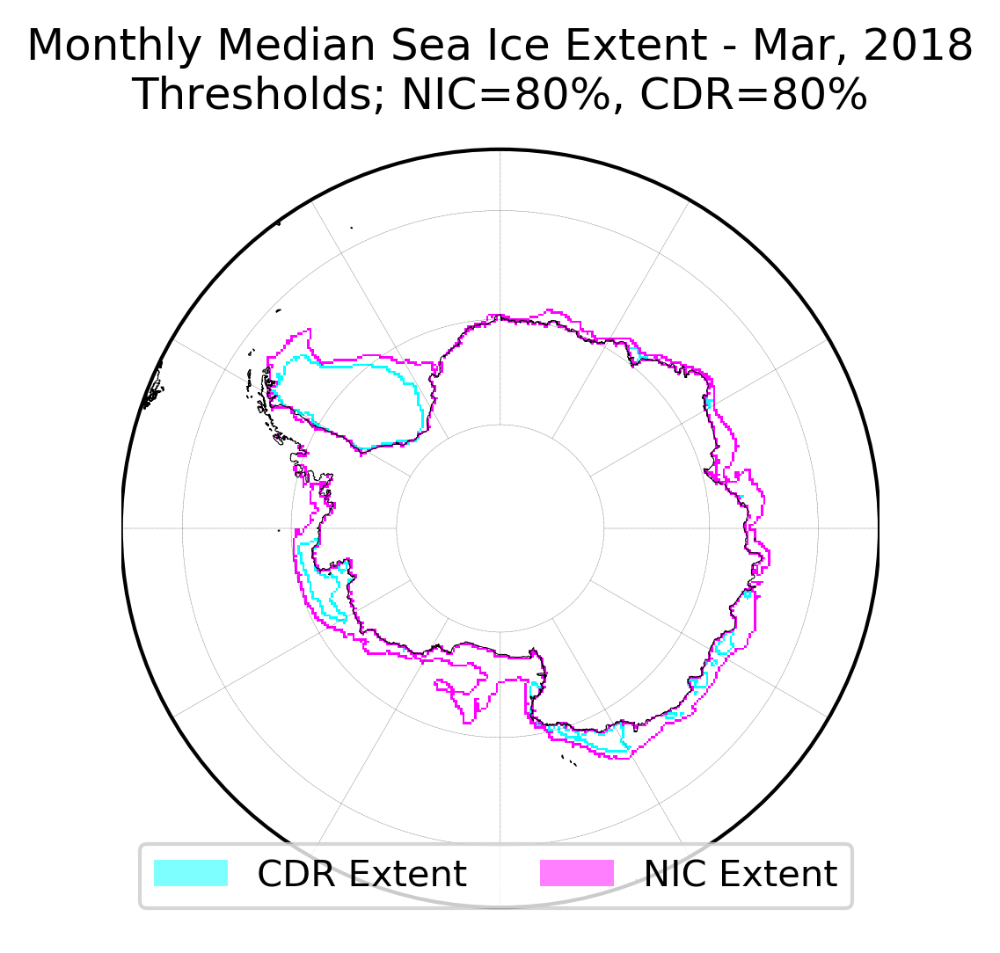

Working on 2018-04-01 00:00:00 to 2018-04-30 00:00:00


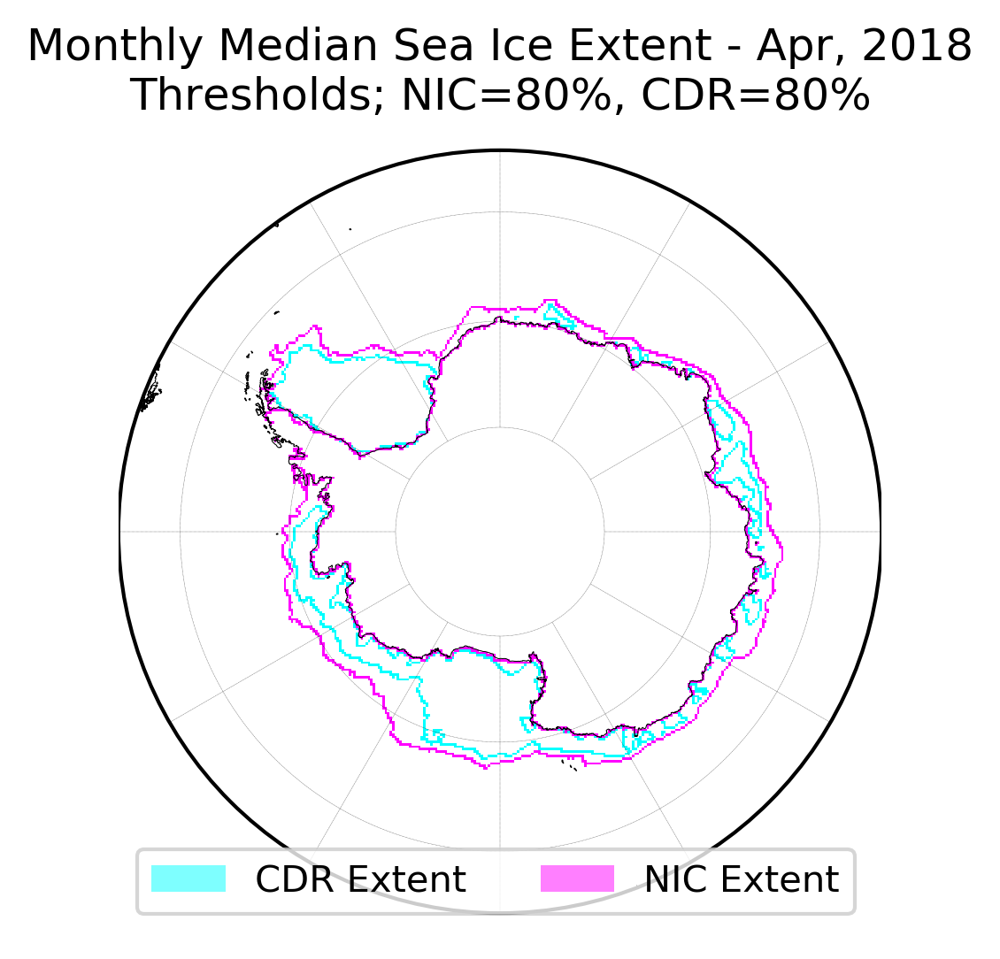

Working on 2018-05-01 00:00:00 to 2018-05-31 00:00:00


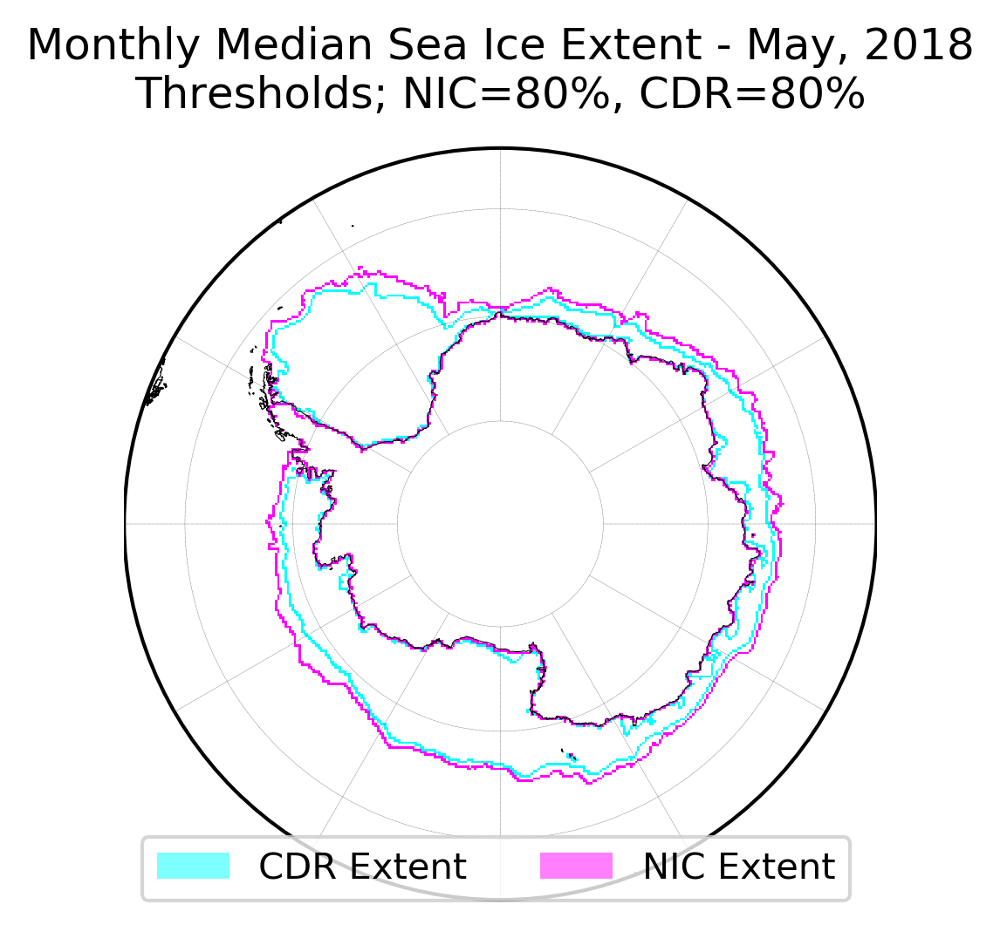

Working on 2018-06-01 00:00:00 to 2018-06-30 00:00:00
Could not run 2018-06-03 00:00:00 because [Errno 2] No such file or directory: 'data\\antarctic\\inputs\\nic\\20180603_south_nic.npy'; continuing


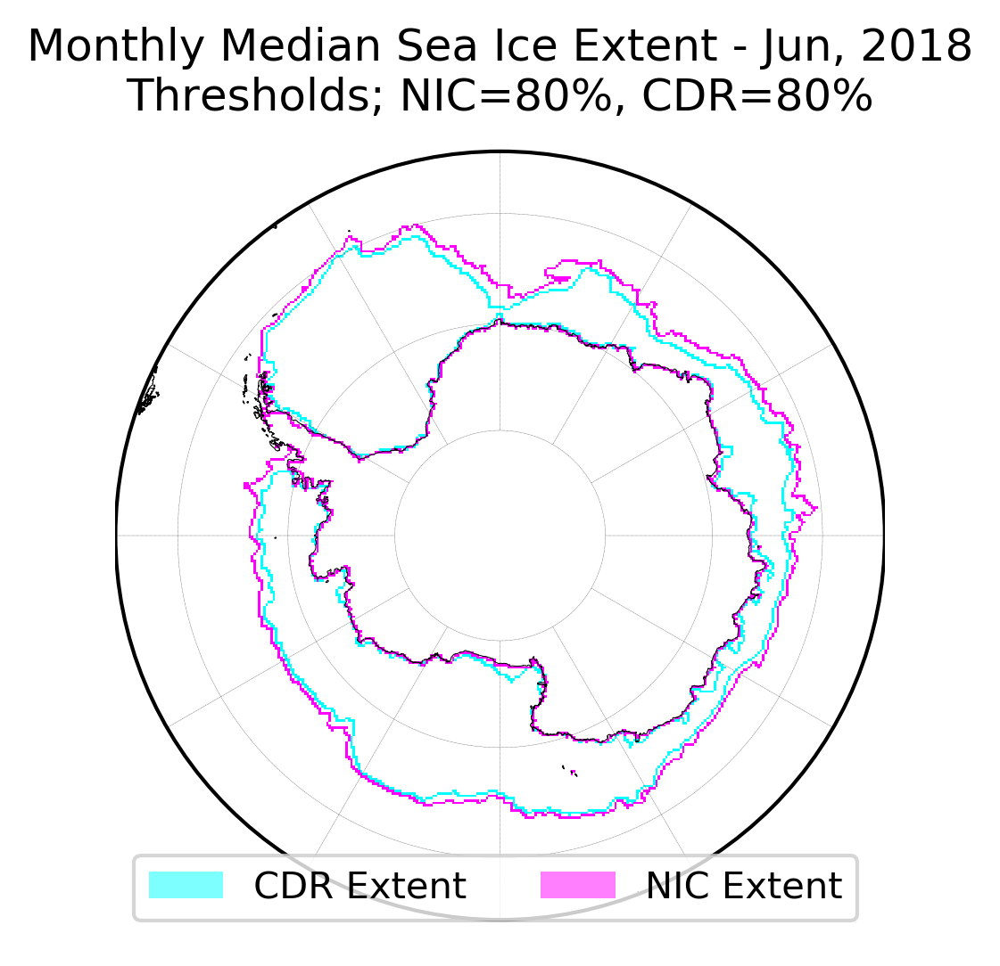

Working on 2018-07-01 00:00:00 to 2018-07-31 00:00:00


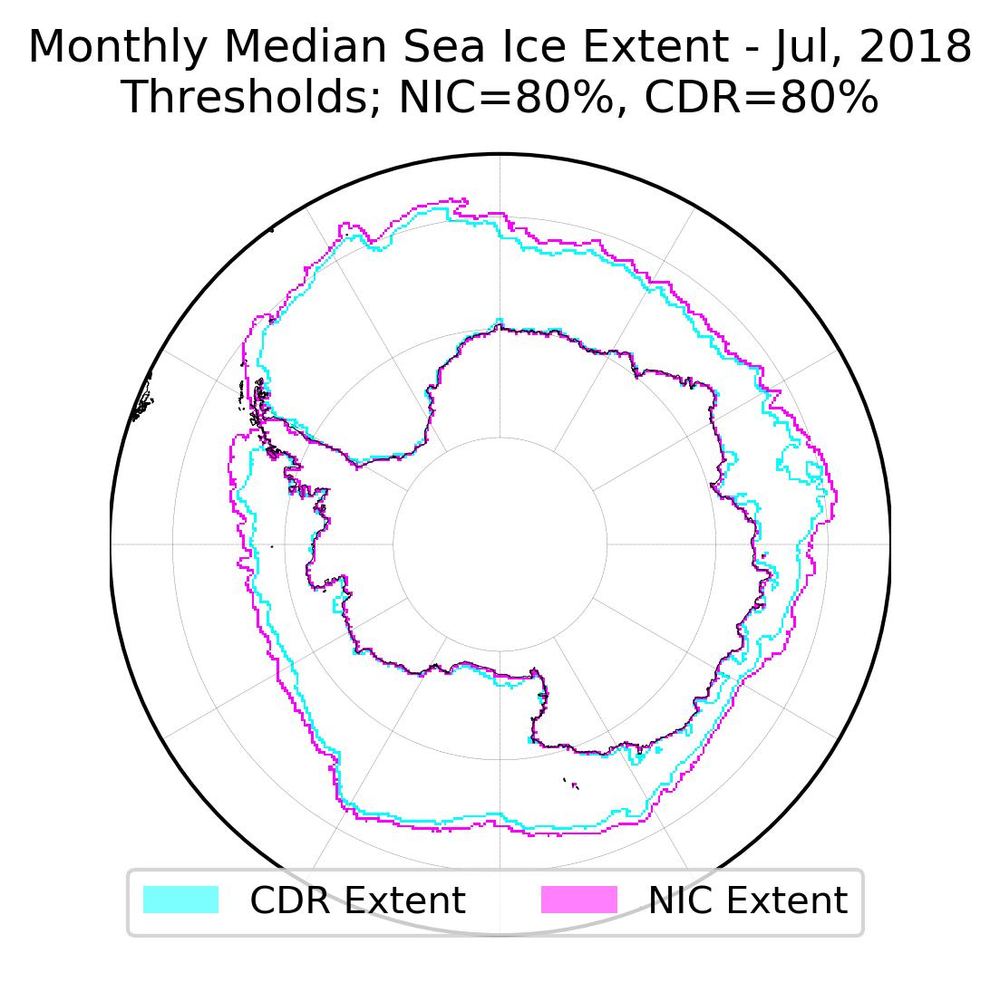

Working on 2018-08-01 00:00:00 to 2018-08-31 00:00:00


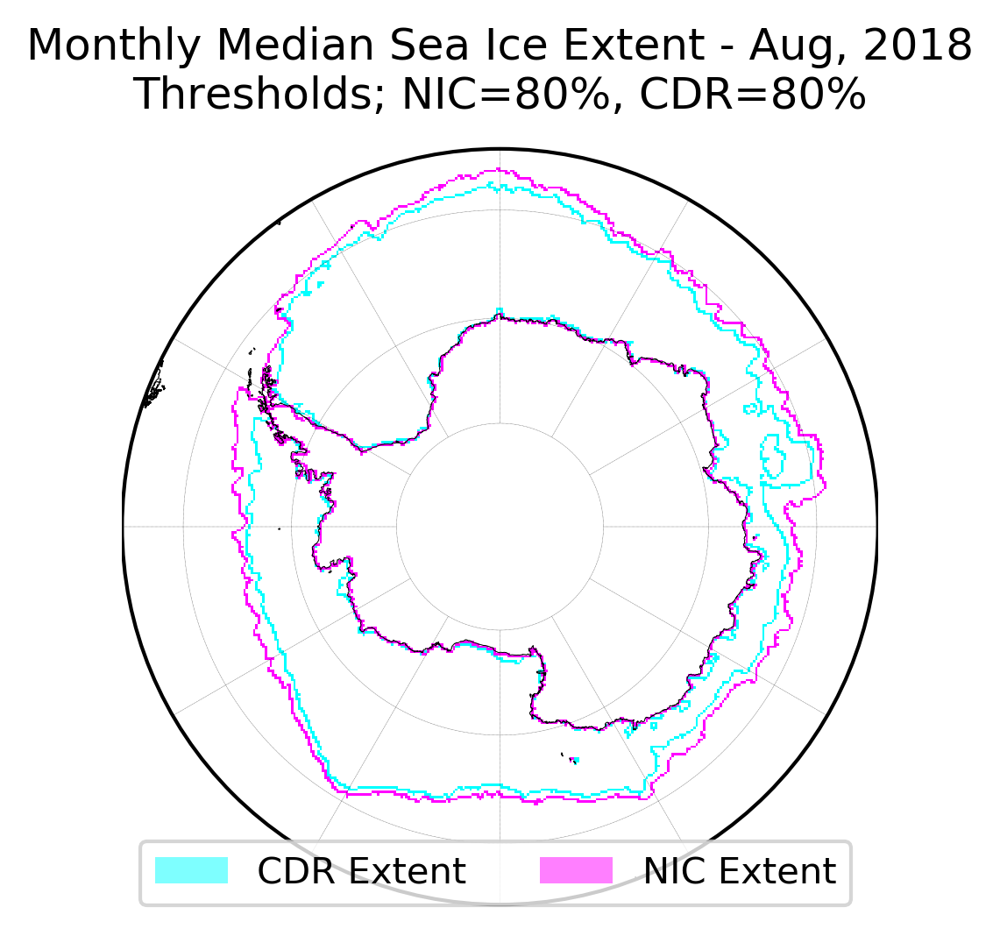

Working on 2018-09-01 00:00:00 to 2018-09-30 00:00:00


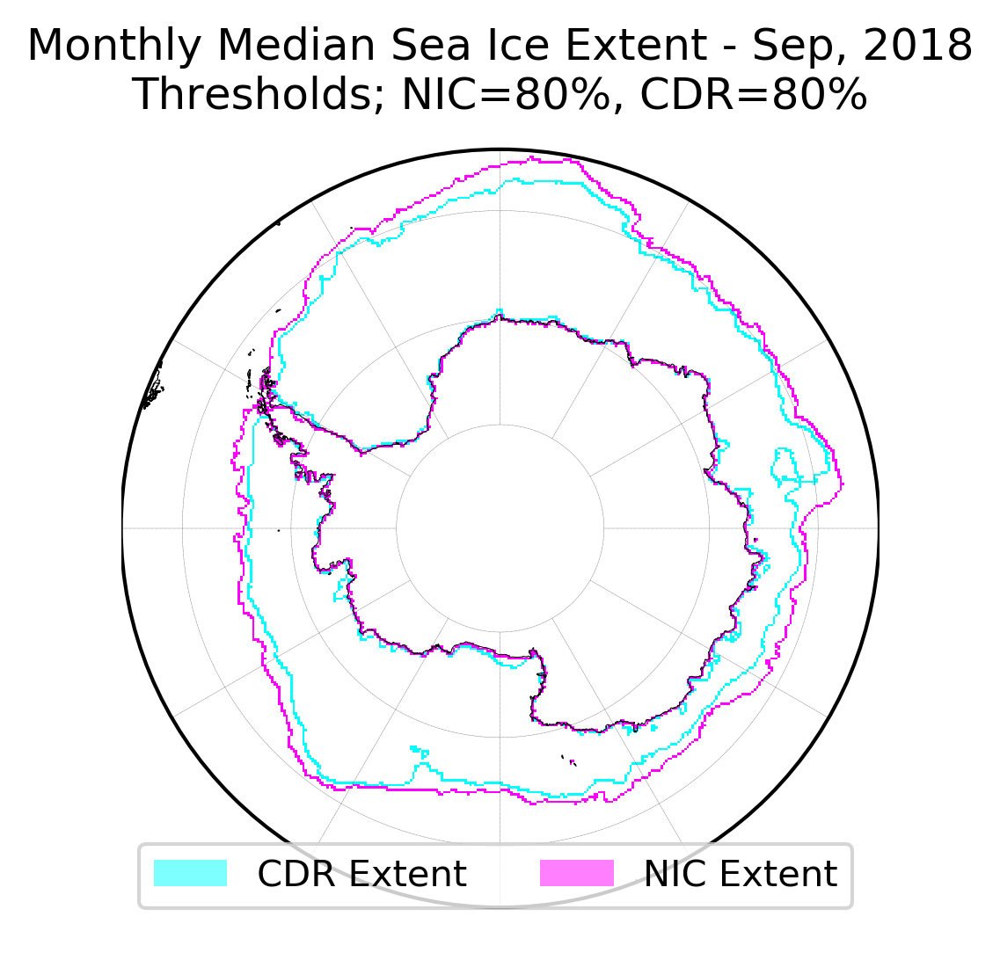

Working on 2018-10-01 00:00:00 to 2018-10-31 00:00:00


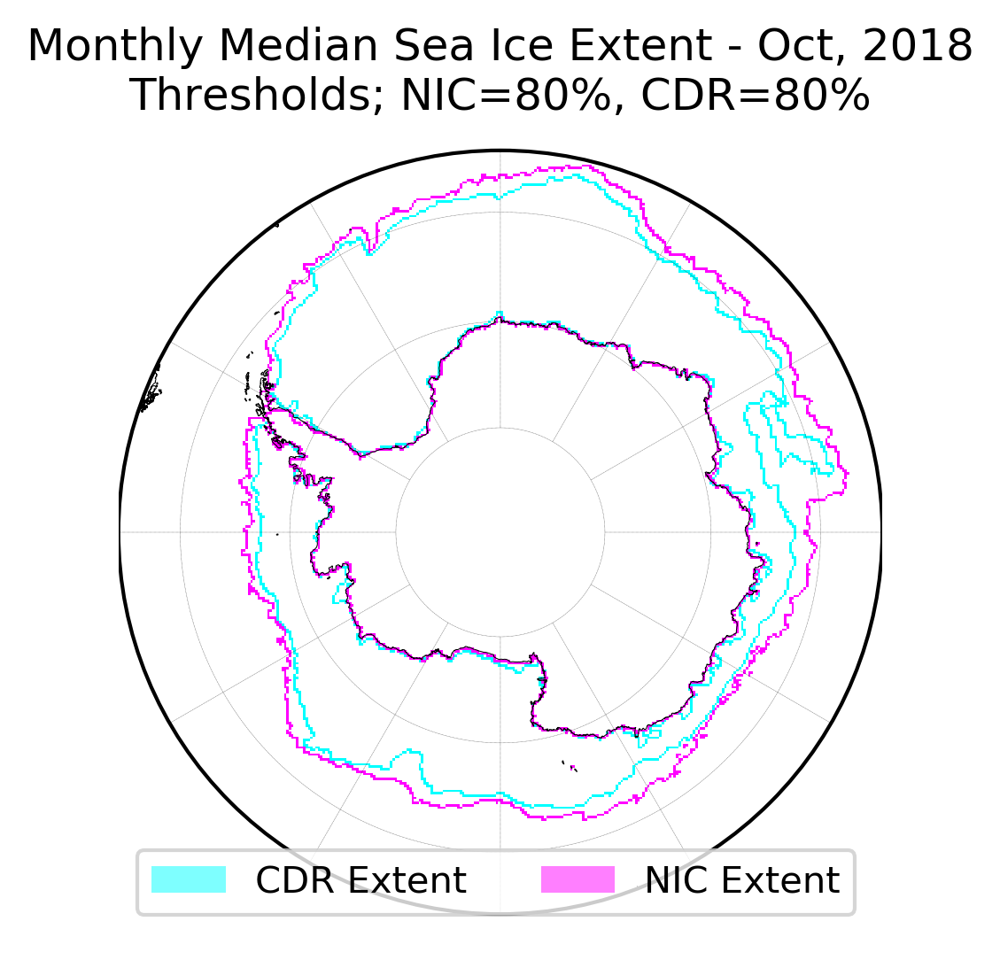

Working on 2018-11-01 00:00:00 to 2018-11-30 00:00:00


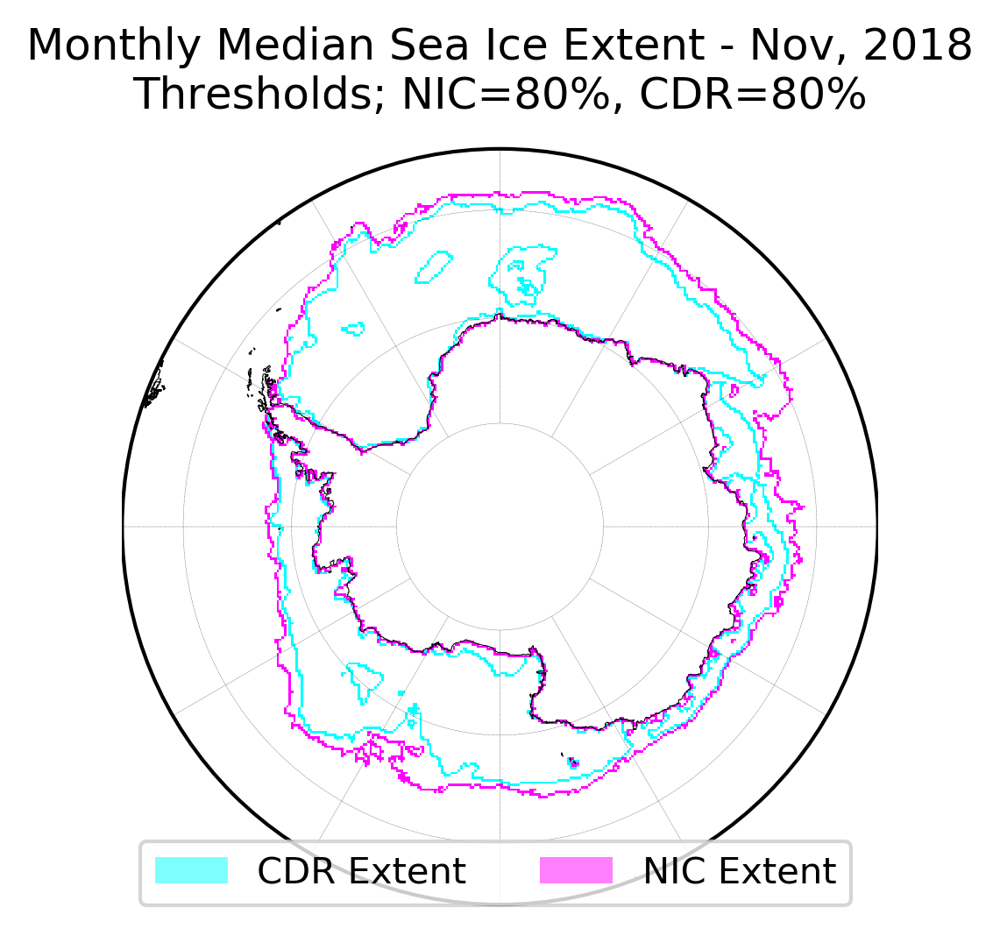

Working on 2018-12-01 00:00:00 to 2018-12-31 00:00:00


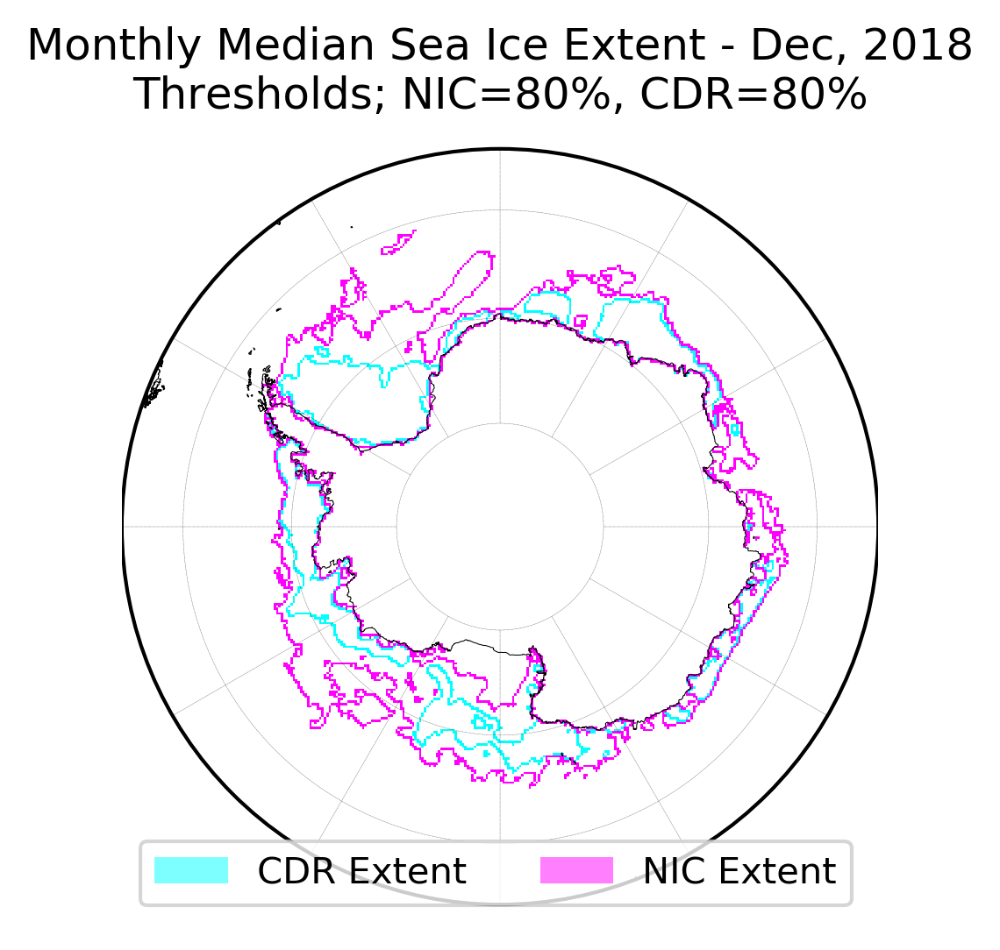

Working on 2019-01-01 00:00:00 to 2019-01-31 00:00:00


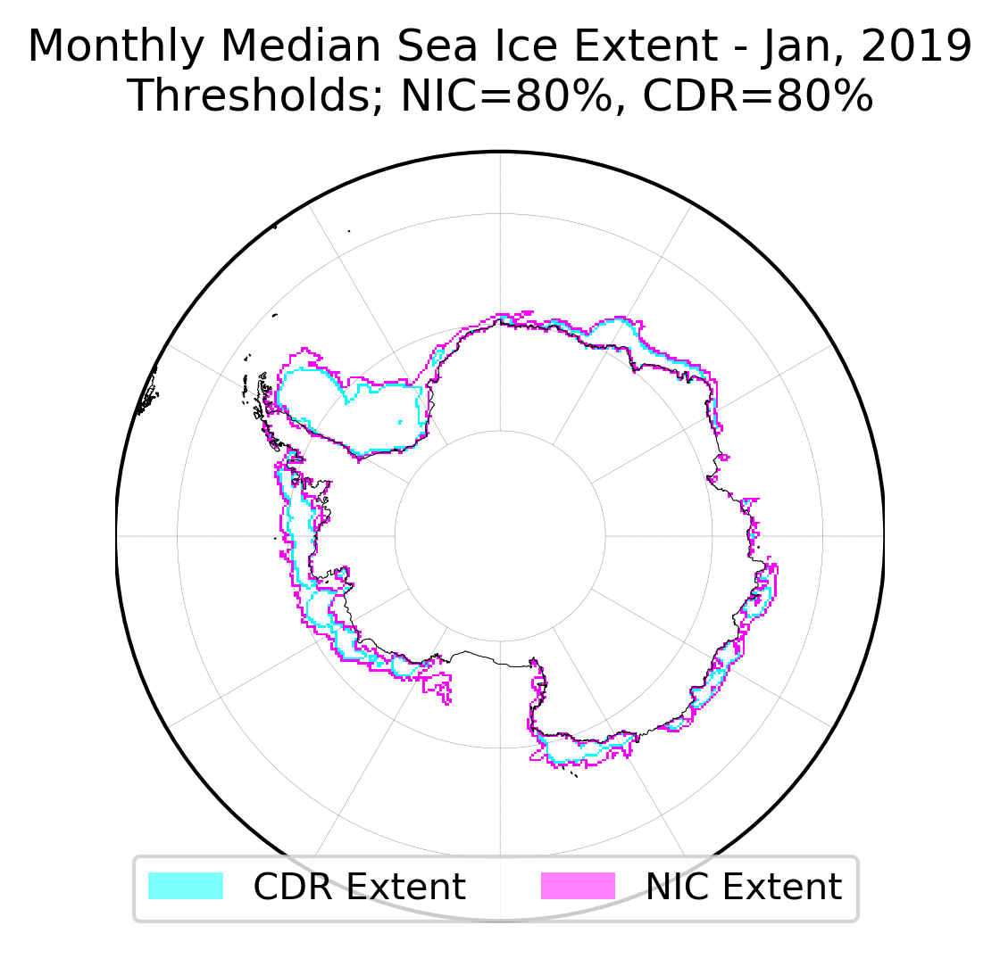

Working on 2019-02-01 00:00:00 to 2019-02-28 00:00:00


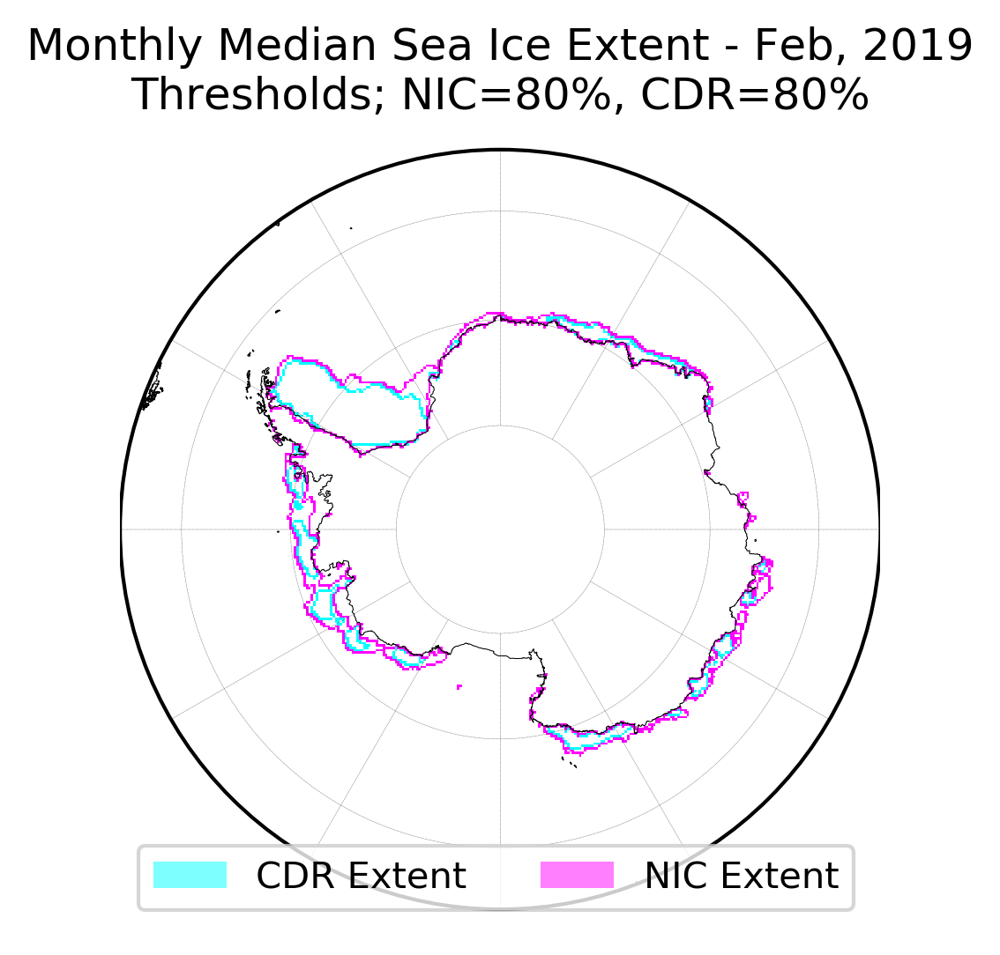

Working on 2019-03-01 00:00:00 to 2019-03-31 00:00:00


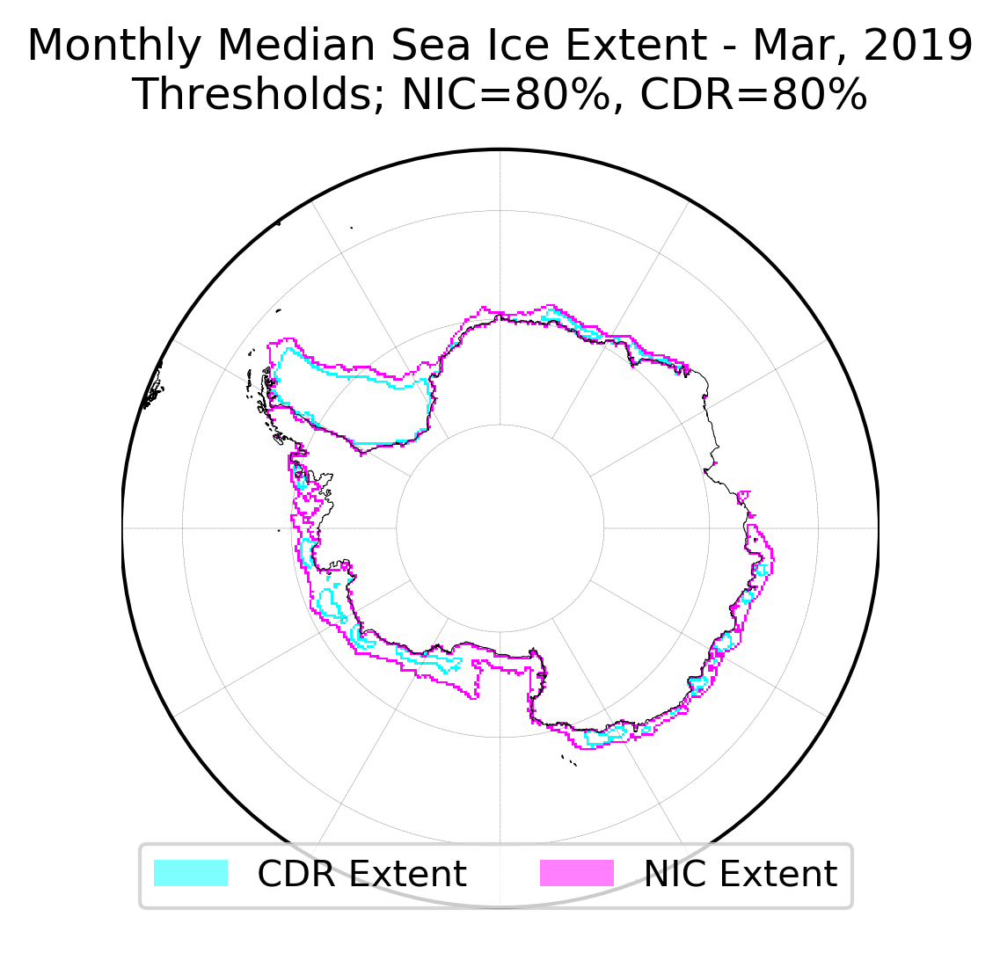

Working on 2019-04-01 00:00:00 to 2019-04-30 00:00:00


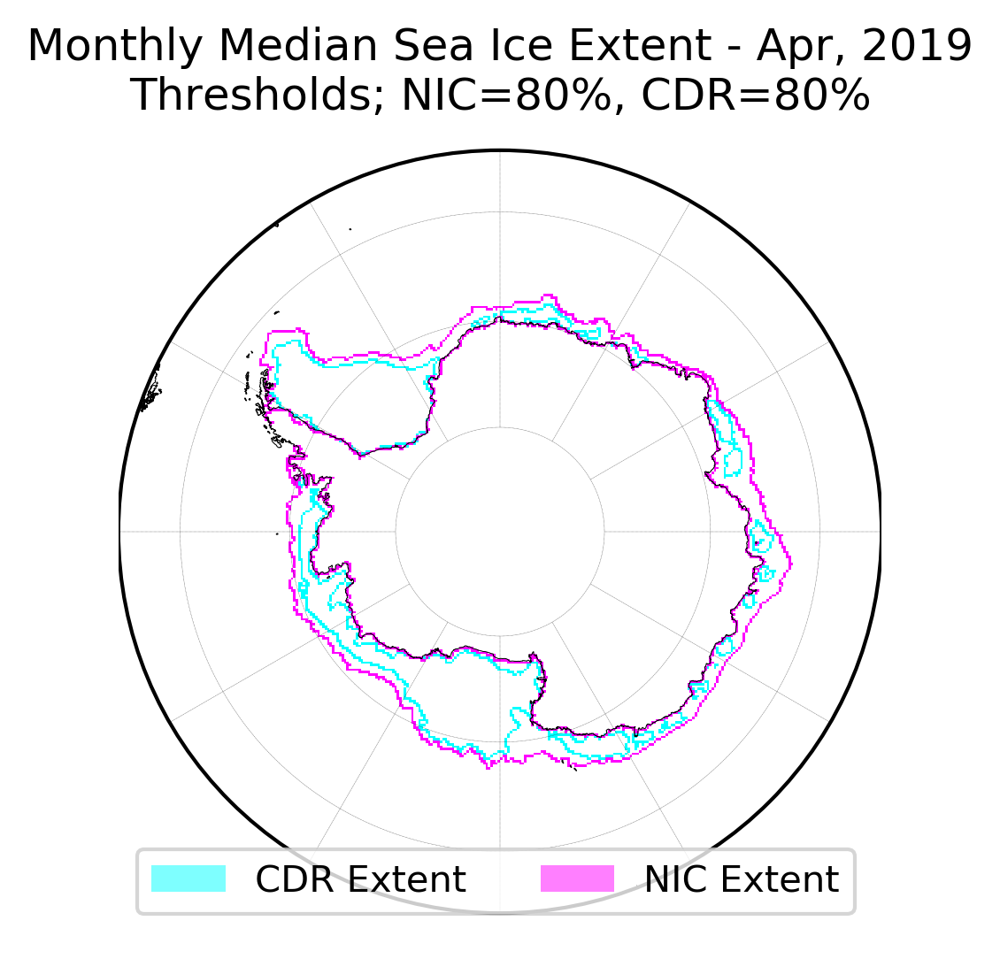

Working on 2019-05-01 00:00:00 to 2019-05-31 00:00:00


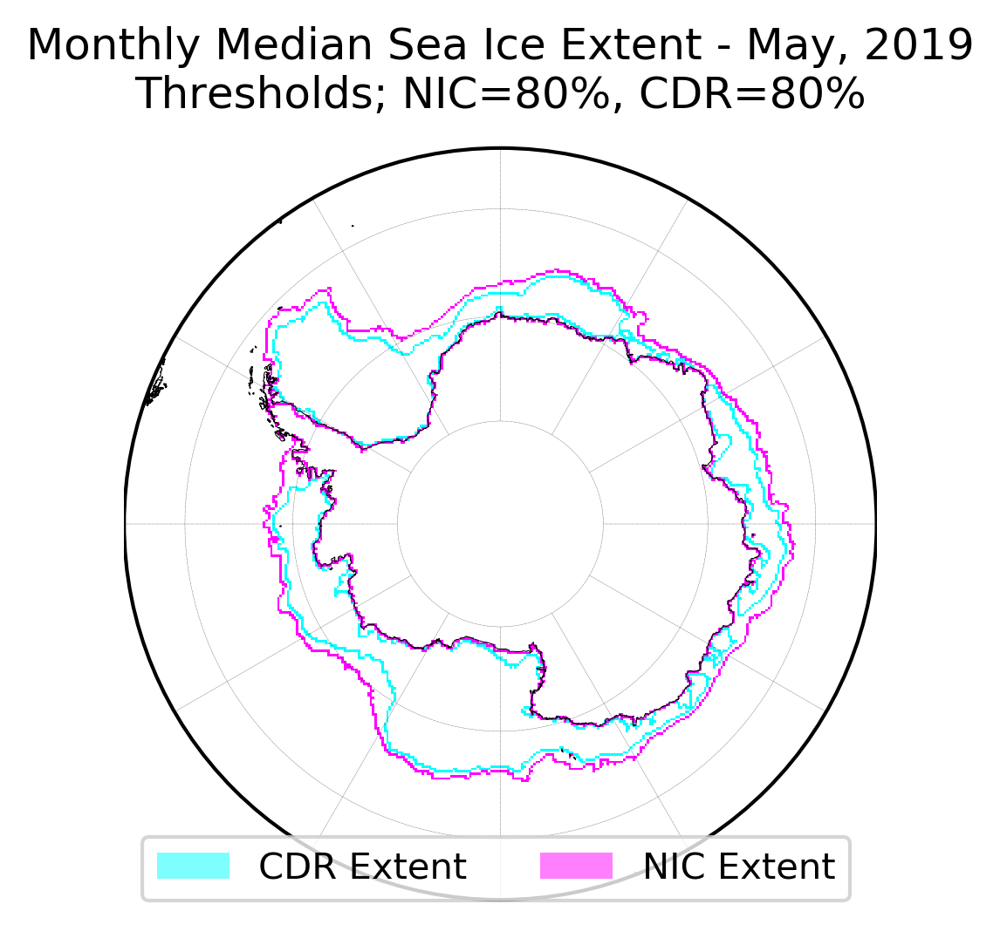

Working on 2019-06-01 00:00:00 to 2019-06-30 00:00:00


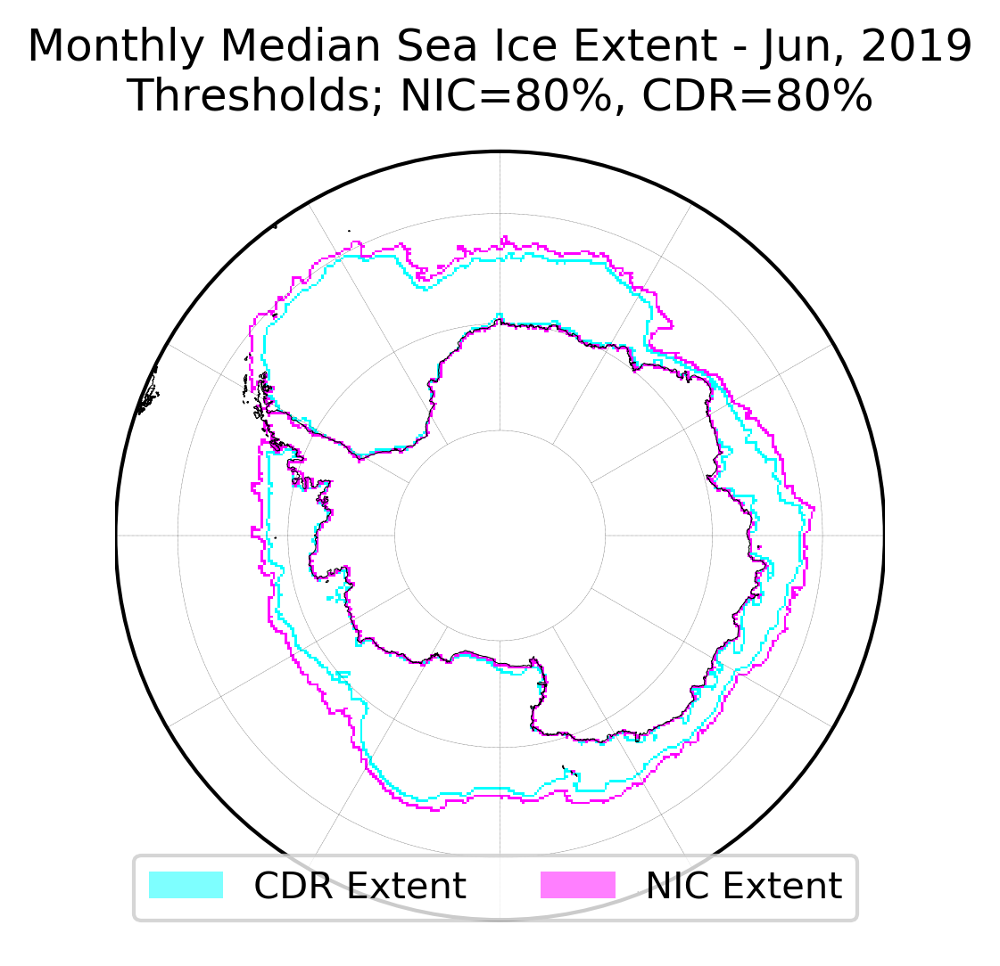

Working on 2019-07-01 00:00:00 to 2019-07-31 00:00:00


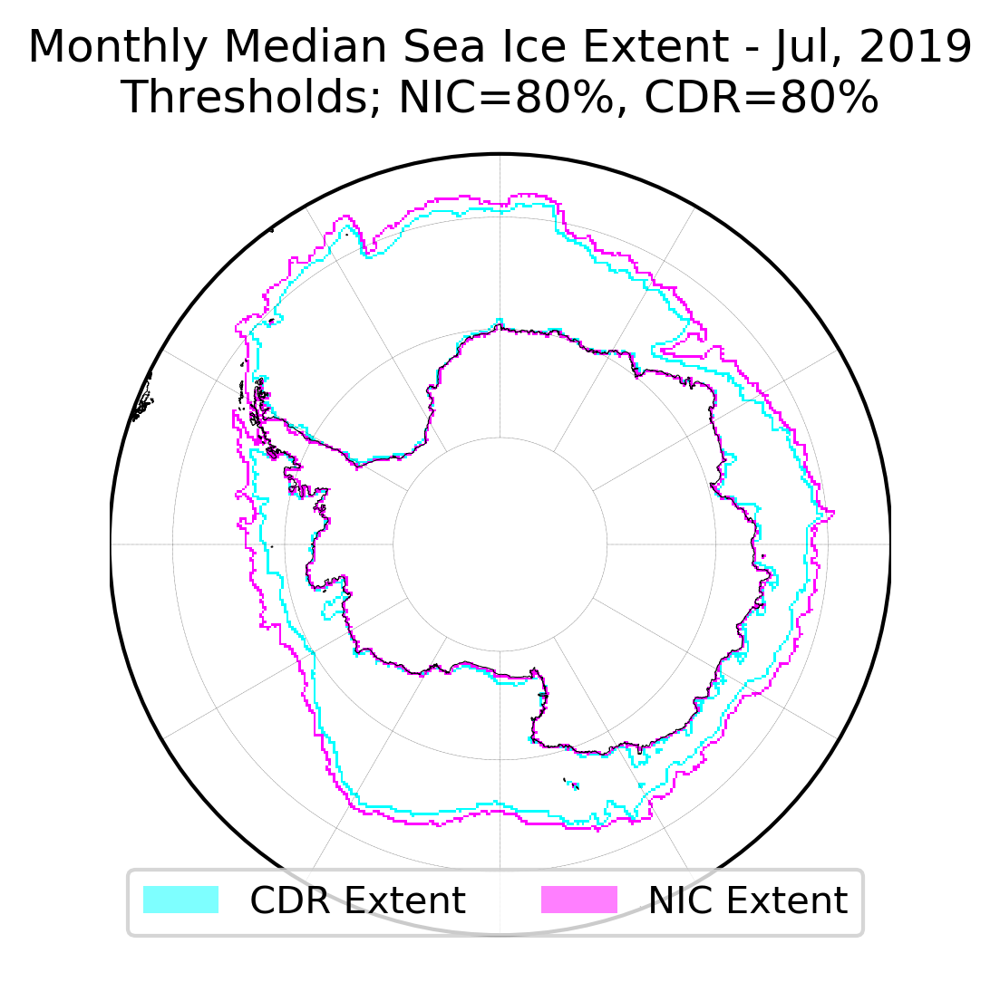

Working on 2019-08-01 00:00:00 to 2019-08-31 00:00:00


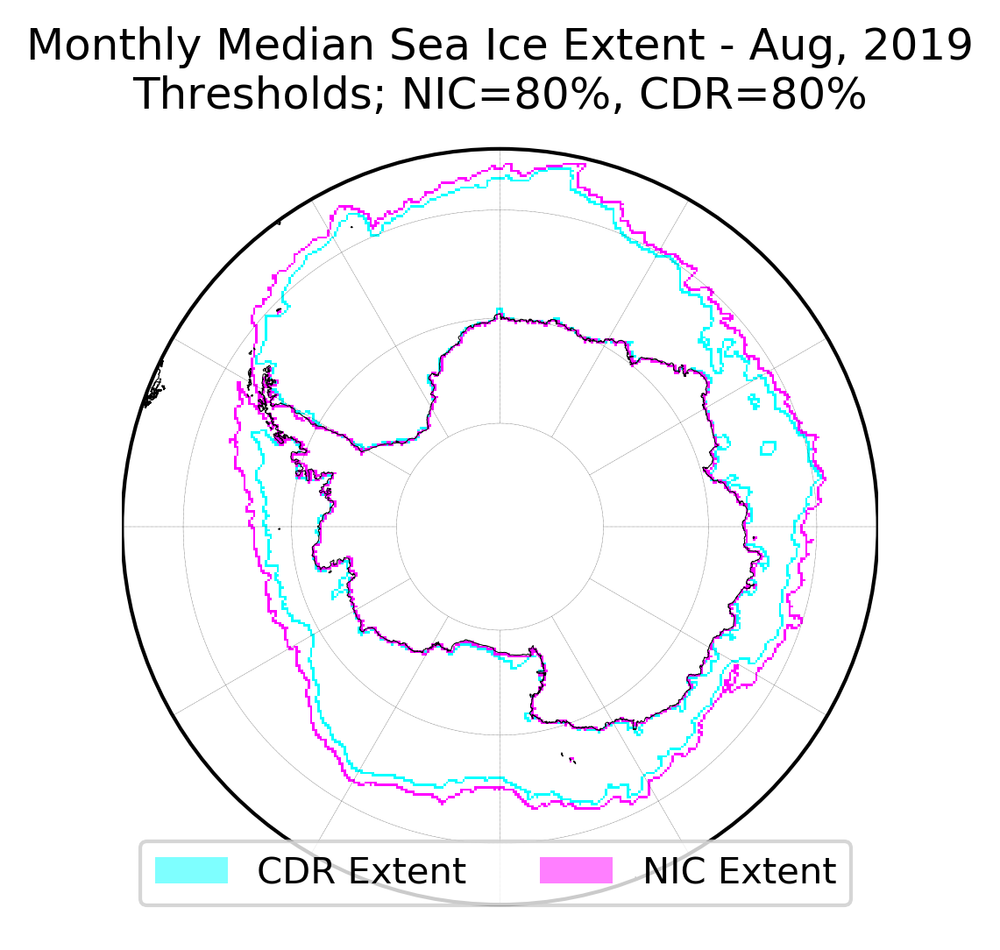

Working on 2019-09-01 00:00:00 to 2019-09-30 00:00:00


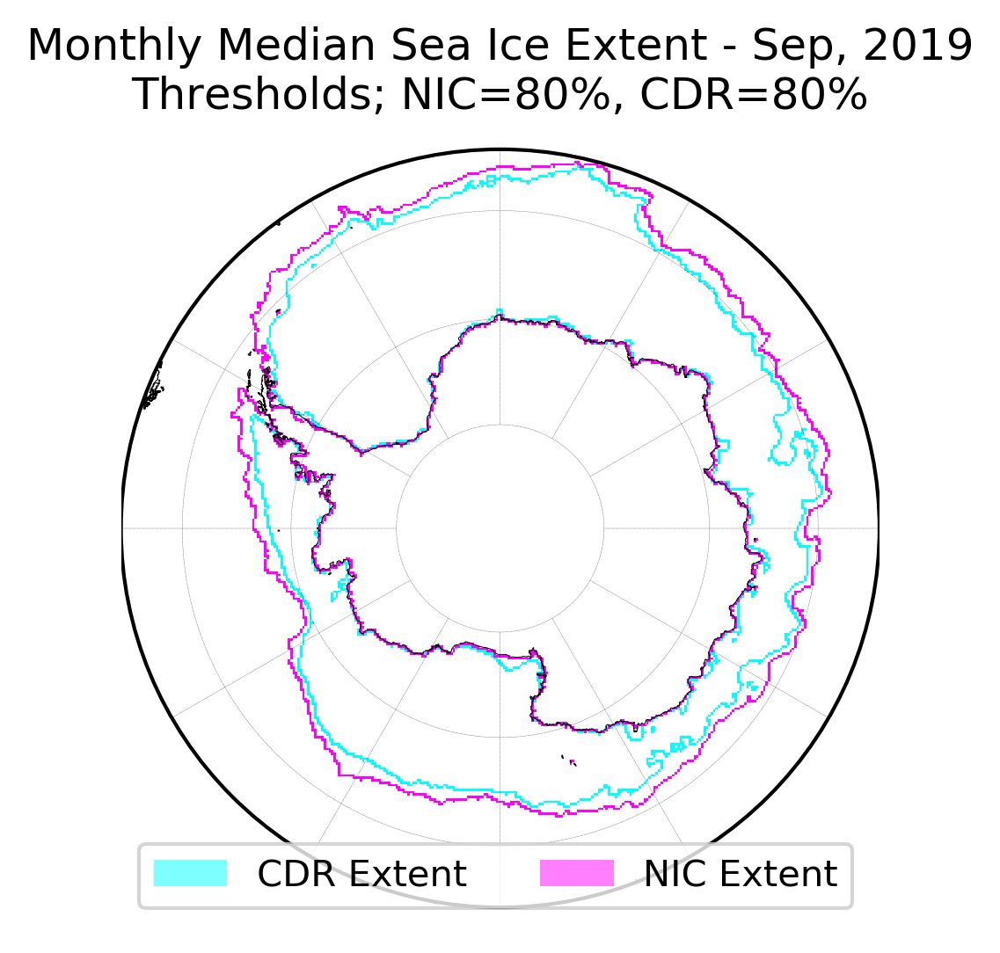

Working on 2019-10-01 00:00:00 to 2019-10-31 00:00:00


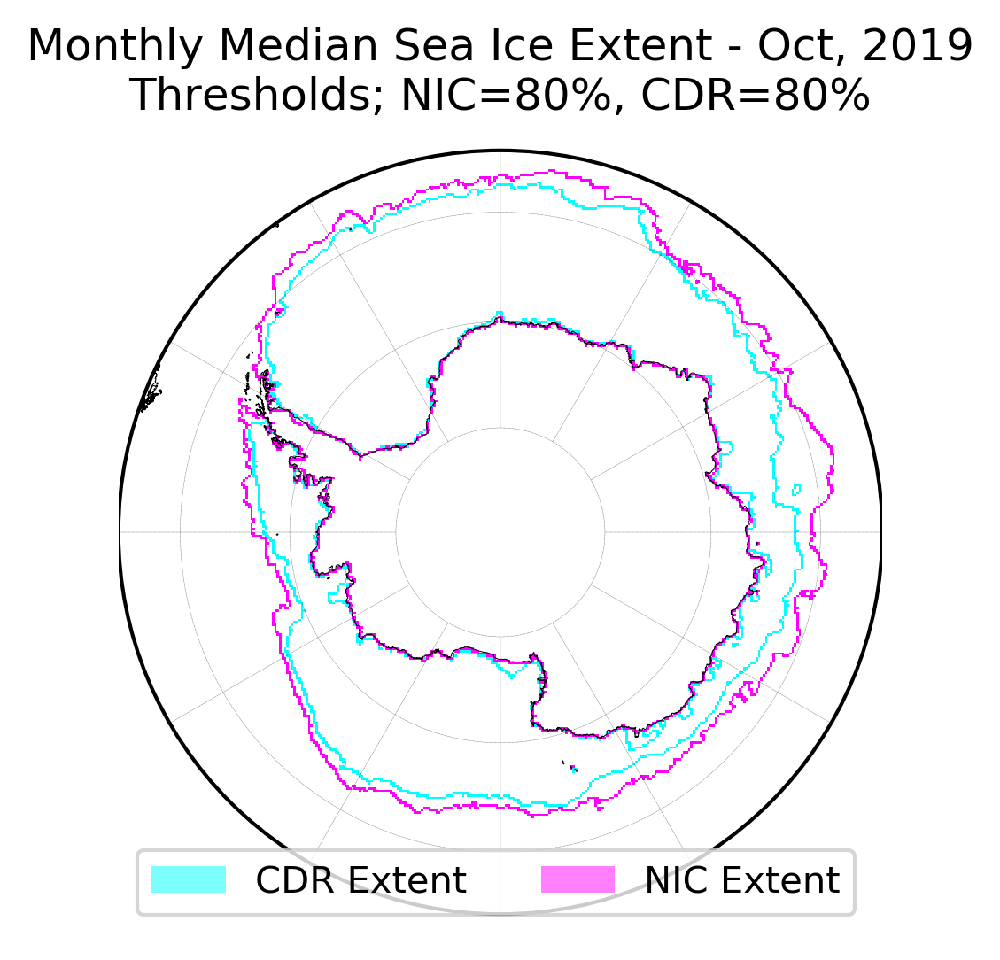

Working on 2019-11-01 00:00:00 to 2019-11-30 00:00:00


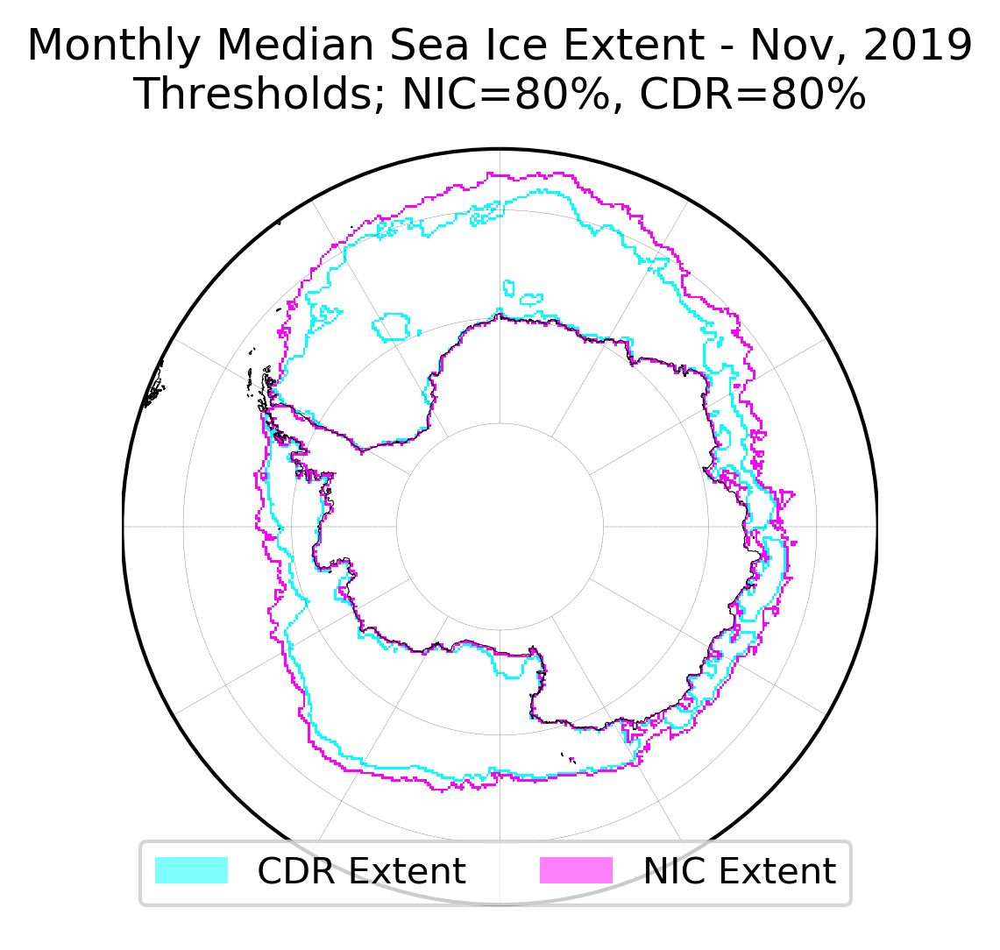

Working on 2019-12-01 00:00:00 to 2019-12-31 00:00:00


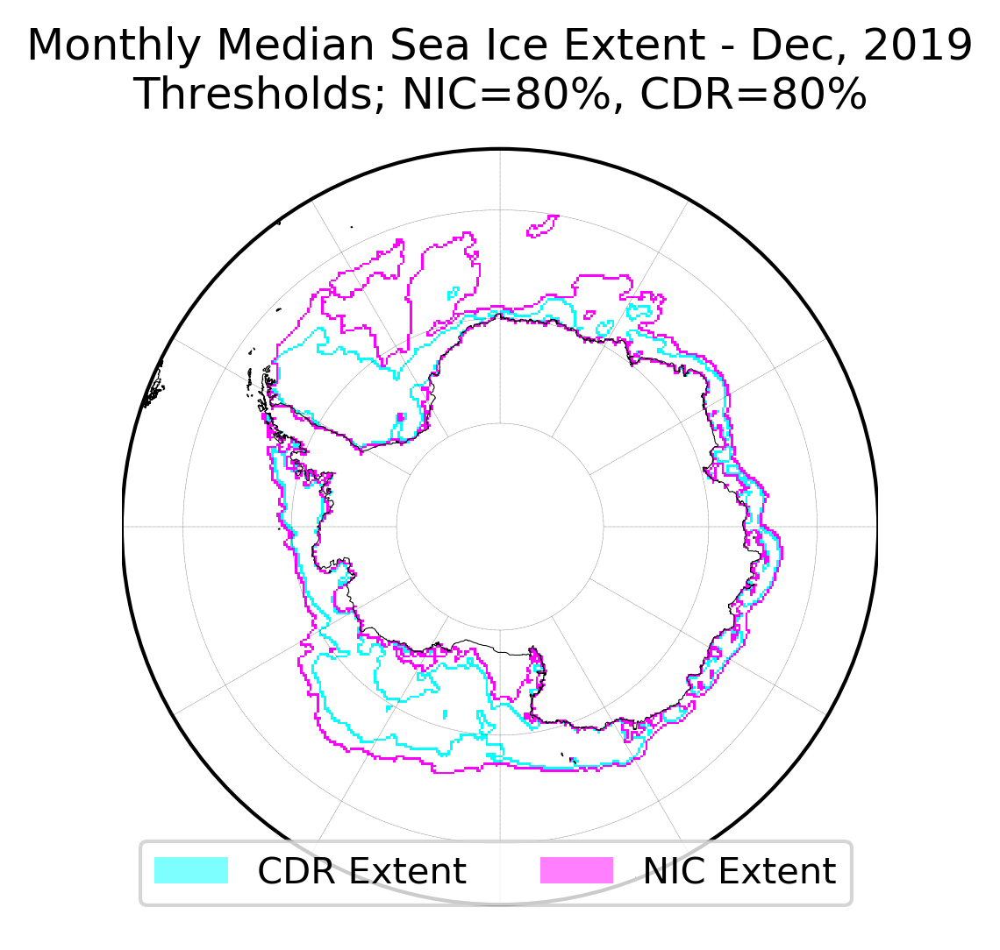

Working on 2020-01-01 00:00:00 to 2020-01-31 00:00:00


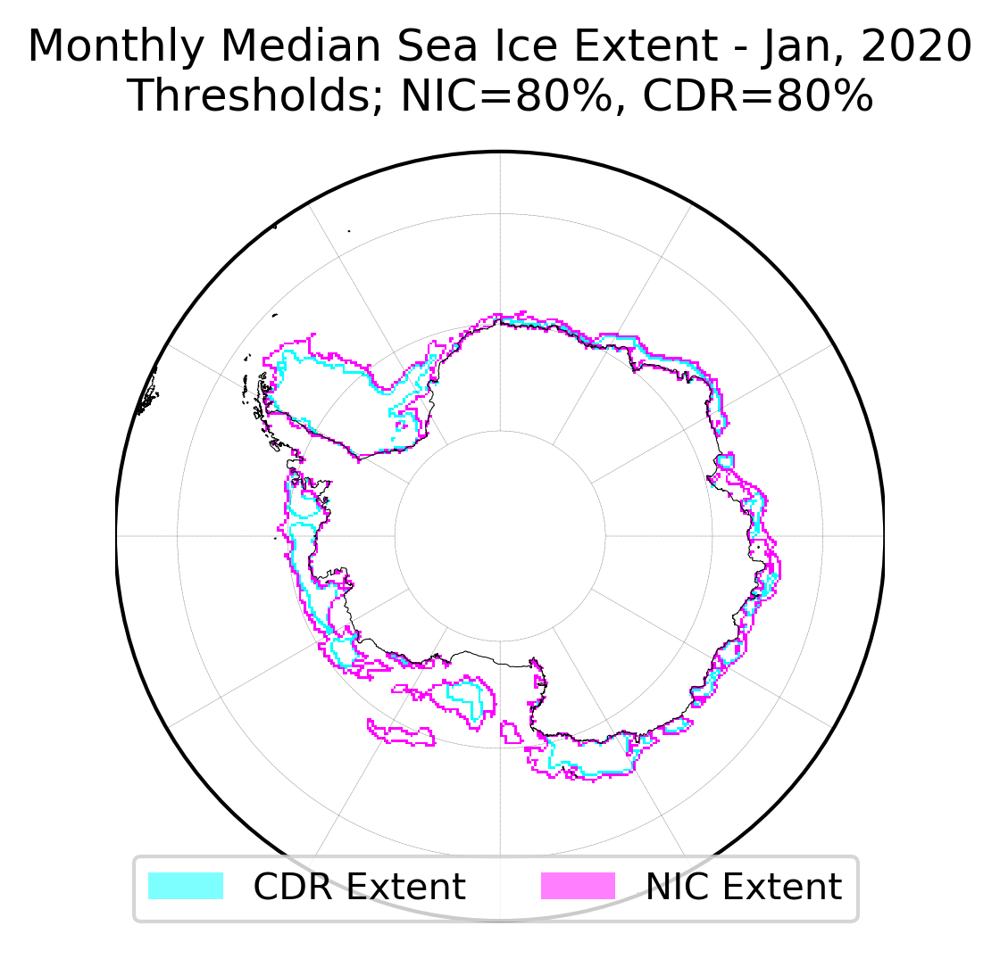

Working on 2020-02-01 00:00:00 to 2020-02-29 00:00:00


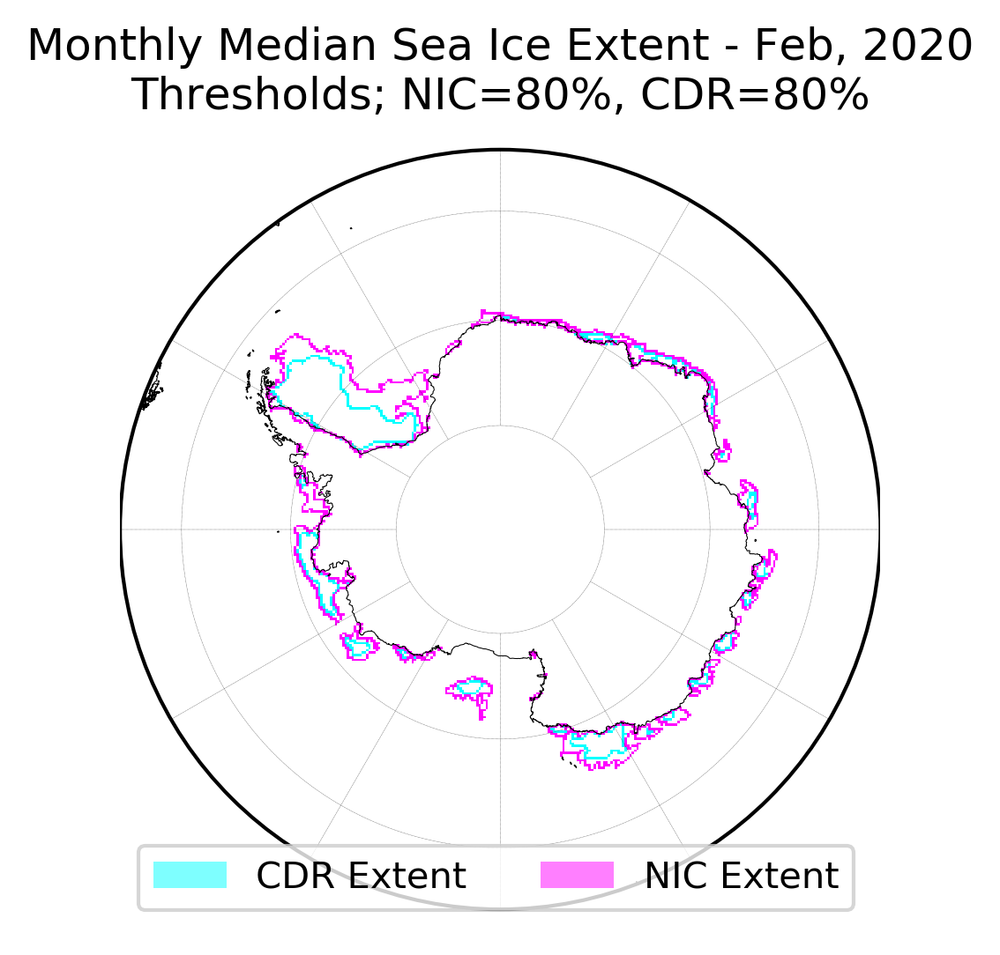

Working on 2020-03-01 00:00:00 to 2020-03-31 00:00:00


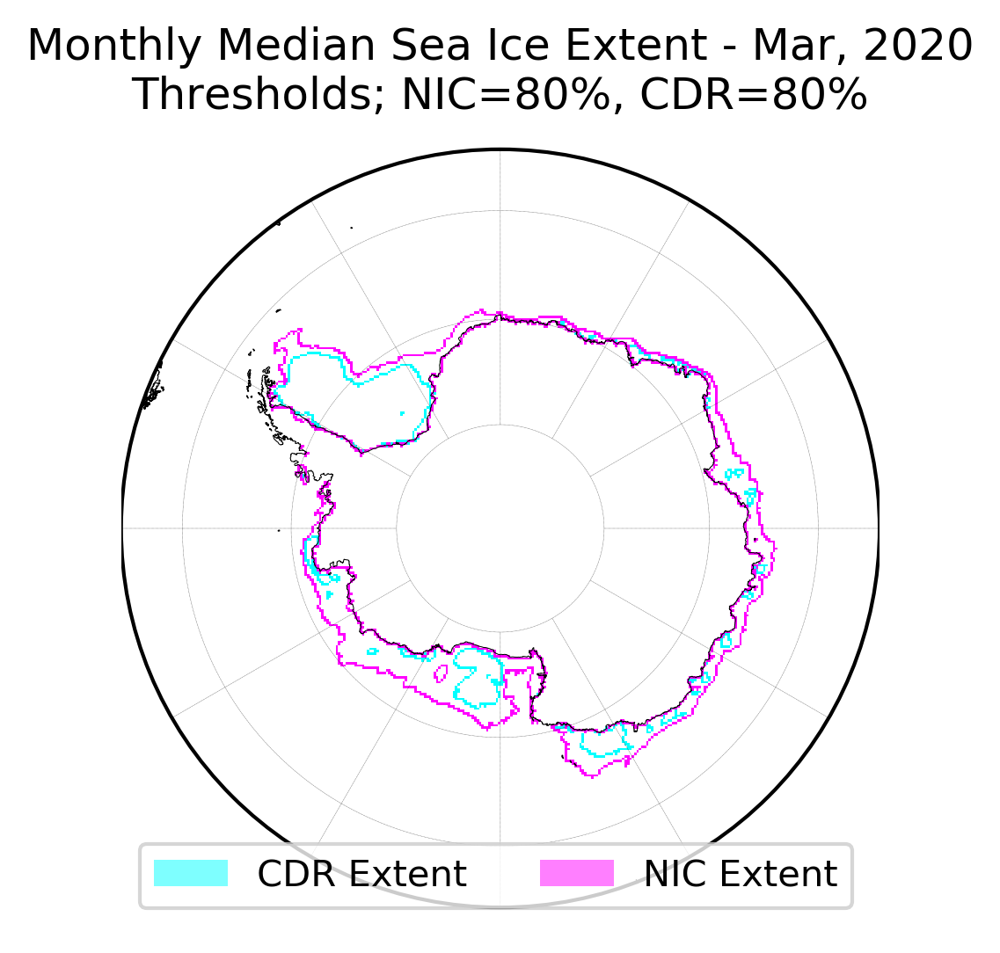

Working on 2020-04-01 00:00:00 to 2020-04-30 00:00:00
Could not run 2020-04-27 00:00:00 because [Errno 2] No such file or directory: 'data\\antarctic\\inputs\\nic\\20200427_south_nic.npy'; continuing


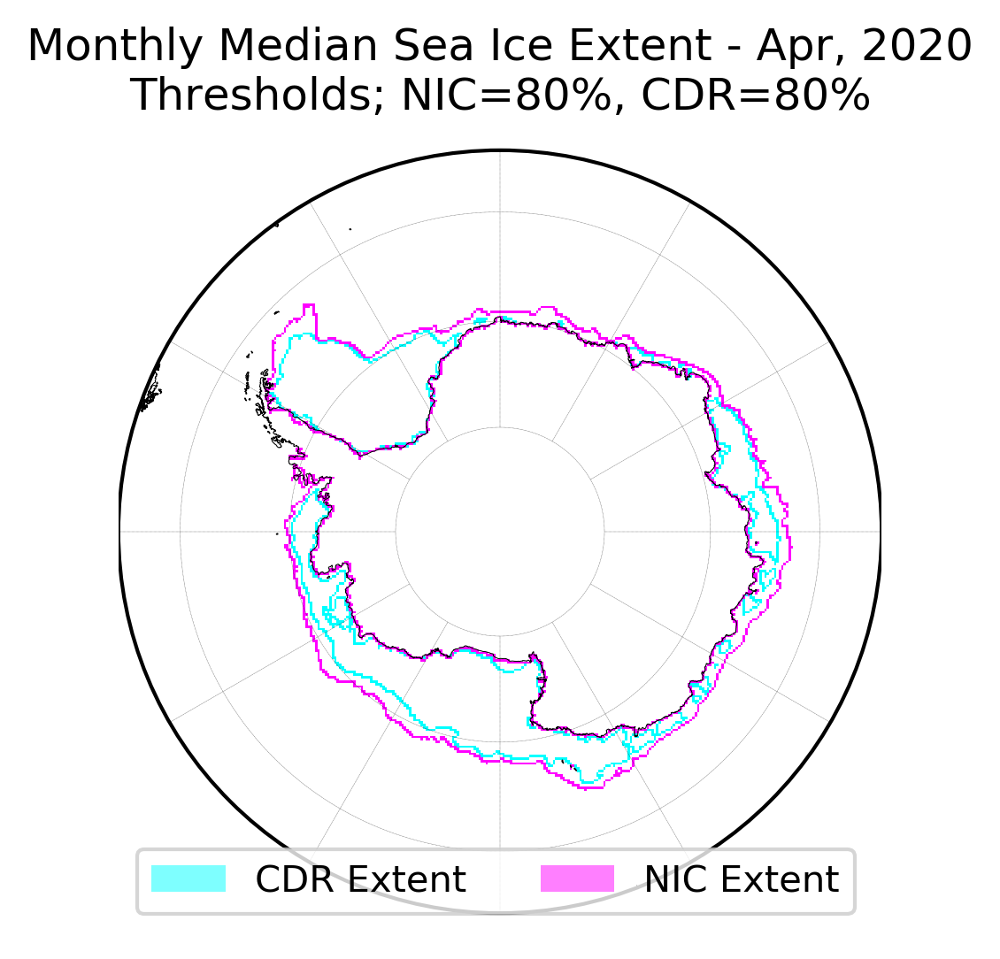

Working on 2020-05-01 00:00:00 to 2020-05-31 00:00:00
Could not run 2020-05-04 00:00:00 because [Errno 2] No such file or directory: 'data\\antarctic\\inputs\\nic\\20200504_south_nic.npy'; continuing


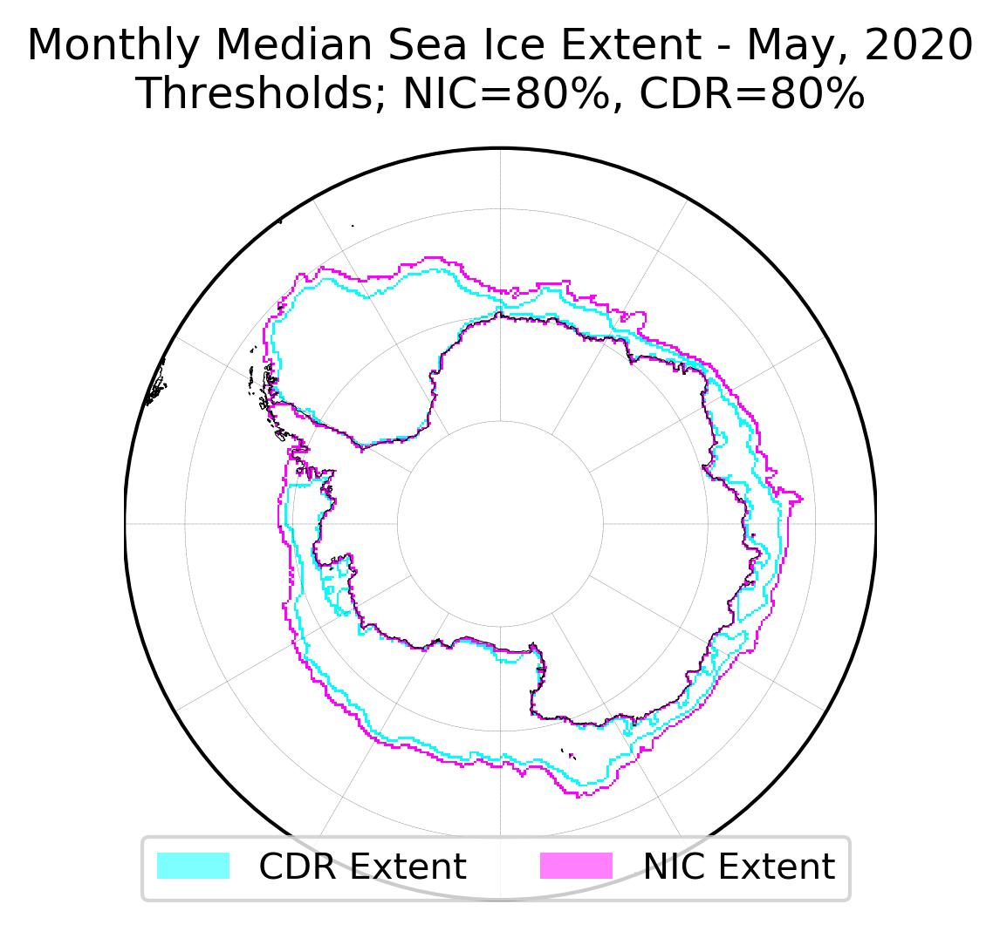

Working on 2020-06-01 00:00:00 to 2020-06-30 00:00:00
Could not run 2020-06-26 00:00:00 because [Errno 2] No such file or directory: 'data\\antarctic\\inputs\\cdr\\20200626_south_cdr.npy'; continuing
Could not run 2020-06-27 00:00:00 because [Errno 2] No such file or directory: 'data\\antarctic\\inputs\\cdr\\20200627_south_cdr.npy'; continuing
Could not run 2020-06-28 00:00:00 because [Errno 2] No such file or directory: 'data\\antarctic\\inputs\\cdr\\20200628_south_cdr.npy'; continuing
Could not run 2020-06-29 00:00:00 because [Errno 2] No such file or directory: 'data\\antarctic\\inputs\\cdr\\20200629_south_cdr.npy'; continuing
Could not run 2020-06-30 00:00:00 because [Errno 2] No such file or directory: 'data\\antarctic\\inputs\\cdr\\20200630_south_cdr.npy'; continuing
Could not run 2020-06-27 00:00:00 because [Errno 2] No such file or directory: 'data\\antarctic\\inputs\\nic\\20200627_south_nic.npy'; continuing
Could not run 2020-06-28 00:00:00 because [Errno 2] No such file or di

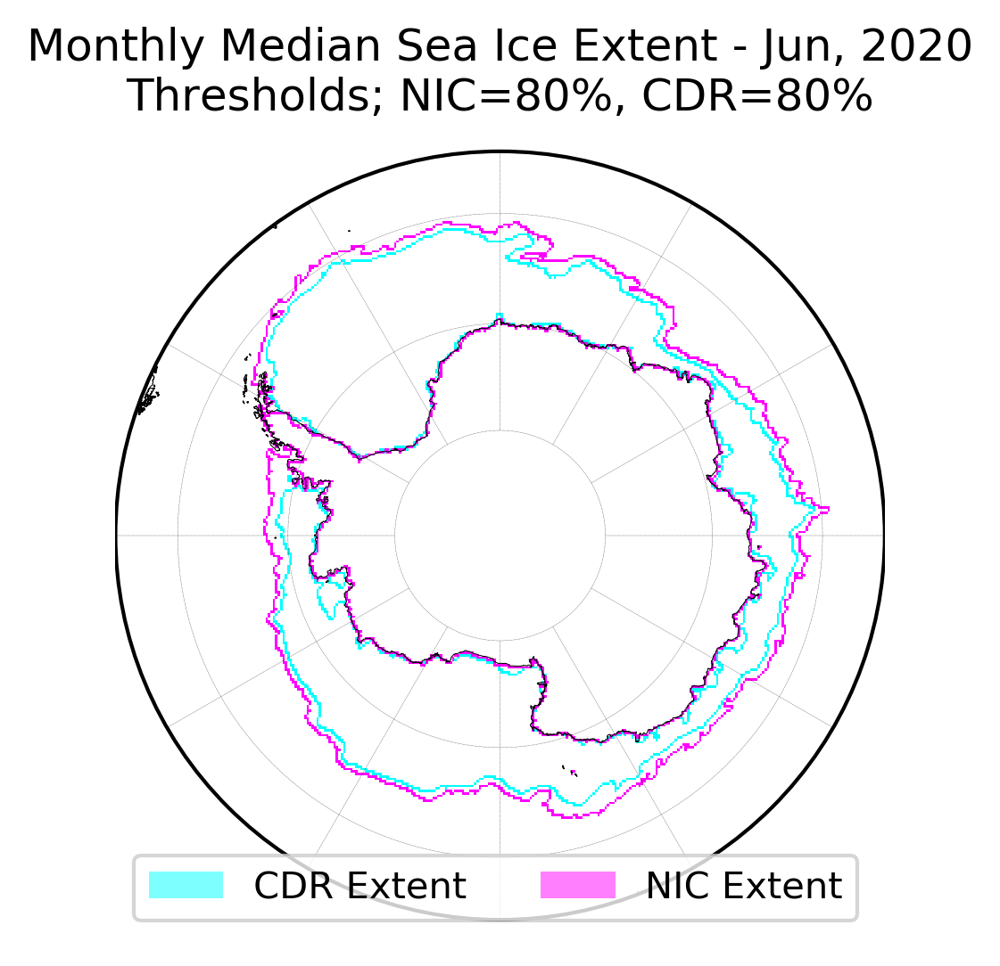

In [6]:
nic_thresh = .8
cdr_thresh = .8

freq = 'MS'
last_day_of_month_offset = pd.offsets.MonthEnd(1)

start_rounded_up = short_term_comparison_start + last_day_of_month_offset
end_rounded_down = end.replace(day=1)

for median_start_date in pd.date_range(start=start_rounded_up, end=end_rounded_down, freq=freq):    
    median_end_date = median_start_date + last_day_of_month_offset
    
    print(f"Working on {median_start_date} to {median_end_date}")
    
    cdr_median_threshold_grid = median_cdr(cdr_thresh, median_start_date, median_end_date, cdr_input_folder, hemi)
    nic_median_threshold_grid = median_nic(nic_thresh, median_start_date, median_end_date, nic_input_folder, hemi)
    
    # Let's only set the pixels on the boundary to True
    cdr_diff_arr = np.diff(cdr_median_threshold_grid, axis=0, prepend=False) | np.diff(cdr_median_threshold_grid, axis=1, prepend=False)
    nic_diff_arr = np.diff(nic_median_threshold_grid, axis=0, prepend=False) | np.diff(nic_median_threshold_grid, axis=1, prepend=False)
    
    output_name = os.path.join("data", 
                               folder_name,
                               "output", 
                               f"{freq}_median",
                               f"{cdr_thresh}_{nic_thresh}_for_{median_start_date:%Y%m%d}_to_{median_end_date:%Y%m%d}.png")
    
    create_basemap_plot(f'Monthly Median Sea Ice Extent - {median_start_date:%b, %Y}\n' \
                        f'Thresholds; NIC={int(100*nic_thresh)}%, CDR={int(100*cdr_thresh)}%',
                        lats, 
                        lons, 
                        meta,
                        [{'grid': cdr_diff_arr, 'color': 'cyan', 'legend_label': 'CDR Extent'}, 
                         {'grid': nic_diff_arr, 'color': 'magenta', 'legend_label': 'NIC Extent'}], 
                        show=True,
                        legend=True,
                        save=output_name)

This will likely be the longest-running cell of the notebook - it creates a dataframe that stores total area within 80%.

Now, let's take a closer look at the actual ice areas within the outer and inner marginal ice zone boundaries for the two products.  The plot below shows the MIZ area over the last several years for both the CDR product and the NIC product.  Note you can see the outer and inner edge variation is present spatially (eg we can see a more jagged edge in the diagram above) as well as temporally (eg we see a jagged line in the magenta time series but a smoother line in the cyan time series below).

The plot below also shows the seasonal relationship between these two products - the difference betwen the two areas is greatest when ice is melting.  Additionally, the right axis represents the total area of the marginal ice zone.  It's interesting to note that, while the CDR product generally represents the marginal ice zone as further receeded towards the south, the total size of the marginal ice zone is typically larger than that of the NIC product.

In [7]:
outer_nic_thresh = .1
inner_nic_thresh = .8

# Right now, we're interested in comparing the sea ice concentration values of 80% for both NIC data and CDR data
# But we'll set this up to calculate the areas at different thresholds other than 80% - we'll look at this later
outer_cdr_thresh = .1
inner_cdr_thresh_lower = .1
inner_cdr_thresh_upper = 1.0
interval = .05

threshold_range = np.arange(inner_cdr_thresh_lower, inner_cdr_thresh_upper, interval)

df = pd.DataFrame()
df.set_index(pd.DatetimeIndex([]))

for day_analyzed in pd.date_range(start=start, end=end):
    try:
        cdr_grid = get_cdr(day_analyzed, cdr_input_folder, hemi)
        nic_grid = get_nic(day_analyzed, nic_input_folder, hemi)
        
        # We only need the outer extent for the largest contour
        cdr_area, nic_area = calculate_ice_area(cdr_grid, 
                                                nic_grid, 
                                                outer_nic_thresh, 
                                                1, 
                                                outer_cdr_thresh, 
                                                1, 
                                                verbose=verbose)
        df.at[day_analyzed, 'NIC outer extent'] = nic_area
        df.at[day_analyzed, 'CDR outer extent'] = cdr_area
        
        for thresh in threshold_range:
            cdr_area, nic_area = calculate_ice_area(cdr_grid, 
                                                    nic_grid, 
                                                    inner_nic_thresh, 
                                                    1, 
                                                    thresh, 
                                                    1, 
                                                    verbose=verbose)
            df.at[day_analyzed, f'NIC inner extent {thresh:.2f}'] = nic_area
            df.at[day_analyzed, f'CDR inner extent {thresh:.2f}'] = cdr_area

    except Exception as e:
        if verbose:
            print(f"Couldn't run {day_analyzed}; {e}")

In [8]:
# Since we're running the below analysis on the recent data, let's subset it out now
recent_df = df.loc[df.index > short_term_comparison_start]

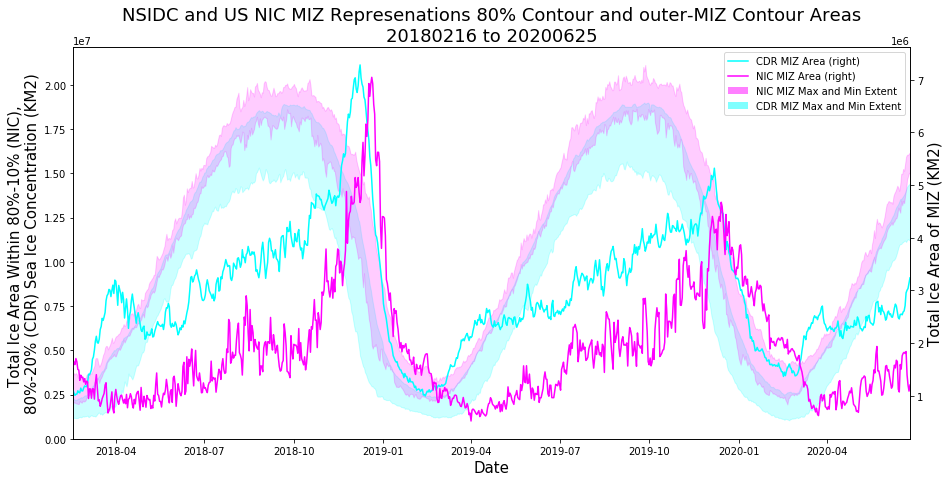

In [9]:
fig, ax = plt.subplots(figsize=(15,8))

colors = {'NIC': 'magenta', 'CDR': 'cyan'}
alpha = .2

recent_df['CDR MIZ Area'] = recent_df['CDR outer extent'] - recent_df['CDR inner extent 0.80']
recent_df['NIC MIZ Area'] = recent_df['NIC outer extent'] - recent_df['NIC inner extent 0.80']

ax.fill_between(recent_df.index, 
                recent_df['CDR inner extent 0.80'], 
                recent_df['CDR outer extent'], 
                color=colors['CDR'], alpha=alpha)

ax.fill_between(recent_df.index, 
                recent_df['NIC inner extent 0.80'], 
                recent_df['NIC outer extent'], 
                color=colors['NIC'], alpha=alpha)

ax2 = ax.twinx()

recent_df['CDR MIZ Area'].plot(ax=ax2, color=colors['CDR'])
recent_df['NIC MIZ Area'].plot(ax=ax2, color=colors['NIC'])

handles, labels = ax2.get_legend_handles_labels()

# Add labels indicating which axis this data is on
labels = [f"{i} (right)" for i in labels]
plt.legend(handles + [plt.Rectangle((0, 0), 1, .1, fc=color, alpha=.5) for color in colors.values()],
           labels + [f'{ds} MIZ Max and Min Extent' for ds in colors.keys()],
           loc='upper right')
ax.set_ylim(0)

# Avoid any space before or after the series
ax.margins(x=0)
ax.set_title("NSIDC and US NIC MIZ Represenations 80% Contour and outer-MIZ Contour Areas\n"
             f"{recent_df.index.min():%Y%m%d} to {recent_df.index.max():%Y%m%d}", size=18)
ax2.set_ylabel('Total Ice Area of MIZ (KM2)', size=15)
ax.set_ylabel('Total Ice Area Within 80%-10% (NIC), \n80%-20% (CDR) Sea Ice Concentration (KM2)', size=15)
ax.set_xlabel('Date', size=15)

ax.ticklabel_format(axis='y', style='sci', scilimits=(-3,4))
ax2.ticklabel_format(axis='y', style='sci', scilimits=(-3,4))
plt.show()

Finally, I was interested in seeing what the longer-term relationship between these two sets of data looked like. After overlaying annual data (February 15th-February 15th) for the entire history of the NIC product, the NIC perimeters were consistently farther north than the CDR perimeters.

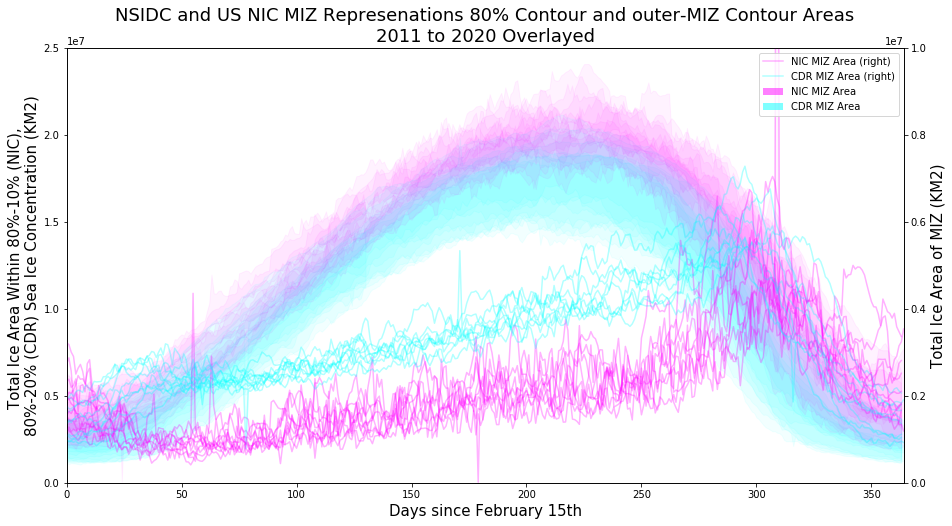

In [10]:
fig, ax = plt.subplots(figsize=(15,8))
colors = {'NIC': 'magenta', 'CDR': 'cyan'}

ax2 = ax.twinx()

alpha = .05

for year in long_term_years_analyzed:
    year_df = df.loc[(datetime.datetime(year.year, 2, 15) < df.index) & (df.index < datetime.datetime(year.year+1, 2, 15))]
    
    year_df.index = (year_df.index - year_df.index[0]).days
    for ds in ['NIC', 'CDR']:        
        ax.fill_between(year_df.index.values, 
                        year_df[f'{ds} inner extent 0.80'].values, 
                        year_df[f'{ds} outer extent'].values, 
                        alpha=alpha, 
                        color=colors[ds])
        year_df[f'{ds} MIZ Area'] = year_df[f'{ds} outer extent'] - year_df[f'{ds} inner extent 0.80']
        
        year_df[f'{ds} MIZ Area'].plot(ax=ax2, color=colors[ds], alpha=.3, legend=True)
        
handles, labels = ax2.get_legend_handles_labels()

# Add labels indicating which axis this data is on
labels = [f"{i} (right)" for i in labels]

# Remove redundant legend entries
by_label = OrderedDict(zip(labels, handles))

plt.legend(list(by_label.values()) + [plt.Rectangle((0, 0), 1, .1, fc=color, alpha=.5) for color in colors.values()],
           list(by_label.keys()) + [f'{ds} MIZ Area' for ds in colors.keys()],
           loc='upper right')
ax.set_ylim(0, 2.5e7)
ax2.set_ylim(0, 10e6)

# Avoid any space before or after the series
ax.margins(x=0)
ax.set_title("NSIDC and US NIC MIZ Represenations 80% Contour and outer-MIZ Contour Areas\n"
             f"{long_term_years_analyzed.min():%Y} to {long_term_years_analyzed.max():%Y} Overlayed", size=18)
ax.set_xlabel('Days since February 15th', size=15)
ax.set_ylabel('Total Ice Area Within 80%-10% (NIC), \n80%-20% (CDR) Sea Ice Concentration (KM2)', size=15)
ax2.set_ylabel('Total Ice Area of MIZ (KM2)', size=15)
ax.ticklabel_format(axis='y', style='sci', scilimits=(-3,4))
ax2.ticklabel_format(axis='y', style='sci', scilimits=(-3,4))
plt.show()

Now that we've confirmed the CDR product does typically underestimate the sea ice concentration when compared to the NIC product, I'm hoping to quantify exactly what this overestimate looks like.  In the plot below, I've taken the mean differences between the 80% NIC threshold and varying CDR thresholds over the entire history of data.  I've found that CDR thresholds of 30% sea ice concentration typically line up with NIC thresholds of 80%.

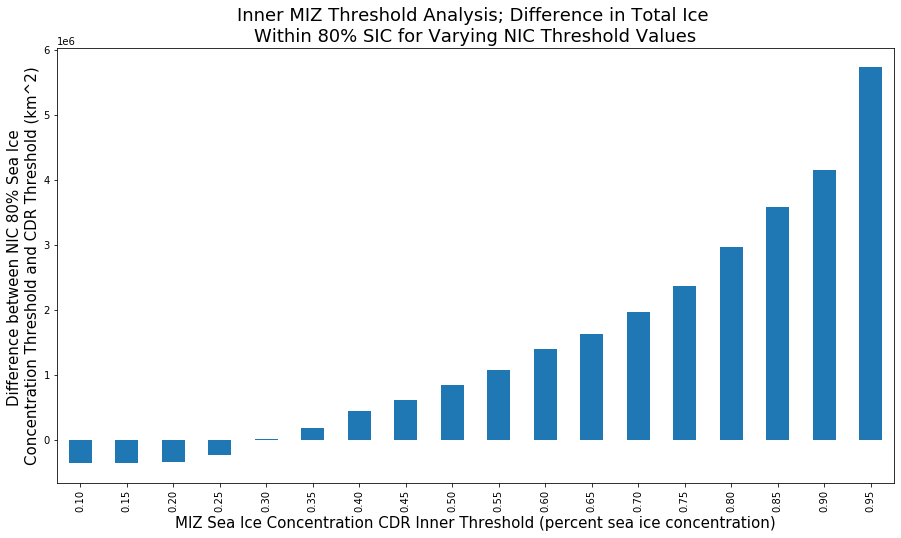

In [11]:
fig, ax = plt.subplots(figsize=(15,8))
mean_df = df.mean()

error_df = pd.DataFrame()

col_name = 'NIC inner extent - CDR inner extent'

for thresh in threshold_range:
    error_df.at[f'{thresh:.2f}', col_name] = \
        mean_df[f'NIC inner extent {thresh:.2f}'] - mean_df[f'CDR inner extent {thresh:.2f}']
    error_df.at[f'{thresh:.2f}', 'abs'] = \
        abs(mean_df[f'NIC inner extent {thresh:.2f}'] - mean_df[f'CDR inner extent {thresh:.2f}'])

error_df[col_name].plot.bar(ax=ax)

# Avoid any space before or after the series
ax.margins(x=0)
ax.set_title("Inner MIZ Threshold Analysis; Difference in Total Ice \nWithin 80% SIC for Varying NIC Threshold Values", size=18)
plt.xlabel('MIZ Sea Ice Concentration CDR Inner Threshold (percent sea ice concentration)', size=15)
ax.set_ylabel('Difference between NIC 80% Sea Ice \nConcentration Threshold and CDR Threshold (km^2)', size=15)
ax.ticklabel_format(axis='y', style='sci', scilimits=(-3,4))

plt.show()

Additionally, I've plotted out these different CDR thresholds over the recent past.  The 30% CDR threshold does visually line up here as well.  

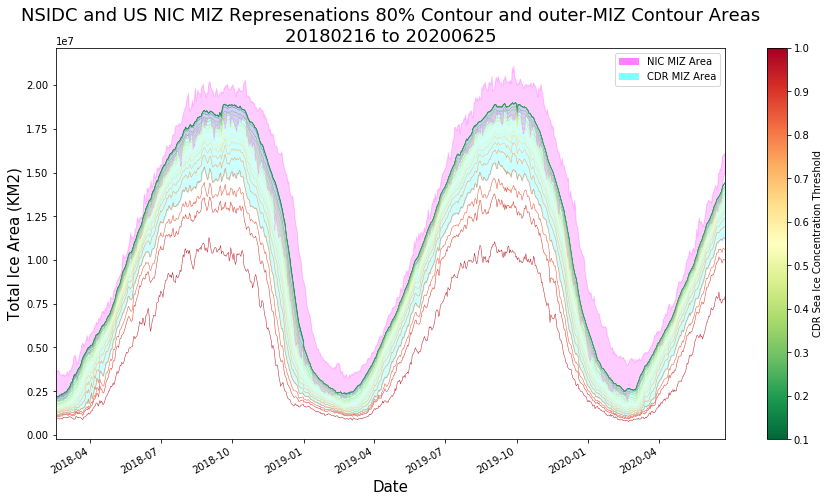

In [12]:
fig, ax = plt.subplots(figsize=(15,8))

colors = {'NIC': 'magenta', 'CDR': 'cyan'}
alpha = .2

ax.fill_between(recent_df.index, 
                recent_df['CDR inner extent 0.80'], 
                recent_df['CDR outer extent'], 
                color=colors['CDR'], alpha=alpha)

ax.fill_between(recent_df.index, 
                recent_df['NIC inner extent 0.80'], 
                recent_df['NIC outer extent'], 
                color=colors['NIC'], alpha=alpha)

jet = plt.get_cmap('RdYlGn_r') 
cNorm  = matplotlib.colors.Normalize(vmin=inner_cdr_thresh_lower, vmax=inner_cdr_thresh_upper)
scalarMap = cm.ScalarMappable(norm=cNorm, cmap=jet)

for thresh in threshold_range:
    recent_df[f'CDR inner extent {thresh:.2f}'].plot(color=scalarMap.to_rgba(thresh), ax=ax, linewidth=.5, legend=False)

cb = plt.colorbar(scalarMap)
cb.set_label('CDR Sea Ice Concentration Threshold')
        
plt.legend([plt.Rectangle((0, 0), 1, .1, fc=color, alpha=.5) for color in colors.values()],
           [f'{ds} MIZ Area' for ds in colors.keys()],
           loc='upper right')

# Avoid any space before or after the series
ax.margins(x=0)
ax.set_title("NSIDC and US NIC MIZ Represenations 80% Contour and outer-MIZ Contour Areas\n"
             f"{recent_df.index.min():%Y%m%d} to {recent_df.index.max():%Y%m%d}", size=18)

ax.set_ylabel('Total Ice Area (KM2)', size=15)
ax.set_xlabel('Date', size=15)

ax.ticklabel_format(axis='y', style='sci', scilimits=(-3,4))
plt.show()

I've selected the 30% CDR threshold and reproduced the graph above.  The lower boundaries of these areas do roughly line up with each other.  Note the upper boundaries, which represent the outer threshold of the marginal ice zone, represent different sea ice concentrations and have not been changed from their original values. 

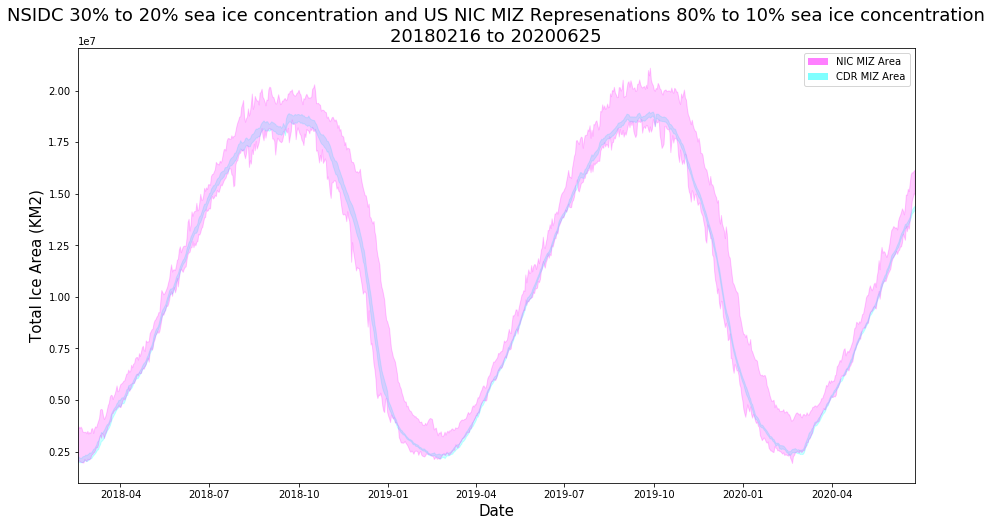

In [13]:
fig, ax = plt.subplots(figsize=(15,8))

colors = {'NIC': 'magenta', 'CDR': 'cyan'}
alpha = .2

ax.fill_between(recent_df.index, 
                recent_df['CDR inner extent 0.30'], 
                recent_df['CDR outer extent'], 
                color=colors['CDR'], alpha=alpha)

ax.fill_between(recent_df.index, 
                recent_df['NIC inner extent 0.80'], 
                recent_df['NIC outer extent'], 
                color=colors['NIC'], alpha=alpha)

# Avoid any space before or after the series
ax.margins(x=0)
ax.set_title("NSIDC 30% to 20% sea ice concentration and US NIC MIZ Represenations 80% to 10% sea ice concentration\n"
             f"{recent_df.index.min():%Y%m%d} to {recent_df.index.max():%Y%m%d}", size=18)

plt.legend([plt.Rectangle((0, 0), 1, .1, fc=color, alpha=.5) for color in colors.values()],
           [f'{ds} MIZ Area' for ds in colors.keys()],
           loc='upper right')

ax.set_ylabel('Total Ice Area (KM2)', size=15)
ax.set_xlabel('Date', size=15)

ax.ticklabel_format(axis='y', style='sci', scilimits=(-3,4))
plt.show()

This further visually confirms the 30% threshold for the CDR data generally agrees with the historical 80% NIC sea ice concentration threshold as well.  

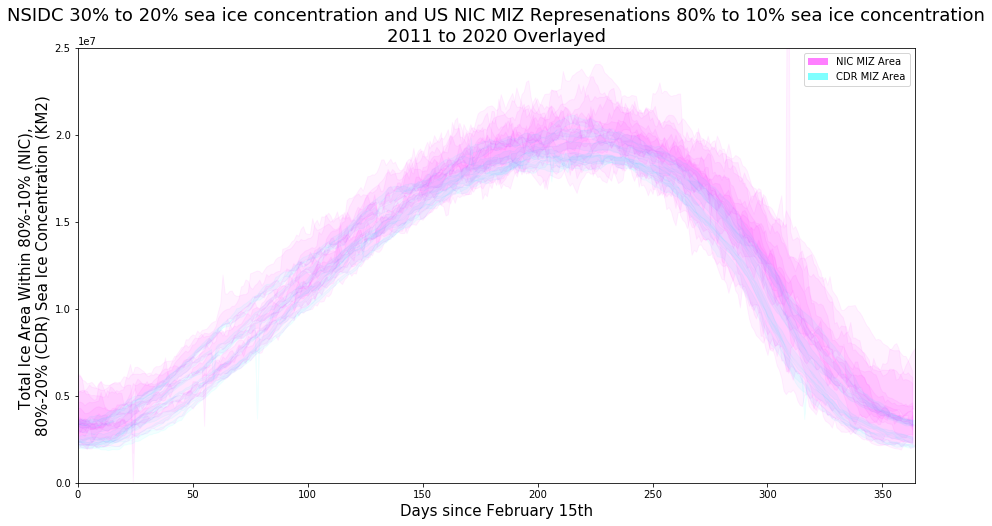

In [14]:
fig, ax = plt.subplots(figsize=(15,8))
colors = {'NIC': 'magenta', 'CDR': 'cyan'}

alpha = .05

for year in long_term_years_analyzed:
    year_df = df.loc[(datetime.datetime(year.year, 2, 15) < df.index) & (df.index < datetime.datetime(year.year+1, 2, 15))]
    
    year_df.index = (year_df.index - year_df.index[0]).days
    ax.fill_between(year_df.index.values, 
                    year_df[f'NIC inner extent 0.80'].values, 
                    year_df[f'NIC outer extent'].values, 
                    alpha=alpha, 
                    color=colors['NIC'])

    ax.fill_between(year_df.index.values, 
                    year_df[f'CDR inner extent 0.30'].values, 
                    year_df[f'CDR outer extent'].values, 
                    alpha=alpha, 
                    color=colors['CDR'])

plt.legend([plt.Rectangle((0, 0), 1, .1, fc=color, alpha=.5) for color in colors.values()],
           [f'{ds} MIZ Area' for ds in colors.keys()],
           loc='upper right')
ax.set_ylim(0, 2.5e7)

# Avoid any space before or after the series
ax.margins(x=0)
ax.set_title("NSIDC 30% to 20% sea ice concentration and US NIC MIZ Represenations 80% to 10% sea ice concentration\n"
             f"{long_term_years_analyzed.min():%Y} to {long_term_years_analyzed.max():%Y} Overlayed", size=18)
ax.set_xlabel('Days since February 15th', size=15)
ax.set_ylabel('Total Ice Area Within 80%-10% (NIC), \n80%-20% (CDR) Sea Ice Concentration (KM2)', size=15)
ax.ticklabel_format(axis='y', style='sci', scilimits=(-3,4))
plt.show()

As I continue studying these products, I’m hoping to dive further into precisely what might be causing the differences noted above. I’m also interested in determining what percent Sea Ice Concentration in the CDR data represents the 80% Sea Ice Concentration in the NIC data. 

To find out more about this project and re-run the entire workflow locally, visit the [github project](https://github.com/mikedorfman/NSIDC-MIZ-Comparison).


In [15]:
# Outer threshold represents the minimum sea ice categorized as MIZ
# Inner threshold represents the maximum sea ice categorized as MIZ 
outer_nic_thresh = .1
inner_nic_thresh = .8

outer_cdr_thresh = .15
inner_cdr_thresh = .8

# We want to have individual time series for each year
# To capture the most interesting data in the center of the graph, have the left-side be at the mean minimum sea ice extent
year_delimeters = pd.date_range(start=start, end=end, freq='AS', closed="right")

# ~Feb 15 = minimum, 46 days into the year
offset_from_year_start = datetime.timedelta(days=46)

year_delimeters = [year + offset_from_year_start for year in year_delimeters]
dfs = []
for year_start in year_delimeters:
    year_end = year_start + pd.DateOffset(years=1)
    ice_areas = []
    df = pd.DataFrame()
    
    for day_analyzed in pd.date_range(start=year_start, end=year_end, closed="right"):
        try:
            cdr_grid = get_cdr(day_analyzed, cdr_input_folder, hemi)
            nic_grid = get_nic(day_analyzed, nic_input_folder, hemi)

            inner_area_footprint = calculate_ice_footprint_diff(nic_grid, inner_nic_thresh, 1, cdr_grid, inner_cdr_thresh, 1)
            outer_area_footprint = calculate_ice_footprint_diff(nic_grid, outer_nic_thresh, 1, cdr_grid, outer_cdr_thresh, 1)
            miz_footprint = calculate_ice_footprint_diff(nic_grid, outer_nic_thresh, inner_nic_thresh, cdr_grid, outer_cdr_thresh, inner_cdr_thresh)
            
            _, miz_counts = np.unique(miz_footprint, return_counts=True)
            a = miz_counts[0]
            b = miz_counts[3]
            c = miz_counts[2]
            d = miz_counts[1]
            miz_hit = a / (a + c)
            miz_false_alarm = b / (b + d)
            miz_KSS = miz_hit - miz_false_alarm
            df.at[day_analyzed, 'MIZ hit'] = miz_hit
            df.at[day_analyzed, 'MIZ false alarm rate'] = miz_false_alarm
            df.at[day_analyzed, 'MIZ Hanssen-Kuiper Skill Score'] = miz_KSS
            
            #inner_area_hit = 
            #inner_area_false_alarm =
            #inner_area_KSS = inner_area_hit - inner_area_false_alarm
            #df.at[day_analyzed, 'inner area hit'] = inner_area_hit
            #df.at[day_analyzed, 'inner area false alarm rate'] = inner_area_false_alarm
            #df.at[day_analyzed, 'Hanssen-Kuiper Skill Score'] = inner_area_KSS
            
            
            #plt.imshow(inner_area_footprint)
            #plt.colorbar()
            #plt.show()
            #plt.imshow(outer_area_footprint)
            #plt.colorbar()
            #plt.show()
            #plt.imshow(miz_footprint)
            #plt.colorbar()
            #plt.show()
            #continue
            
        except Exception as e:
            if verbose:
                print(f"Couldn't run {day_analyzed}; {e}")
    dfs.append(df)
            

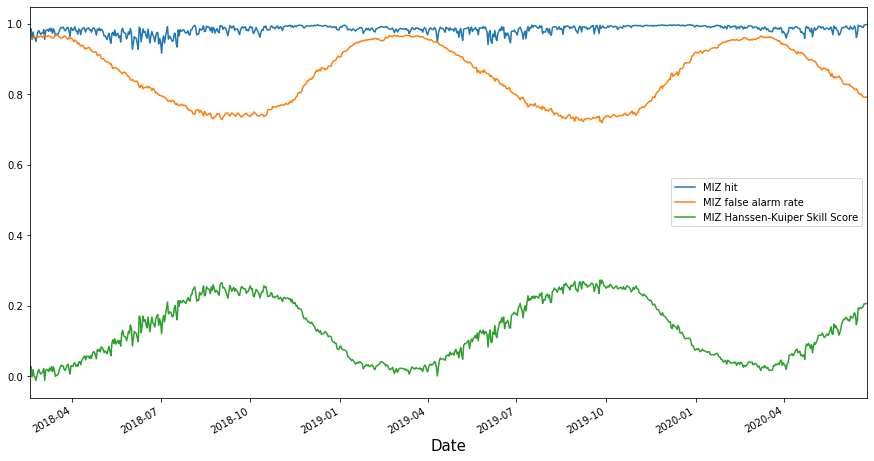

In [16]:
last_three_years_list = dfs[-3:]

last_three_years_df = pd.concat(last_three_years_list).fillna(value=0)

fig, ax = plt.subplots(figsize=(15,8))

colors = {'NIC': 'magenta', 'CDR': 'cyan'}
alpha = .2

last_three_years_df.plot(ax=ax)

# Avoid any space before or after the series
ax.margins(x=0)
ax.set_title('', size=18)
ax.set_ylabel('', size=15)
ax.set_xlabel('Date', size=15)

ax.ticklabel_format(axis='y', style='sci', scilimits=(-3,4))
plt.show()

I've updated the median sea ice extent plots to use the 30% sea ice concentration threshold for the CDR dataset and found that the two datasets do line up well when viewing the perimeters on a monthly basis as well.

Working on 2018-03-01 00:00:00 to 2018-03-31 00:00:00


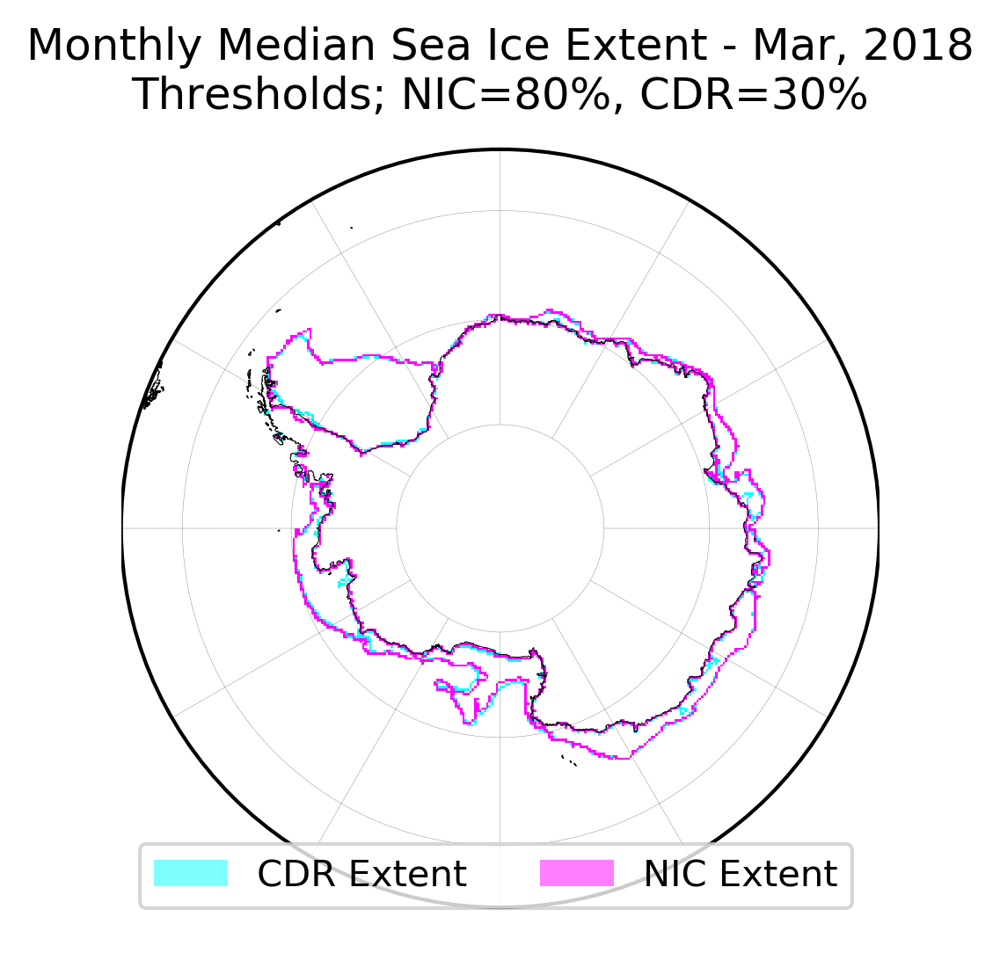

Working on 2018-04-01 00:00:00 to 2018-04-30 00:00:00


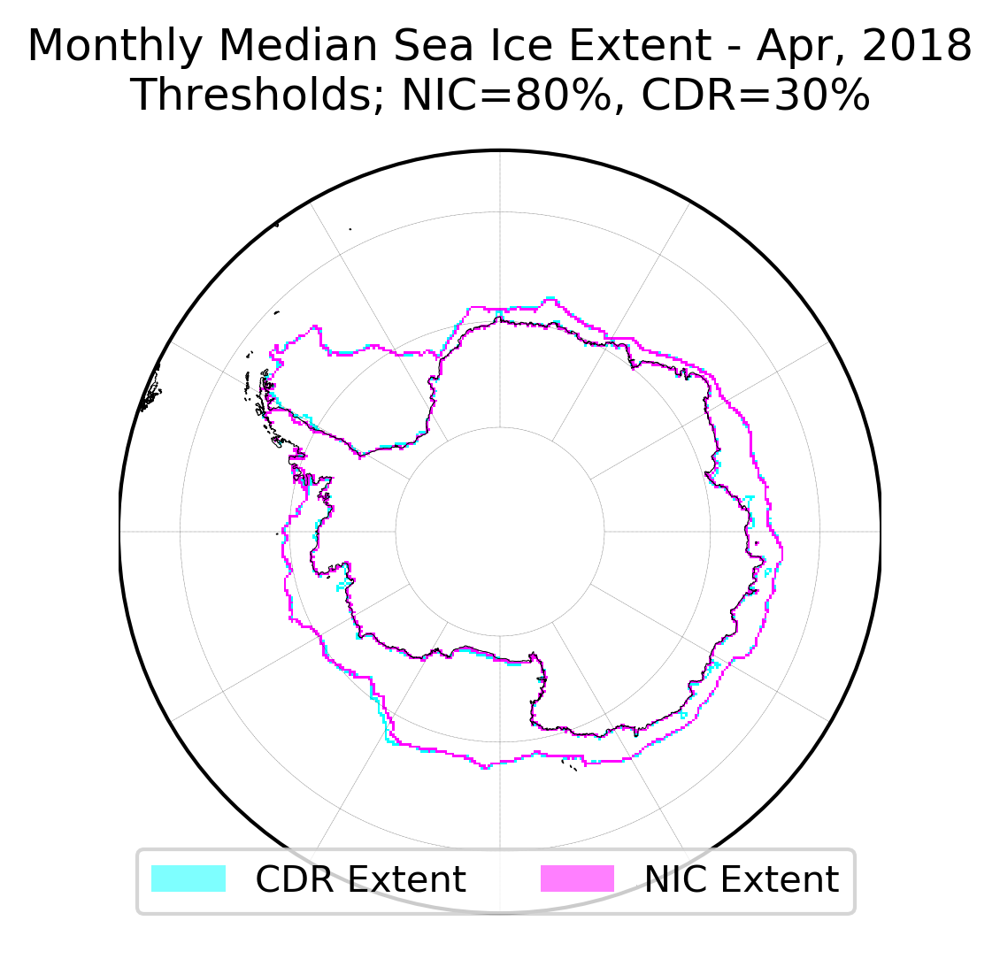

Working on 2018-05-01 00:00:00 to 2018-05-31 00:00:00


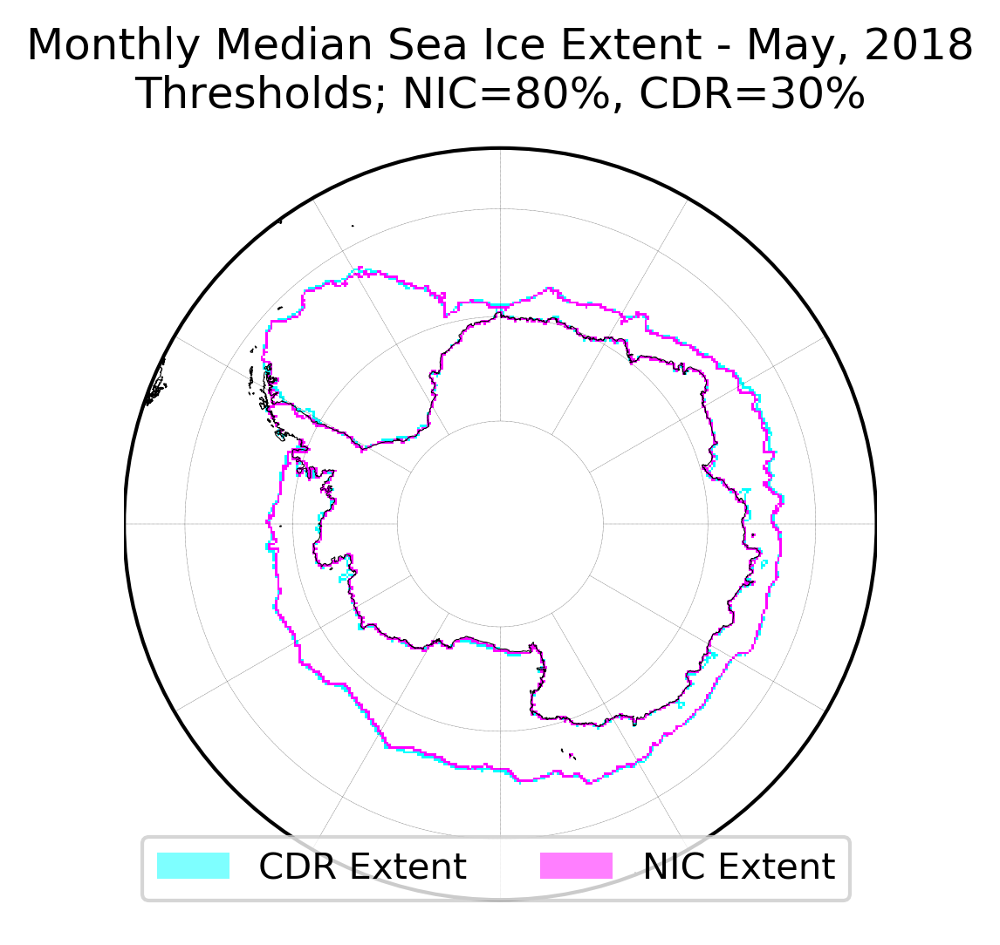

Working on 2018-06-01 00:00:00 to 2018-06-30 00:00:00
Could not run 2018-06-03 00:00:00 because [Errno 2] No such file or directory: 'data\\antarctic\\inputs\\nic\\20180603_south_nic.npy'; continuing


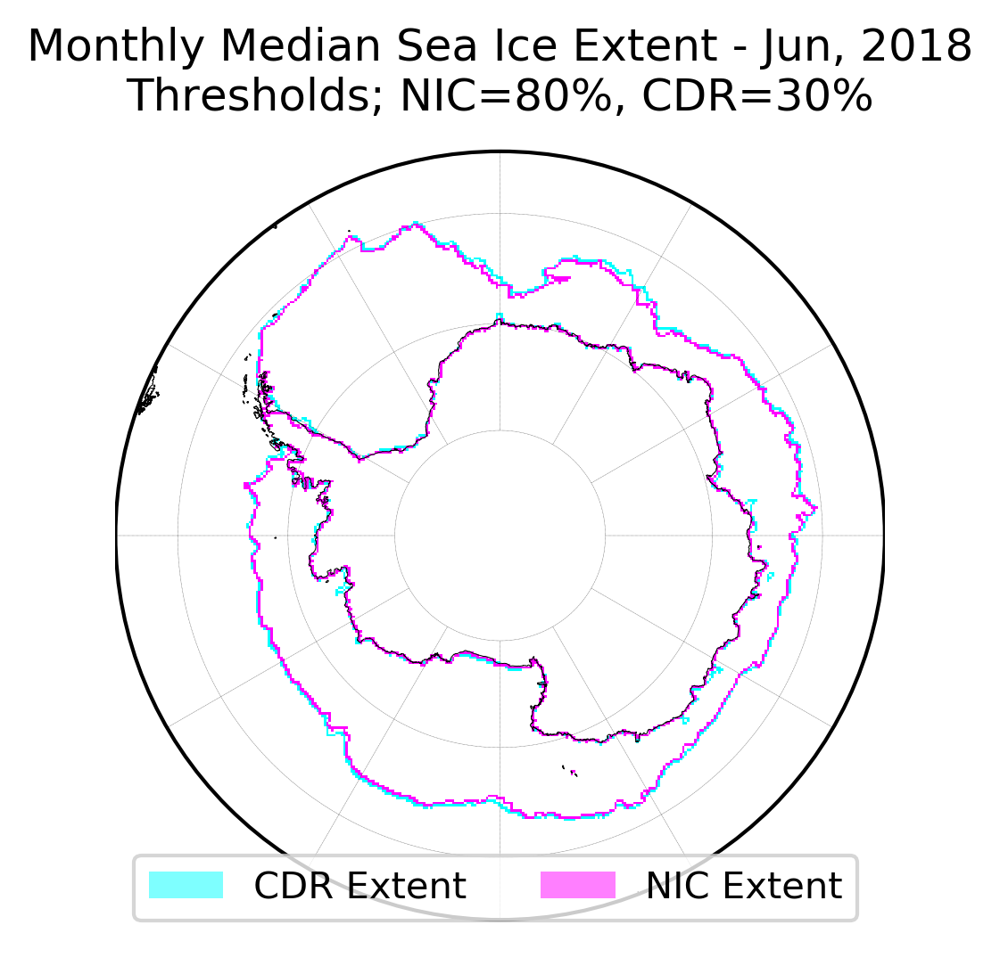

Working on 2018-07-01 00:00:00 to 2018-07-31 00:00:00


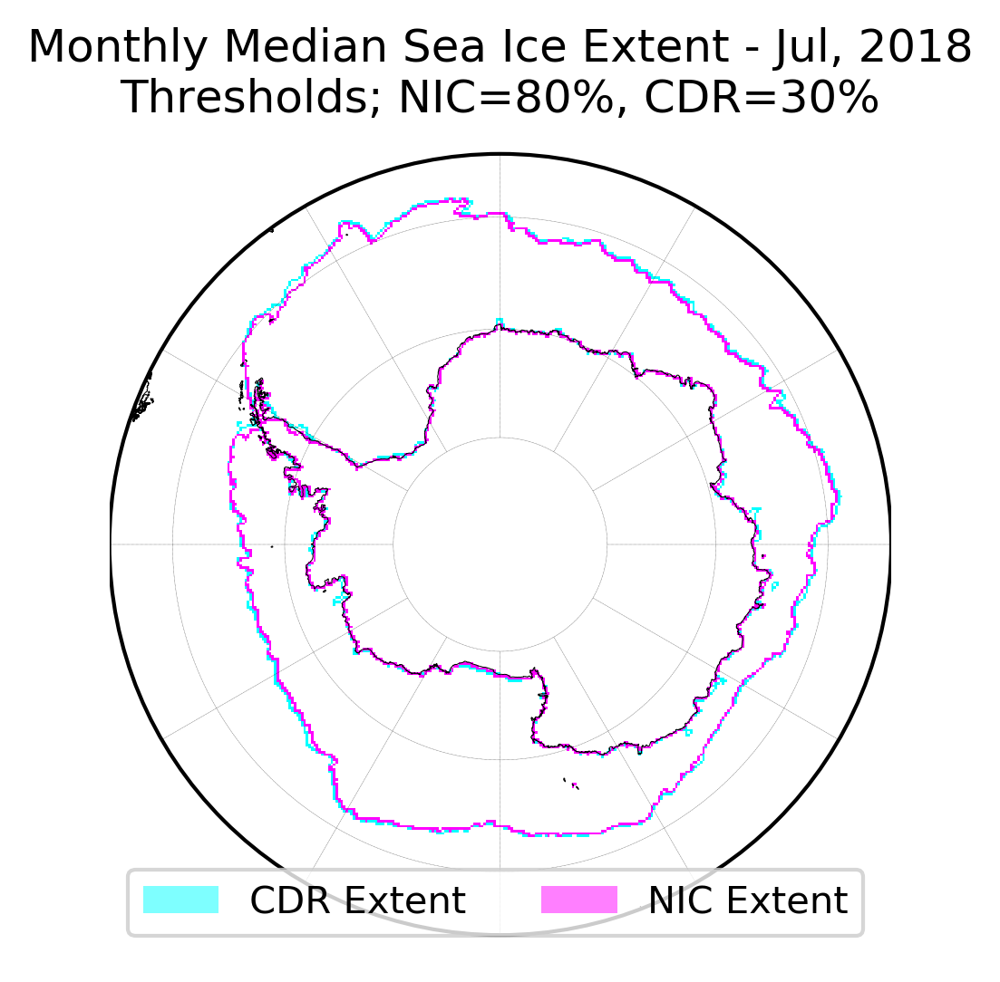

Working on 2018-08-01 00:00:00 to 2018-08-31 00:00:00


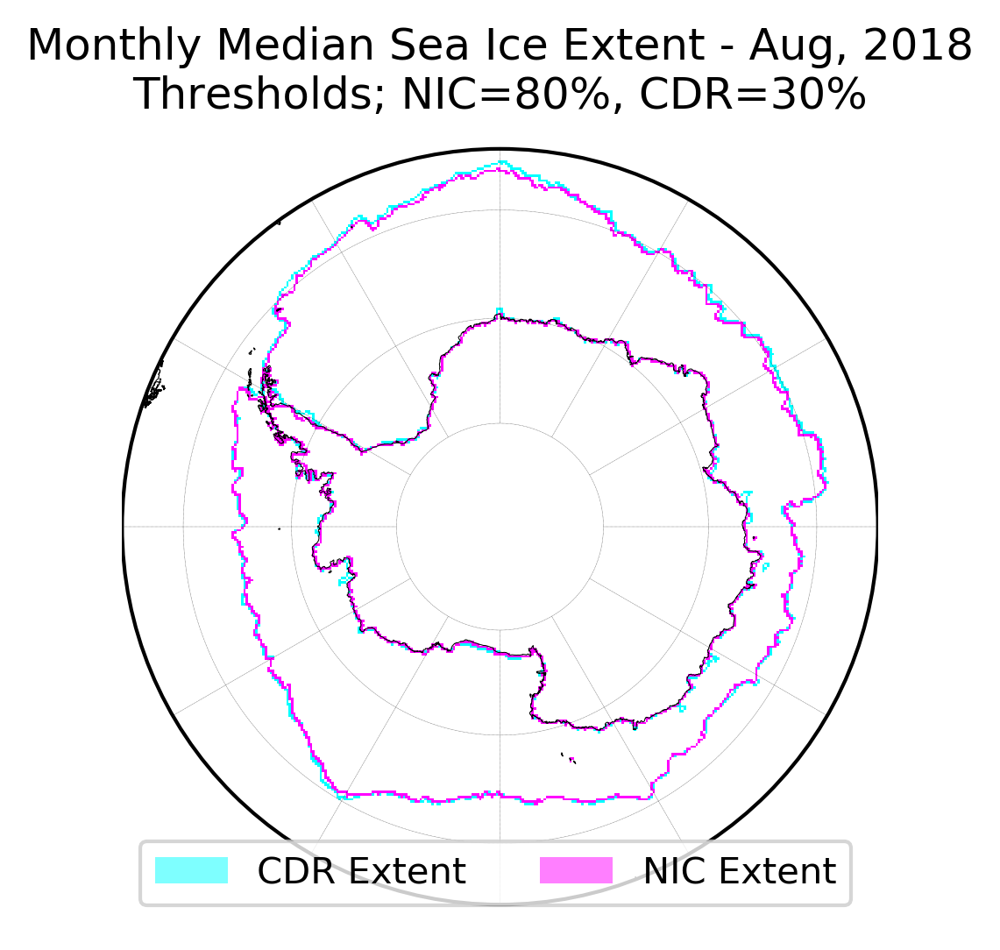

Working on 2018-09-01 00:00:00 to 2018-09-30 00:00:00


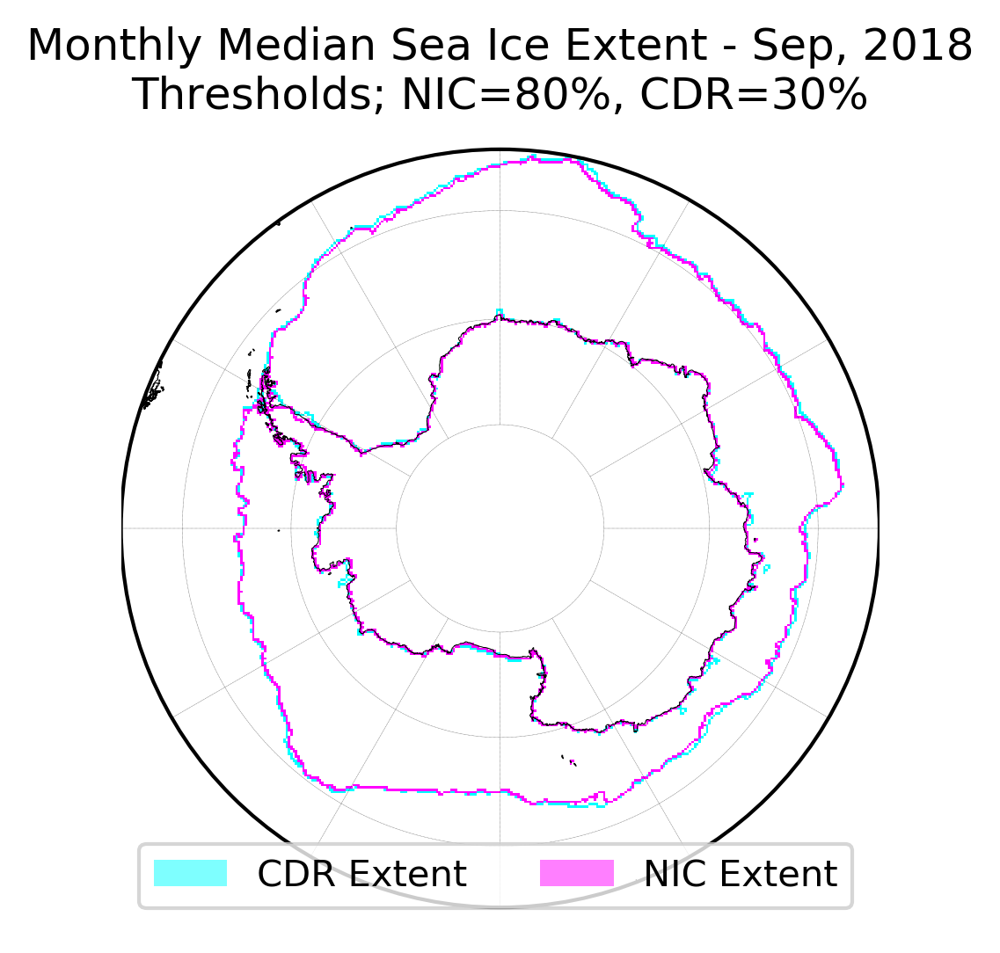

Working on 2018-10-01 00:00:00 to 2018-10-31 00:00:00


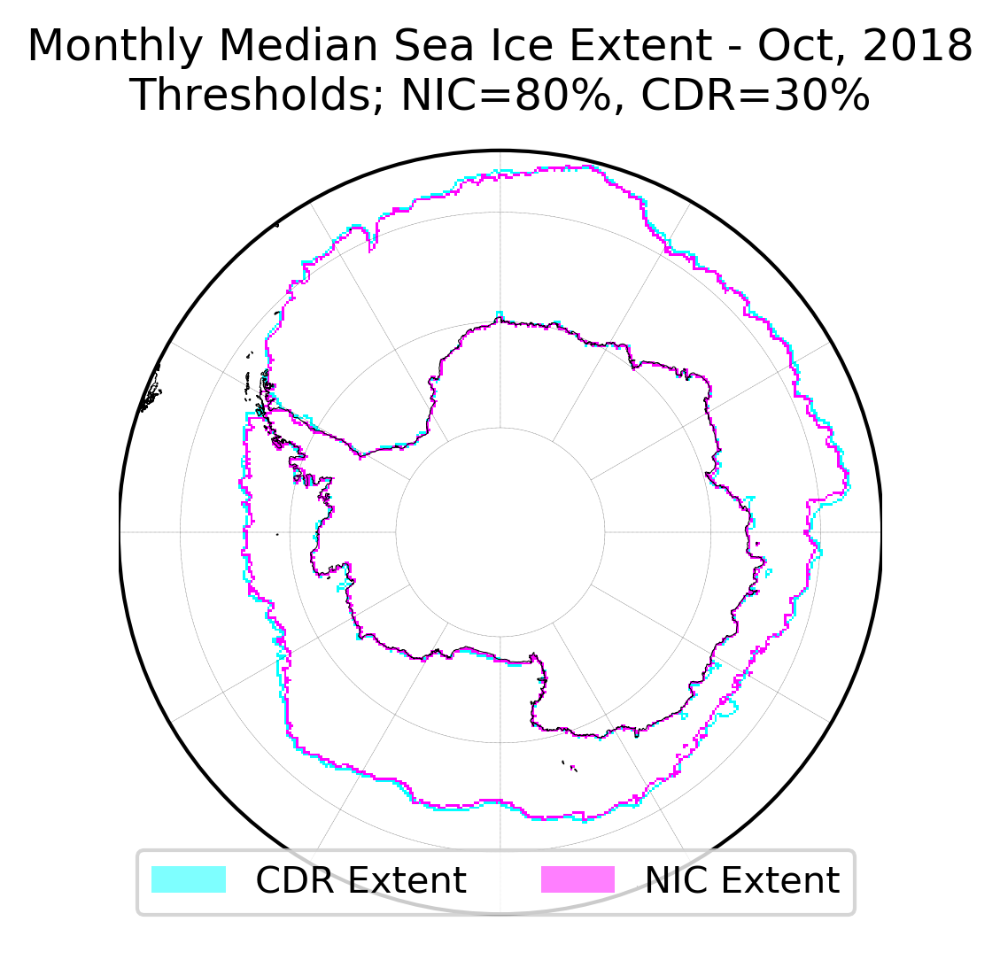

Working on 2018-11-01 00:00:00 to 2018-11-30 00:00:00


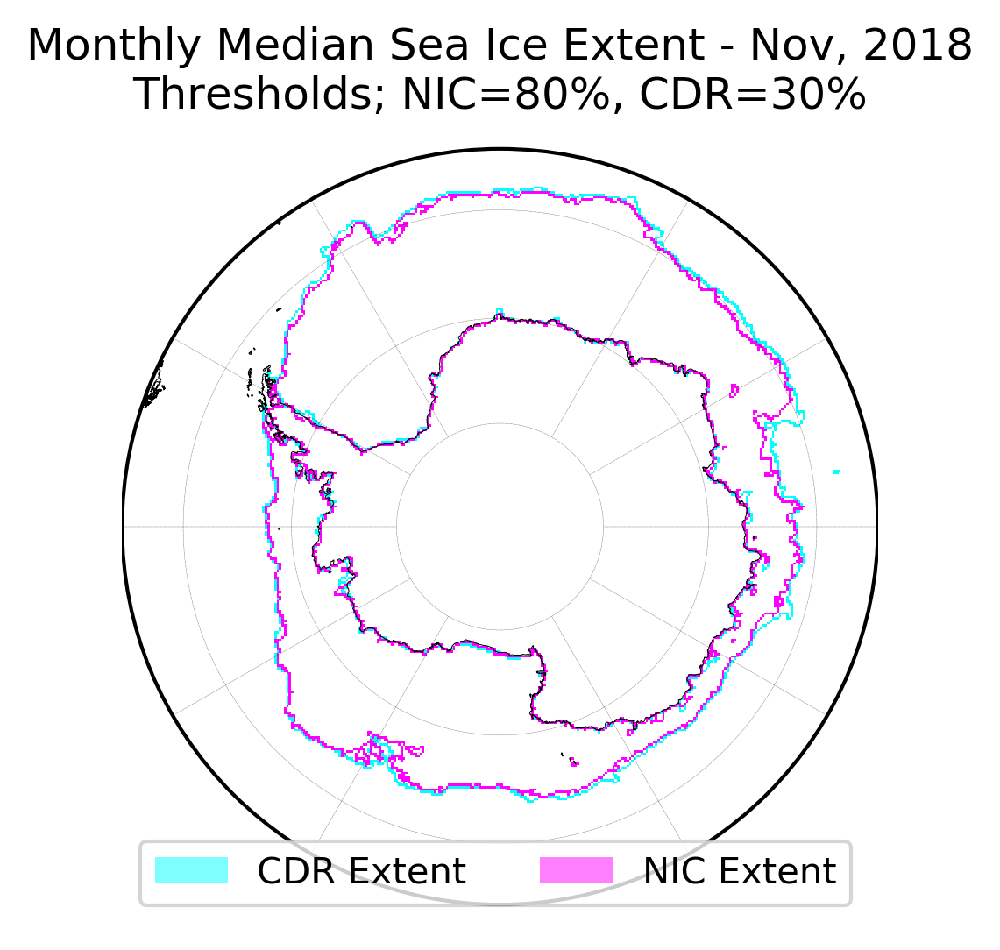

Working on 2018-12-01 00:00:00 to 2018-12-31 00:00:00


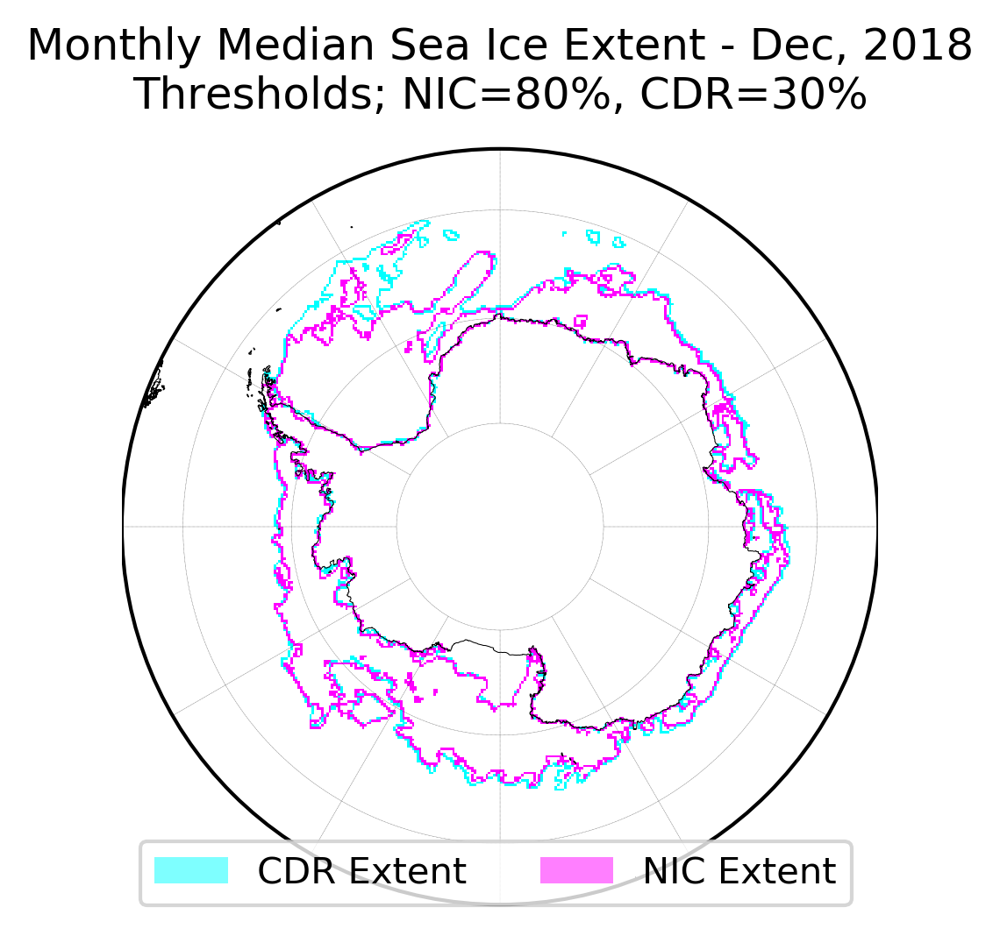

Working on 2019-01-01 00:00:00 to 2019-01-31 00:00:00


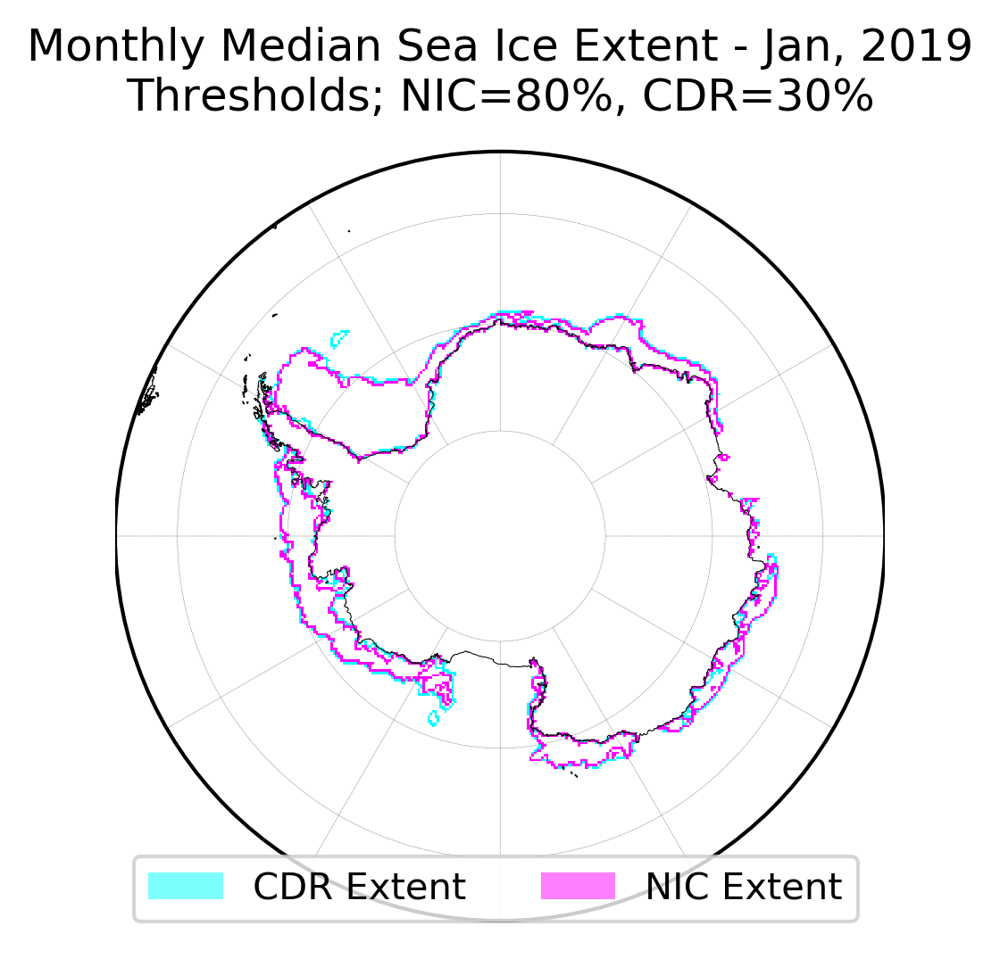

Working on 2019-02-01 00:00:00 to 2019-02-28 00:00:00


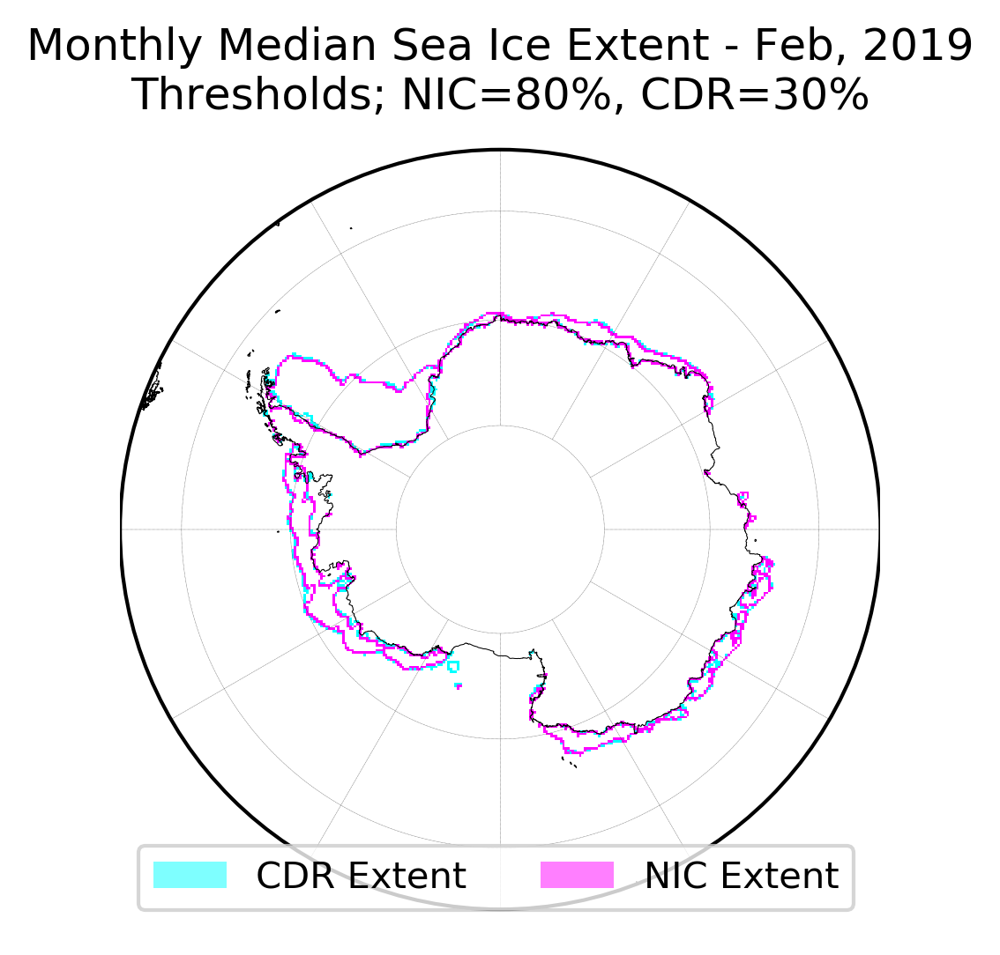

Working on 2019-03-01 00:00:00 to 2019-03-31 00:00:00


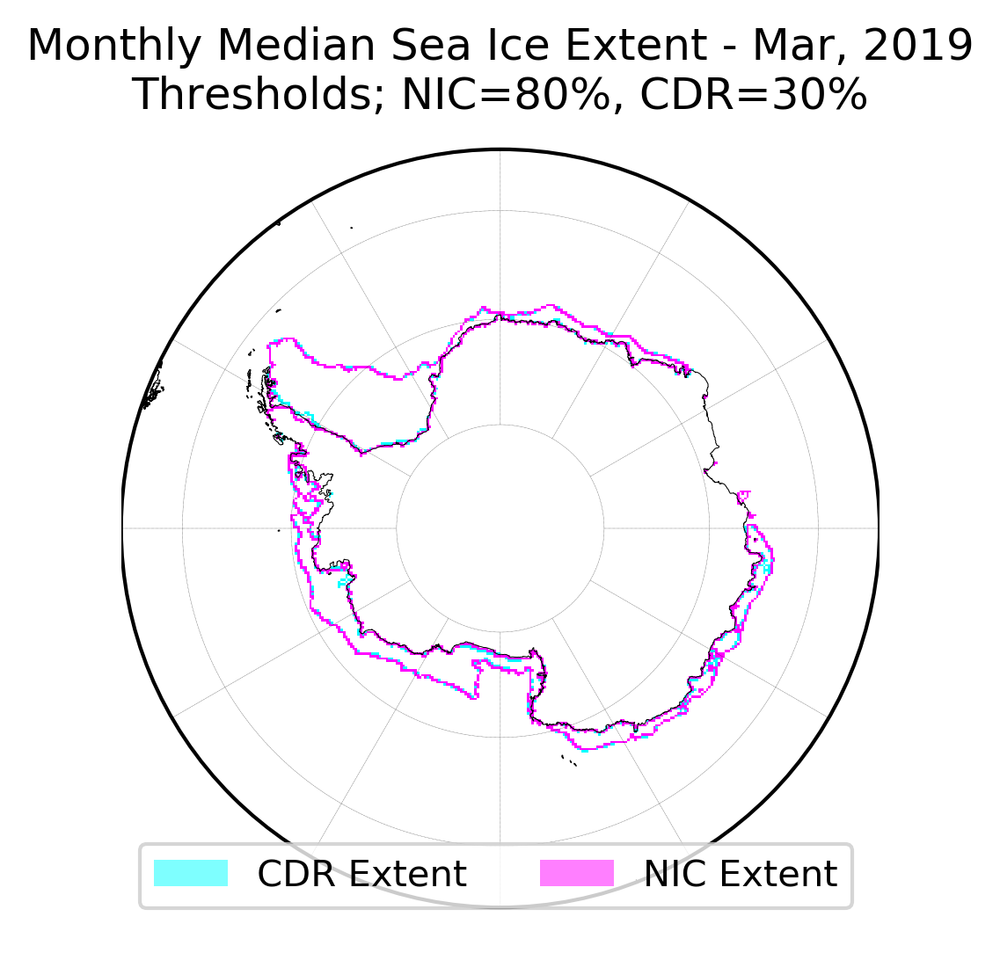

Working on 2019-04-01 00:00:00 to 2019-04-30 00:00:00


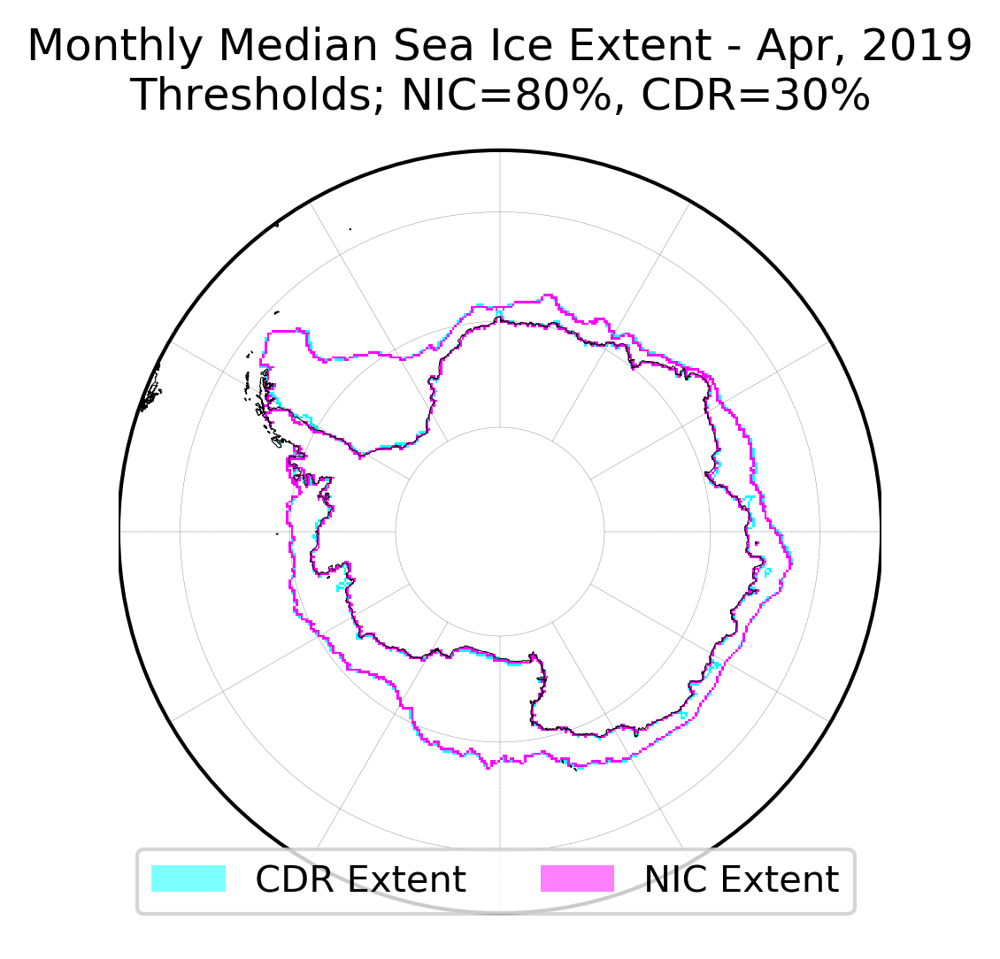

Working on 2019-05-01 00:00:00 to 2019-05-31 00:00:00


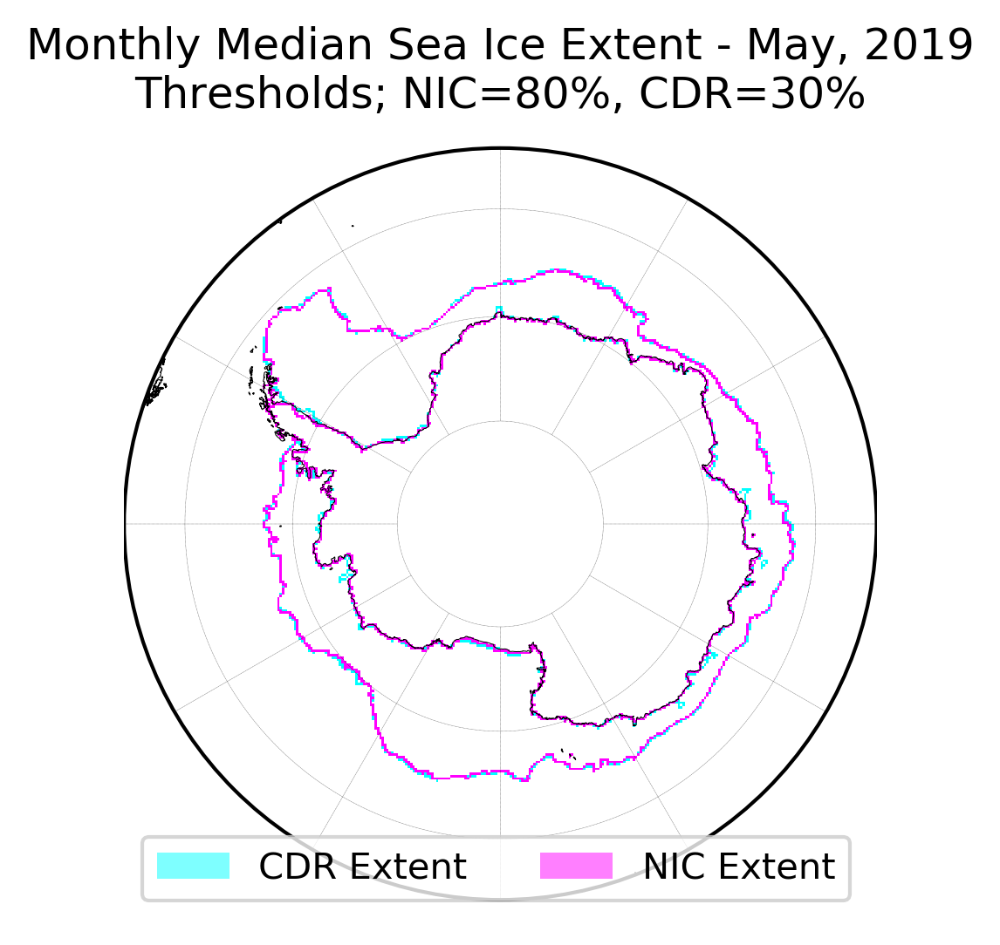

Working on 2019-06-01 00:00:00 to 2019-06-30 00:00:00


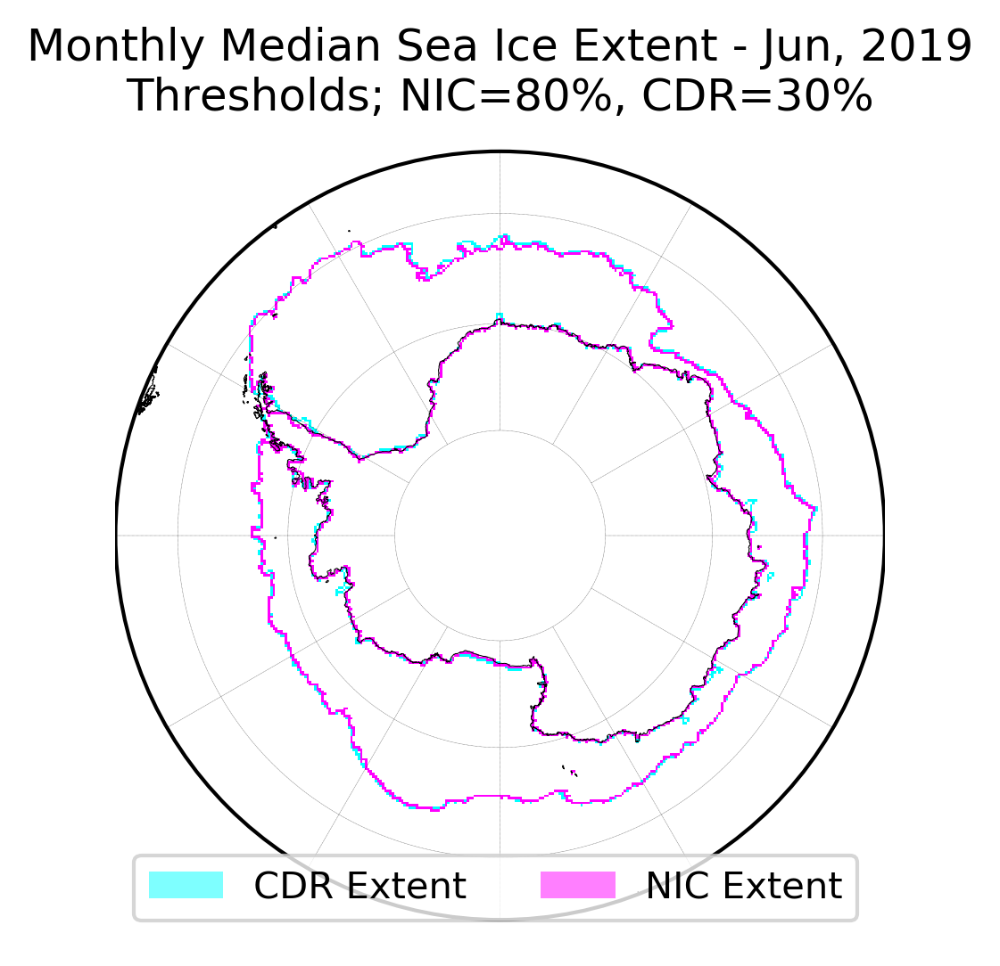

Working on 2019-07-01 00:00:00 to 2019-07-31 00:00:00


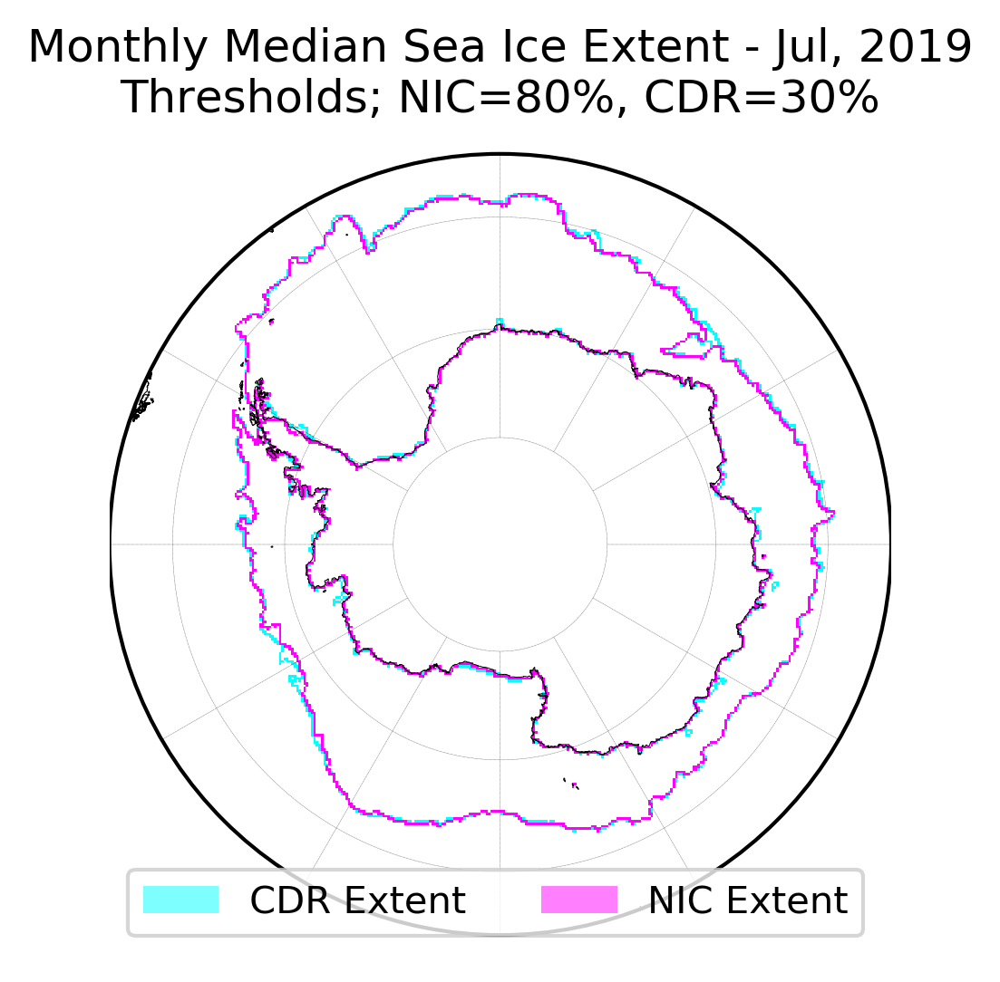

Working on 2019-08-01 00:00:00 to 2019-08-31 00:00:00


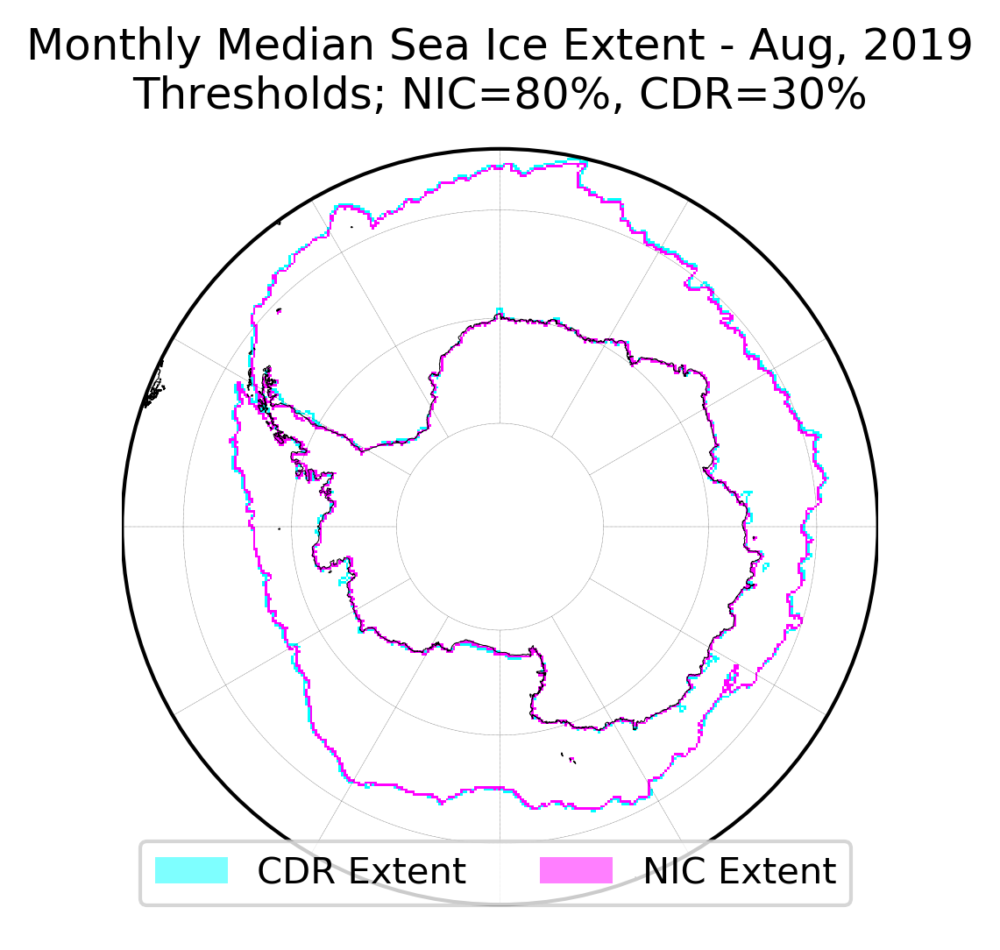

Working on 2019-09-01 00:00:00 to 2019-09-30 00:00:00


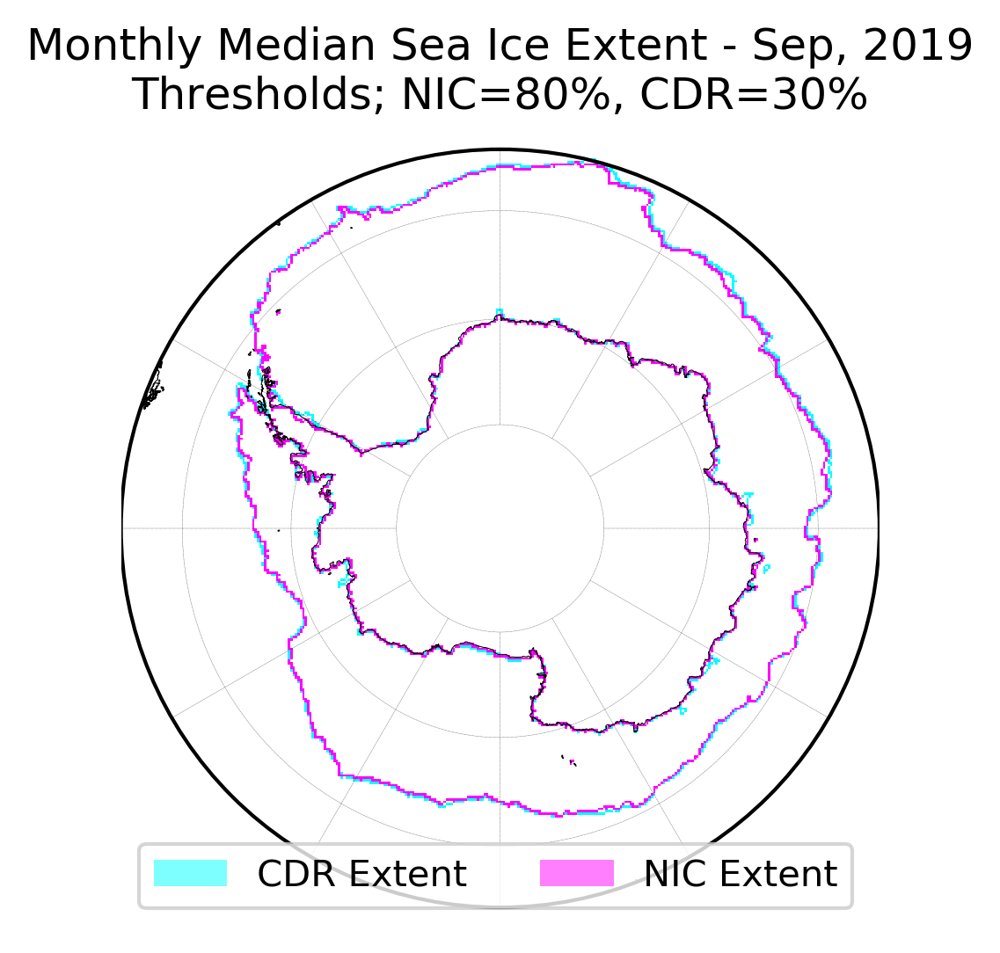

Working on 2019-10-01 00:00:00 to 2019-10-31 00:00:00


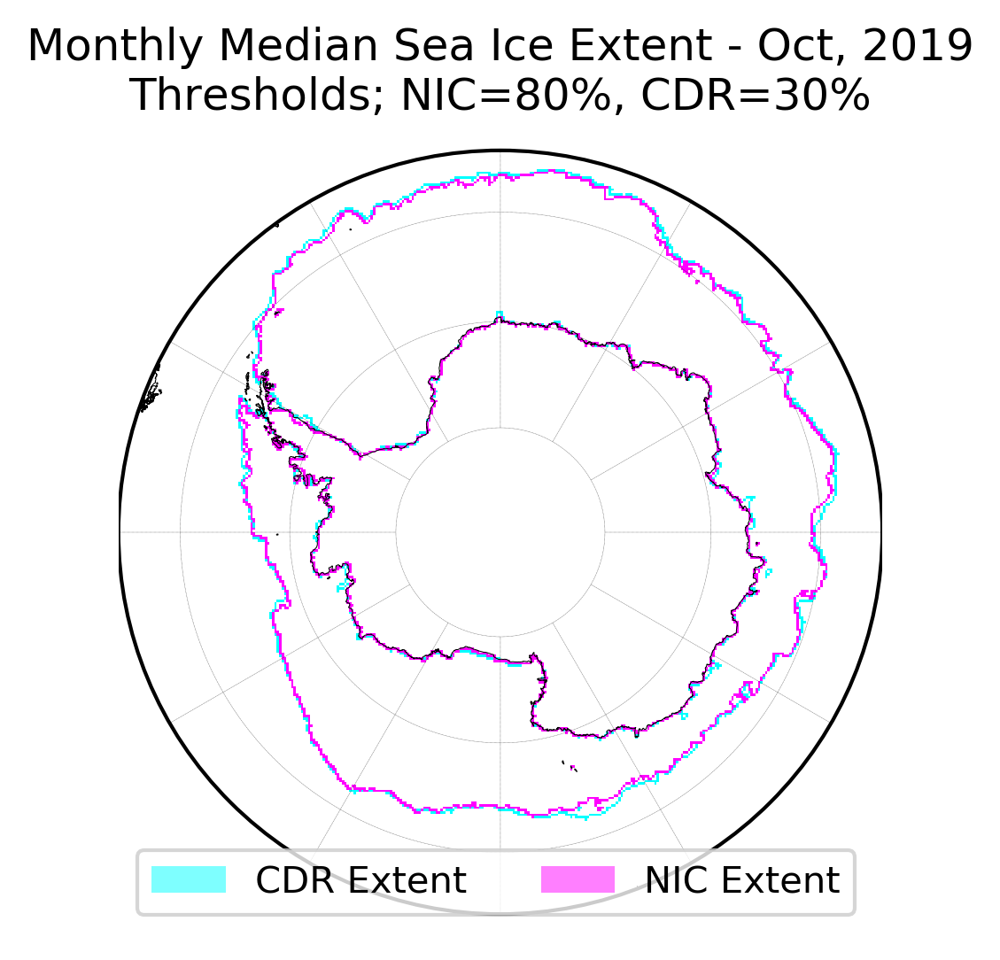

Working on 2019-11-01 00:00:00 to 2019-11-30 00:00:00


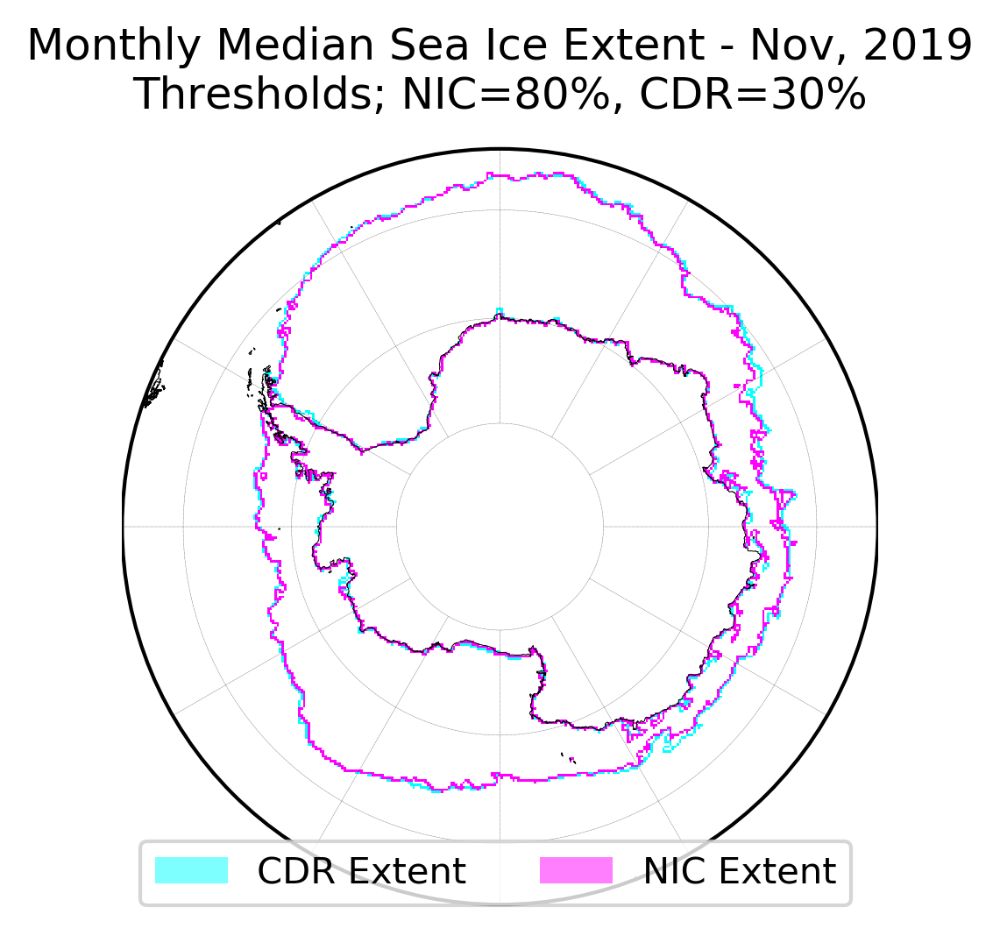

Working on 2019-12-01 00:00:00 to 2019-12-31 00:00:00


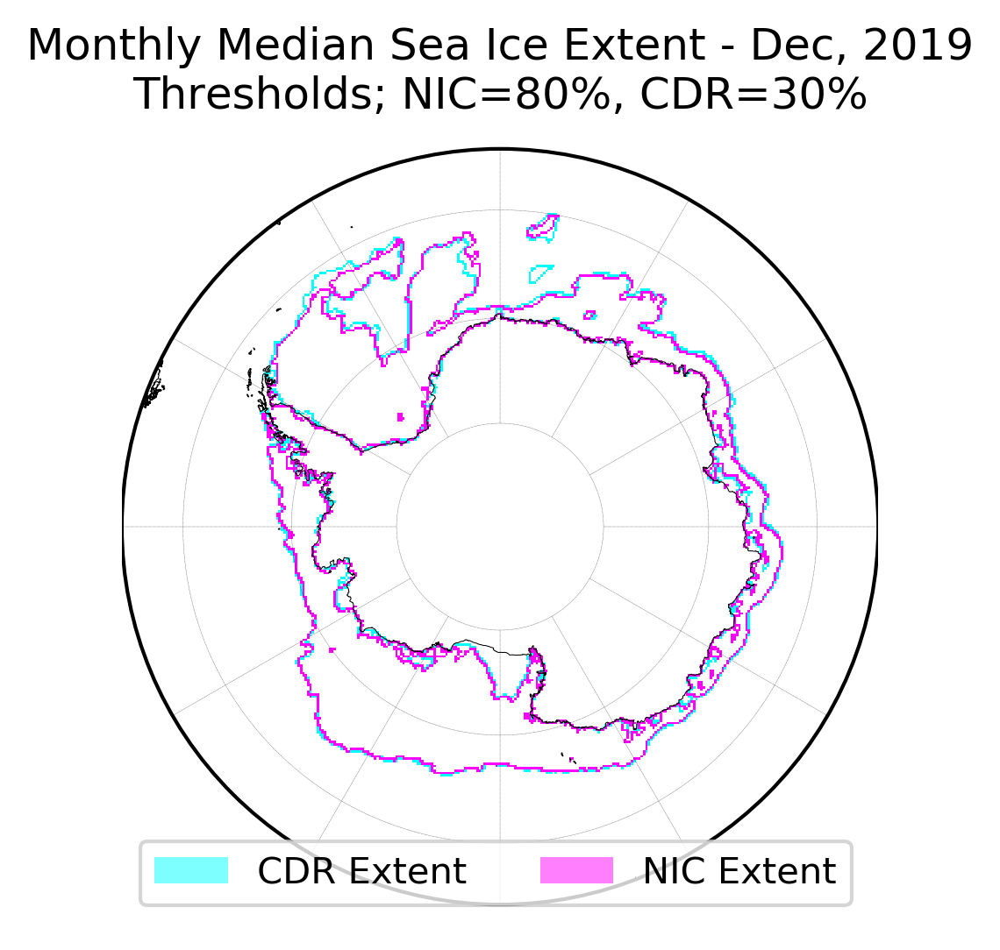

Working on 2020-01-01 00:00:00 to 2020-01-31 00:00:00


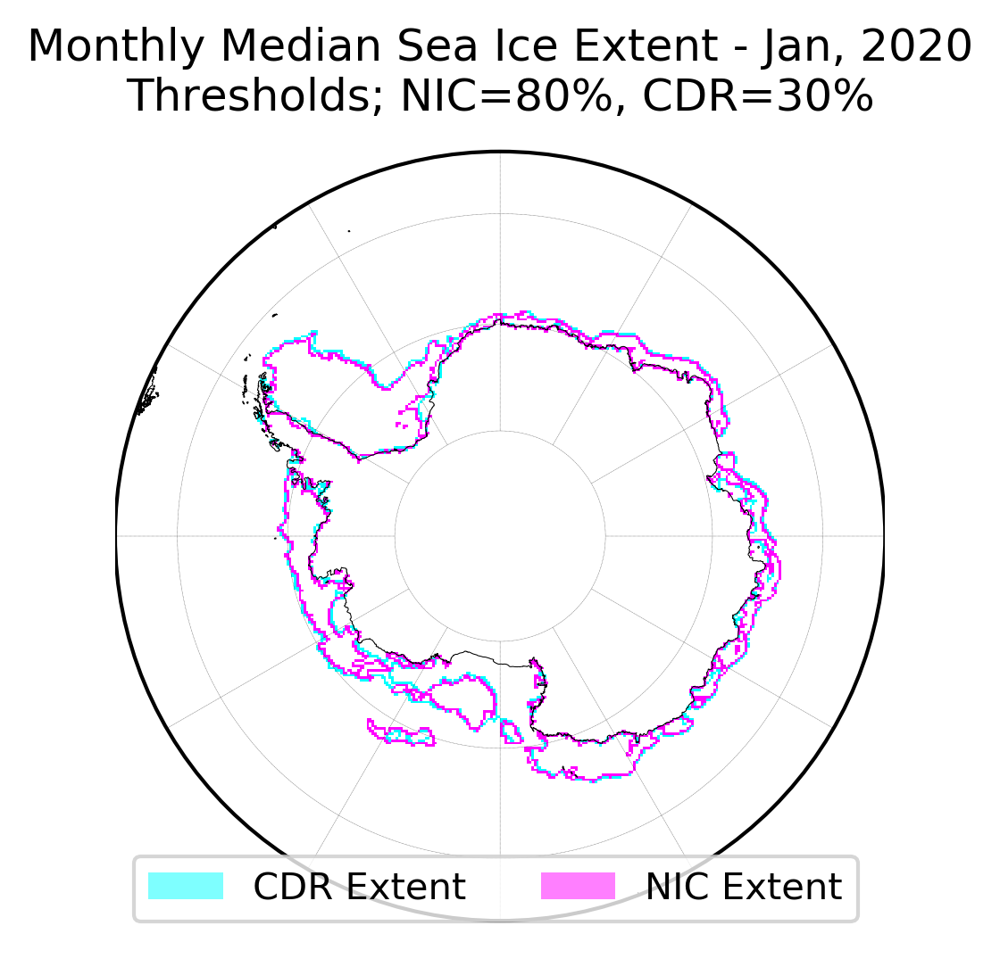

Working on 2020-02-01 00:00:00 to 2020-02-29 00:00:00


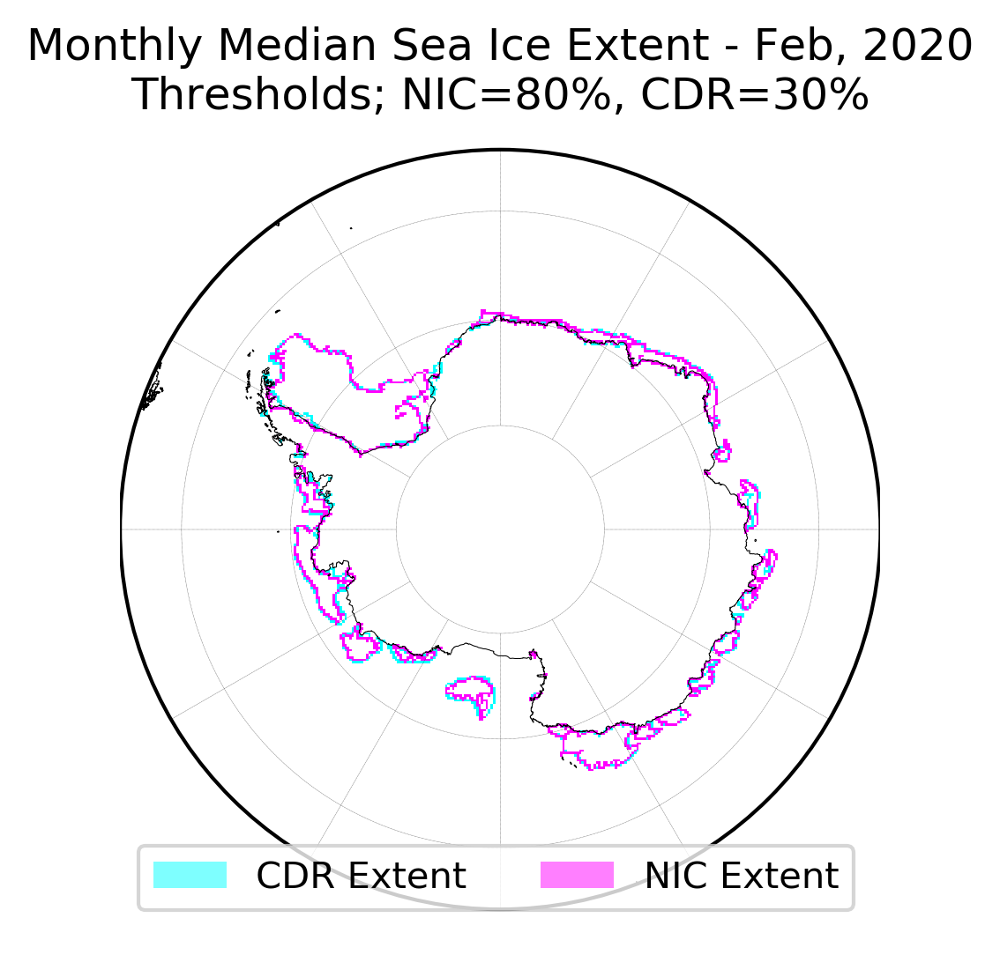

Working on 2020-03-01 00:00:00 to 2020-03-31 00:00:00


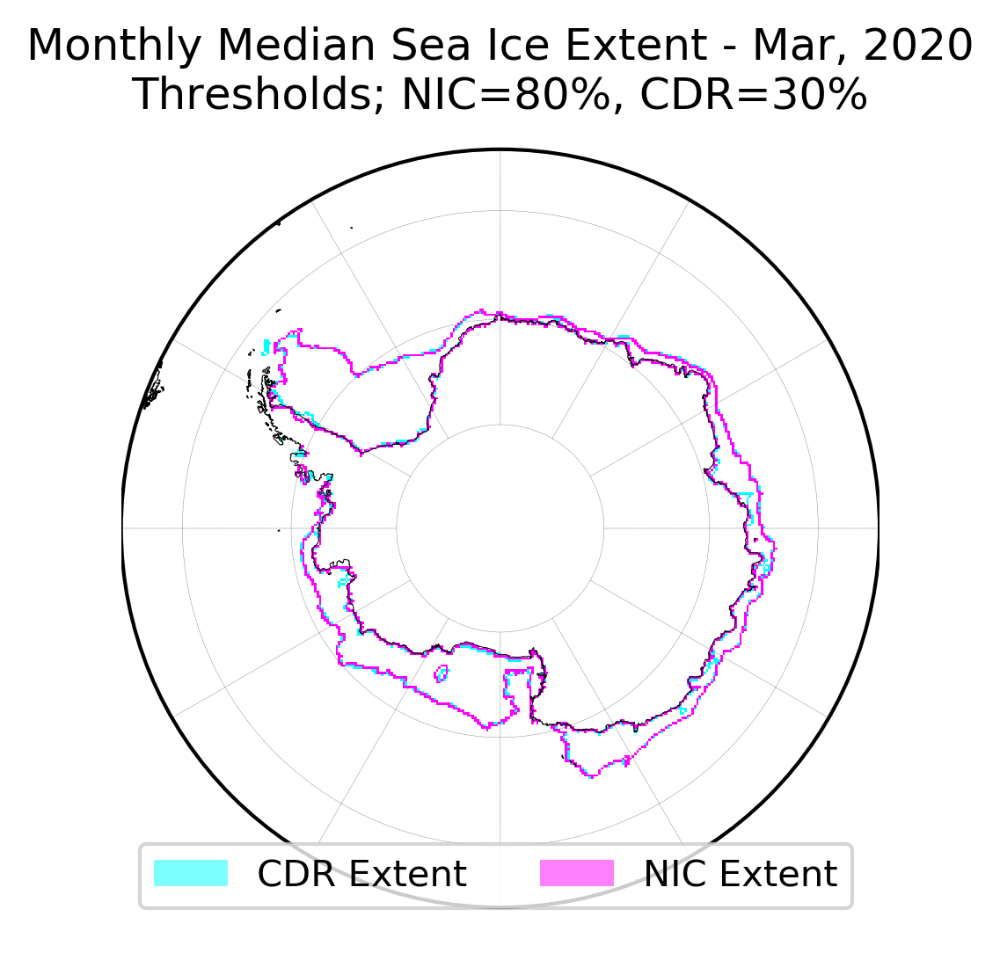

Working on 2020-04-01 00:00:00 to 2020-04-30 00:00:00
Could not run 2020-04-27 00:00:00 because [Errno 2] No such file or directory: 'data\\antarctic\\inputs\\nic\\20200427_south_nic.npy'; continuing


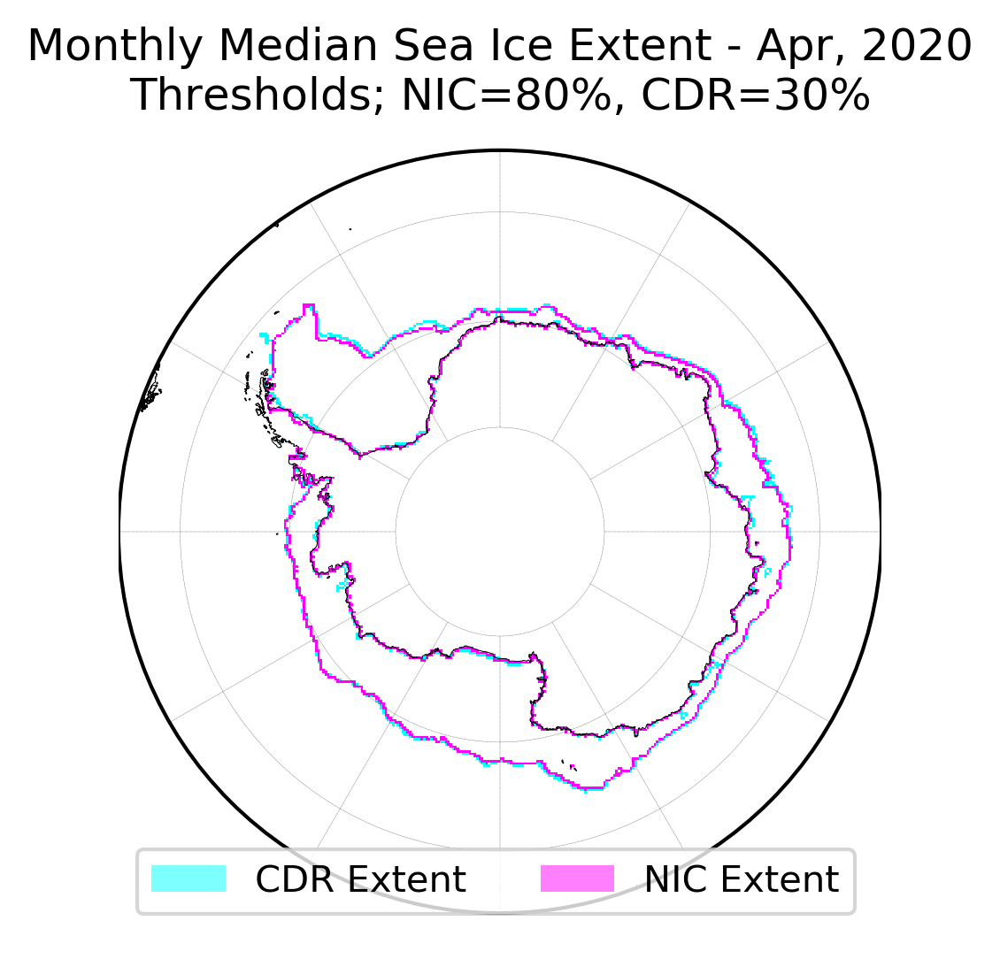

Working on 2020-05-01 00:00:00 to 2020-05-31 00:00:00
Could not run 2020-05-04 00:00:00 because [Errno 2] No such file or directory: 'data\\antarctic\\inputs\\nic\\20200504_south_nic.npy'; continuing


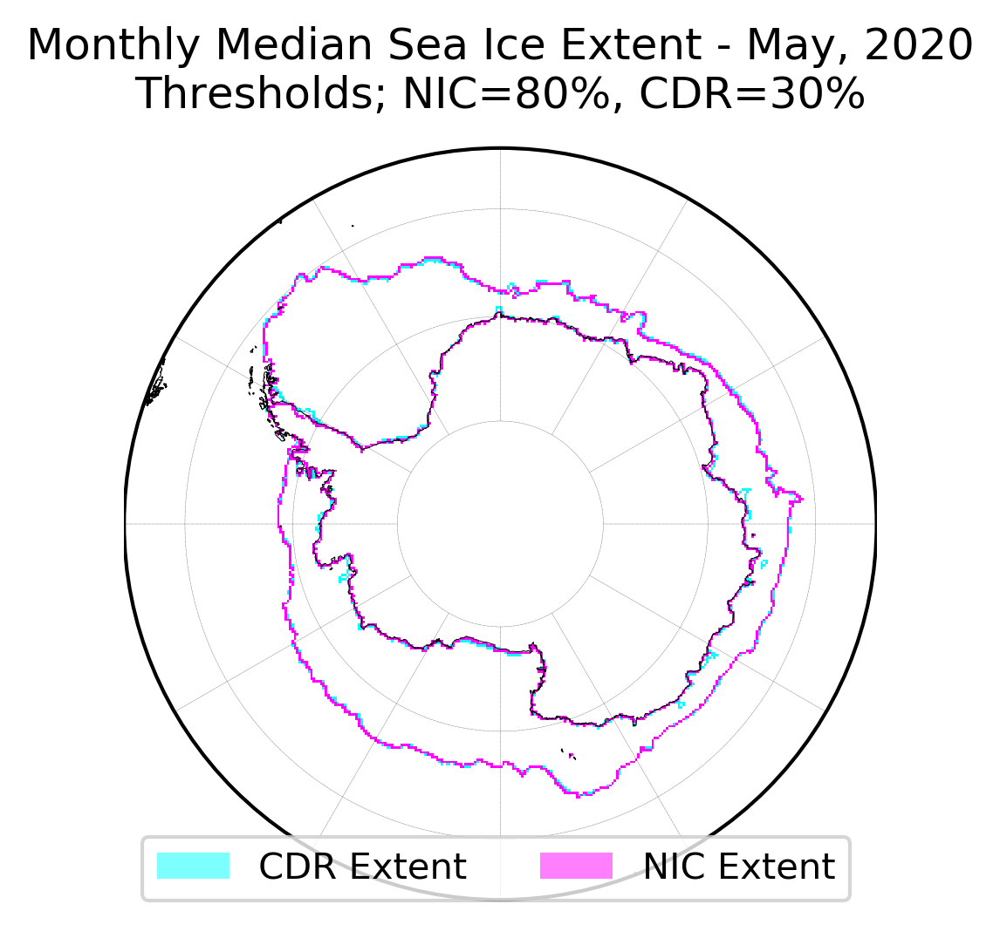

Working on 2020-06-01 00:00:00 to 2020-06-30 00:00:00
Could not run 2020-06-26 00:00:00 because [Errno 2] No such file or directory: 'data\\antarctic\\inputs\\cdr\\20200626_south_cdr.npy'; continuing
Could not run 2020-06-27 00:00:00 because [Errno 2] No such file or directory: 'data\\antarctic\\inputs\\cdr\\20200627_south_cdr.npy'; continuing
Could not run 2020-06-28 00:00:00 because [Errno 2] No such file or directory: 'data\\antarctic\\inputs\\cdr\\20200628_south_cdr.npy'; continuing
Could not run 2020-06-29 00:00:00 because [Errno 2] No such file or directory: 'data\\antarctic\\inputs\\cdr\\20200629_south_cdr.npy'; continuing
Could not run 2020-06-30 00:00:00 because [Errno 2] No such file or directory: 'data\\antarctic\\inputs\\cdr\\20200630_south_cdr.npy'; continuing
Could not run 2020-06-27 00:00:00 because [Errno 2] No such file or directory: 'data\\antarctic\\inputs\\nic\\20200627_south_nic.npy'; continuing
Could not run 2020-06-28 00:00:00 because [Errno 2] No such file or di

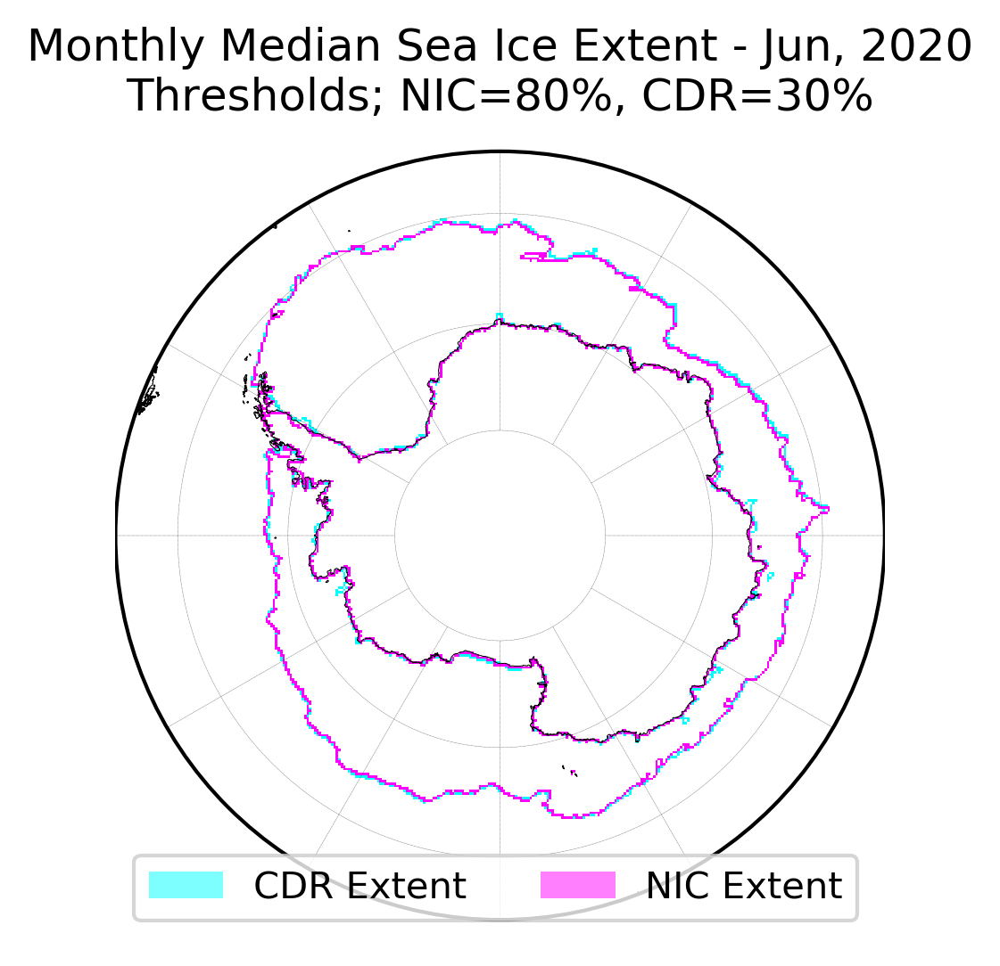

In [18]:
nic_thresh = .8
cdr_thresh = .3

freq = 'MS'
last_day_of_month_offset = pd.offsets.MonthEnd(1)

start_rounded_up = short_term_comparison_start + last_day_of_month_offset
end_rounded_down = end.replace(day=1)

for median_start_date in pd.date_range(start=start_rounded_up, end=end_rounded_down, freq=freq):    
    median_end_date = median_start_date + last_day_of_month_offset
    
    print(f"Working on {median_start_date} to {median_end_date}")
    
    cdr_median_threshold_grid = median_cdr(cdr_thresh, median_start_date, median_end_date, cdr_input_folder, hemi)
    nic_median_threshold_grid = median_nic(nic_thresh, median_start_date, median_end_date, nic_input_folder, hemi)
    
    # Let's only set the pixels on the boundary to True
    cdr_diff_arr = np.diff(cdr_median_threshold_grid, axis=0, prepend=False) | np.diff(cdr_median_threshold_grid, axis=1, prepend=False)
    nic_diff_arr = np.diff(nic_median_threshold_grid, axis=0, prepend=False) | np.diff(nic_median_threshold_grid, axis=1, prepend=False)
    
    output_name = os.path.join("data", 
                               folder_name,
                               "output", 
                               f"{freq}_median",
                               f"{cdr_thresh}_{nic_thresh}_for_{median_start_date:%Y%m%d}_to_{median_end_date:%Y%m%d}.png")
    
    create_basemap_plot(f'Monthly Median Sea Ice Extent - {median_start_date:%b, %Y}\n' \
                        f'Thresholds; NIC={int(100*nic_thresh)}%, CDR={int(100*cdr_thresh)}%',
                        lats, 
                        lons, 
                        meta,
                        [{'grid': cdr_diff_arr, 'color': 'cyan', 'legend_label': 'CDR Extent'}, 
                         {'grid': nic_diff_arr, 'color': 'magenta', 'legend_label': 'NIC Extent'}], 
                        show=True,
                        legend=True,
                        save=output_name)

Finally, let's make an animation to visualize new 30% CDR vs 80% NIC sea ice extent thresholds over time.

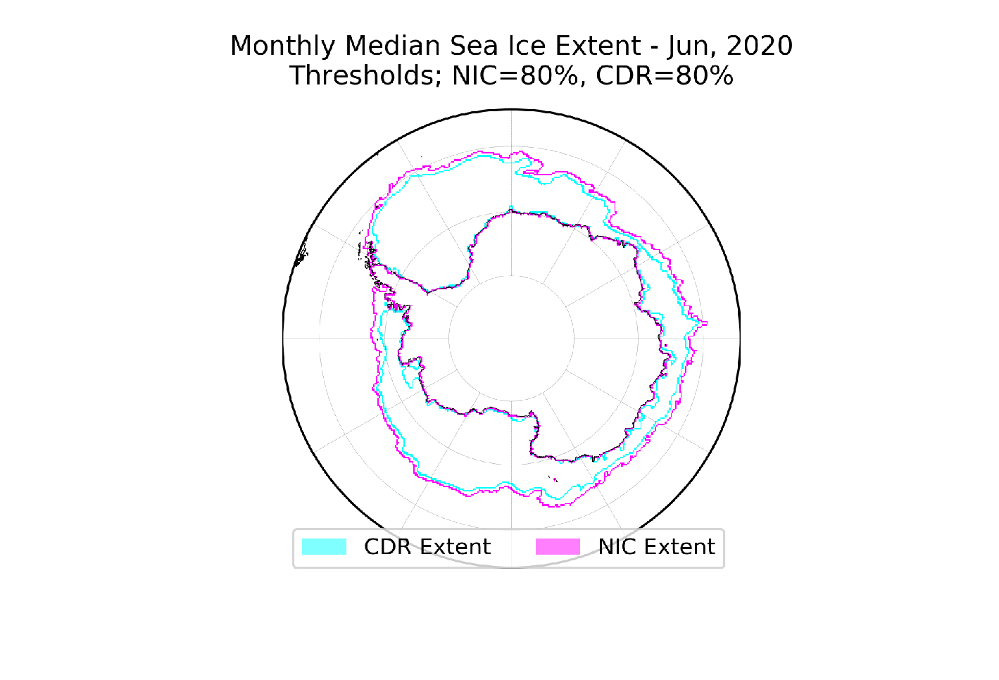

In [21]:
output_dirname = os.path.dirname(output_name)
images_to_animation(output_dirname, os.path.join(output_dirname, 'animation.mp4'))

### References
 - Meier, W. N. 2005. Comparison of Passive Microwave Ice Concentration Algorithm Retrievals with AVHRR Imagery in Arctic Peripheral Seas. IEEE Trans. Geosci. Remote Sens., 43(6): 1324-1337.

 - Liu, Y., Helfrich S., Meier W.N., Dworak R. 2020. Assessment of AMSR2 Ice Extent and Ice Edge in the Arctic Using IMS. Remote Sensing.
